# Importing packages

In [3]:
import pickle
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import integrate
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, MaxPool1D, Conv2D, MaxPool2D,BatchNormalization, GRU
from tensorflow.keras.optimizers import Adam
from sklearn import metrics
import tensorflow as tf
from sklearn.preprocessing import OneHotEncoder
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.preprocessing import OneHotEncoder
from keras.layers import LSTM
from keras.layers.embeddings import Embedding
from keras.layers import SimpleRNN
from sklearn.metrics import accuracy_score

# 1. Download the Dataset

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
import os
os.chdir('/content/drive/MyDrive/RML2016_dataset/') 
Data = pickle.load(open("RML2016.10b.dat",'rb'), encoding = 'bytes')
snrs, mods = map(lambda j: sorted(list(set(map(lambda x: x[j], Data.keys())))), [1,0])

In [6]:
print(f"Mods: {mods}")
print(f"SNRs: {snrs}")

Mods: [b'8PSK', b'AM-DSB', b'BPSK', b'CPFSK', b'GFSK', b'PAM4', b'QAM16', b'QAM64', b'QPSK', b'WBFM']
SNRs: [-20, -18, -16, -14, -12, -10, -8, -6, -4, -2, 0, 2, 4, 6, 8, 10, 12, 14, 16, 18]


In [7]:
samples = []     
snr_mod_labels = []
for snr in snrs:
  x = []
  y = []
  curr_snr_labels = []
  for mod in mods:
    x.append(Data[(mod,snr)])
    y.append([mod] * Data[(mod,snr)].shape[0])
    curr_snr_labels.append([snr, mod] * Data[(mod,snr)].shape[0])
  y = np.array(y)
  curr_snr_labels = np.array(curr_snr_labels)
  snr_mod_labels.append(curr_snr_labels.reshape((int(curr_snr_labels.shape[1]/2) * curr_snr_labels.shape[0], 2)))
  samples.append(np.vstack(x))

samples = np.array(samples)
snr_mod_labels = np.array(snr_mod_labels)

In [8]:
print(samples.shape)
print(snr_mod_labels.shape)

(20, 60000, 2, 128)
(20, 60000, 2)


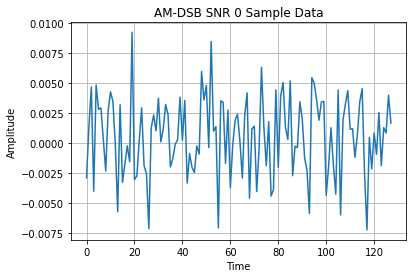

In [9]:
plt.plot(Data[b'AM-DSB',0][2,0])
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("AM-DSB SNR 0 Sample Data")
plt.grid(b=True, axis='both')

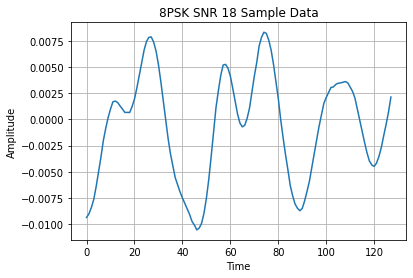

In [10]:
plt.plot(Data[b'8PSK',18][2,0])
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.title("8PSK SNR 18 Sample Data")
plt.grid(b=True, axis='both')

# General functions

In [11]:
def reshape_data_for_cnn(tr_data, val_data, tst_data):
  tr_data = tr_data.reshape((tr_data.shape[0], tr_data.shape[1], tr_data.shape[2], 1))
  val_data = val_data.reshape((val_data.shape[0], val_data.shape[1], val_data.shape[2], 1))
  tst_data = tst_data.reshape((tst_data.shape[0], tst_data.shape[1], tst_data.shape[2], 1))

  return tr_data, val_data, tst_data

In [12]:
def reshape_data_for_rnn_lstm(tr_data, val_data, tst_data):
  tr_data = tr_data.reshape(tr_data.shape[0], tr_data.shape[1], tr_data.shape[2])
  val_data = val_data.reshape(val_data.shape[0], val_data.shape[1], val_data.shape[2])
  tst_data = tst_data.reshape(tst_data.shape[0], tst_data.shape[1], tst_data.shape[2])

  return tr_data, val_data, tst_data

# Data Splitting And Balancing

In [13]:
#Reshaping dataset
samples = samples.reshape((samples.shape[0] * samples.shape[1], samples.shape[2], samples.shape[3]))
labels = snr_mod_labels.reshape((-1, 2)) # Notic that the labels are at this format [snr, modulation]

In [14]:
print('samples shape:', samples.shape)
print('labels shape:', labels.shape)

samples shape: (1200000, 2, 128)
labels shape: (1200000, 2)


In [15]:
#Splitting data
training_val_data, testing_data, training_val_pair_labels, testing_pair_labels = train_test_split(samples, labels,stratify=labels, shuffle=True, test_size=0.3)
training_data, validation_data, training_pair_labels, validation_pair_labels =  train_test_split(training_val_data, training_val_pair_labels,stratify=training_val_pair_labels, shuffle=True, test_size=0.05)

In [16]:
del samples

In [17]:
training_labels = training_pair_labels[:, 1]
validation_labels = validation_pair_labels[:, 1]

In [18]:
print('training data shape:', training_data.shape)
print('training labels shape:', training_labels.shape)
print('validation data shape:', validation_data.shape)
print('validation labels shape:', validation_labels.shape)
print('testing data shape:', testing_data.shape)
print('testing labels shape:', testing_pair_labels.shape)

training data shape: (798000, 2, 128)
training labels shape: (798000,)
validation data shape: (42000, 2, 128)
validation labels shape: (42000,)
testing data shape: (360000, 2, 128)
testing labels shape: (360000, 2)


In [19]:
unique, counts = np.unique(training_labels, return_counts=True)
print('training:\t', dict(zip(unique, counts)))
unique, counts = np.unique(validation_labels, return_counts=True)
print('validation:\t', dict(zip(unique, counts)))
unique, counts = np.unique(testing_pair_labels, return_counts=True)
print('testing:\t', dict(zip(unique, counts)))

training:	 {b'8PSK': 79800, b'AM-DSB': 79800, b'BPSK': 79800, b'CPFSK': 79800, b'GFSK': 79800, b'PAM4': 79800, b'QAM16': 79800, b'QAM64': 79800, b'QPSK': 79800, b'WBFM': 79800}
validation:	 {b'8PSK': 4200, b'AM-DSB': 4200, b'BPSK': 4200, b'CPFSK': 4200, b'GFSK': 4200, b'PAM4': 4200, b'QAM16': 4200, b'QAM64': 4200, b'QPSK': 4200, b'WBFM': 4200}
testing:	 {b'-10': 18000, b'-12': 18000, b'-14': 18000, b'-16': 18000, b'-18': 18000, b'-2': 18000, b'-20': 18000, b'-4': 18000, b'-6': 18000, b'-8': 18000, b'0': 18000, b'10': 18000, b'12': 18000, b'14': 18000, b'16': 18000, b'18': 18000, b'2': 18000, b'4': 18000, b'6': 18000, b'8': 18000, b'8PSK': 36000, b'AM-DSB': 36000, b'BPSK': 36000, b'CPFSK': 36000, b'GFSK': 36000, b'PAM4': 36000, b'QAM16': 36000, b'QAM64': 36000, b'QPSK': 36000, b'WBFM': 36000}


In [20]:
# converting labels to one hot encoding
training_onehot = OneHotEncoder(sparse = False).fit_transform(training_labels.reshape(-1,1))
validation_onehot = OneHotEncoder(sparse = False).fit_transform(validation_labels.reshape(-1,1))

In [21]:
print('training onehot encoding shape:', training_onehot.shape)
print('validation onehot encoding shape:', validation_onehot.shape)

training onehot encoding shape: (798000, 10)
validation onehot encoding shape: (42000, 10)


# Scoring functions

In [22]:
def model_pred_and_accuracy(model, testing_data, testing_labels):
  pred = model.predict(testing_data)
  decoded_pred = np.argmax(pred, axis=1)
  testing_labels = np.argmax(testing_labels, axis=1)

  return pred, accuracy_score(testing_labels, decoded_pred)

In [23]:
def confusion_matrixf(pred, actual, title):
  actual_decode = np.argmax(actual, axis=1)
  pred_decode = np.argmax(pred, axis=1)
  confusion_mtx = confusion_matrix(actual_decode, pred_decode)
  plt.figure(figsize=(10, 8))
  sns.heatmap(confusion_mtx, xticklabels=mods, yticklabels=mods, annot=True, fmt='g')
  plt.xlabel('Prediction')
  plt.ylabel('Actual')
  plt.title(title)
  plt.show()

In [24]:
def plot_model_history(history, title=''):
  pd.DataFrame(history.history).plot(figsize=(8,5))
  plt.title(title)
  plt.show()

In [25]:
def plot_snr_vs_acc(snr, acc):
  plt.plot(snr, acc, label = "SNR vs Accuracy")
  plt.xlabel('SNR')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.show()

In [26]:
def model_scoring(model, history, testing_data, testing_pair_labels):
  sorted_idx = testing_pair_labels[:, 0].astype(int).argsort() # sort by snr value
  testing_data = testing_data[sorted_idx] # to sort samples by snr
  testing_pair_labels = testing_pair_labels[sorted_idx] # to sort labels by snr

  SNRs = testing_pair_labels[:, 0]
  modulations = testing_pair_labels[:, 1]
  unique_snr, snr_count = np.unique(SNRs, return_counts=True)
  snr_count_dict = dict(zip(unique, counts))
  
  curr_sample = 0
  snr = []
  acc = []
  for i in range(len(unique_snr)):
    curr_snr = SNRs[curr_sample]
    curr_snr_samples = []
    curr_snr_labels = []
    for j in range(snr_count_dict[curr_snr]):
      curr_snr_samples.append(testing_data[curr_sample])
      curr_snr_labels.append(modulations[curr_sample])
      curr_sample += 1

    curr_snr_samples = np.array(curr_snr_samples)
    curr_snr_labels = np.array(curr_snr_labels)
    onehot_labels = OneHotEncoder(sparse = False).fit_transform(curr_snr_labels.reshape(-1,1))

    pred, accuracy = model_pred_and_accuracy(model, curr_snr_samples, onehot_labels)
    snr.append(int(curr_snr.decode()))
    acc.append(accuracy)
    print('Accuracy at SNR = ' + curr_snr.decode() + ' is ' + str(accuracy) + '%')
    confusion_matrixf(pred, onehot_labels, 'SNR: ' + curr_snr.decode())
  
  plot_snr_vs_acc(snr, acc)

# Normal Feature Space

## CNN Model

In [ ]:
training_data, validation_data, testing_data = reshape_data_for_cnn(training_data, validation_data, testing_data)

In [ ]:
print('training data shape:', training_data.shape)
print('validation data shape:', validation_data.shape)
print('testing data shape:', testing_data.shape)

training data shape: (798000, 2, 128, 1)
validation data shape: (42000, 2, 128, 1)
testing data shape: (360000, 2, 128, 1)


In [ ]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [ ]:
cnn_model = Sequential()
cnn_model.add(Conv2D(256, 3, activation='relu', padding='same'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Conv2D(64, 3, strides=2, activation='relu', padding='same'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Flatten())
cnn_model.add(Dense(128, activation='relu' ))  
cnn_model.add(Dense(10,  activation='softmax'))
cnn_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))

In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = cnn_model.fit(training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

Epoch 1/200
1559/1559 [==============================] - ETA: 0s - loss: 1.6489 - accuracy: 0.3475
Epoch 1: val_loss improved from inf to 1.33986, saving model to saved_models/classification.hdf5
1559/1559 [==============================] - 77s 41ms/step - loss: 1.6489 - accuracy: 0.3475 - val_loss: 1.3399 - val_accuracy: 0.4589
Epoch 2/200
1559/1559 [==============================] - ETA: 0s - loss: 1.3080 - accuracy: 0.4637
Epoch 2: val_loss improved from 1.33986 to 1.22187, saving model to saved_models/classification.hdf5
1559/1559 [==============================] - 65s 41ms/step - loss: 1.3080 - accuracy: 0.4637 - val_loss: 1.2219 - val_accuracy: 0.4835
Epoch 3/200
1559/1559 [==============================] - ETA: 0s - loss: 1.2234 - accuracy: 0.4944
Epoch 3: val_loss improved from 1.22187 to 1.14211, saving model to saved_models/classification.hdf5
1559/1559 [==============================] - 65s 42ms/step - loss: 1.2234 - accuracy: 0.4944 - val_loss: 1.1421 - val_accuracy: 0.5217

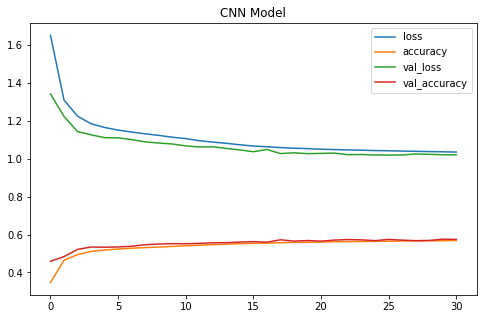

Accuracy at SNR = -20 is 0.10733333333333334%


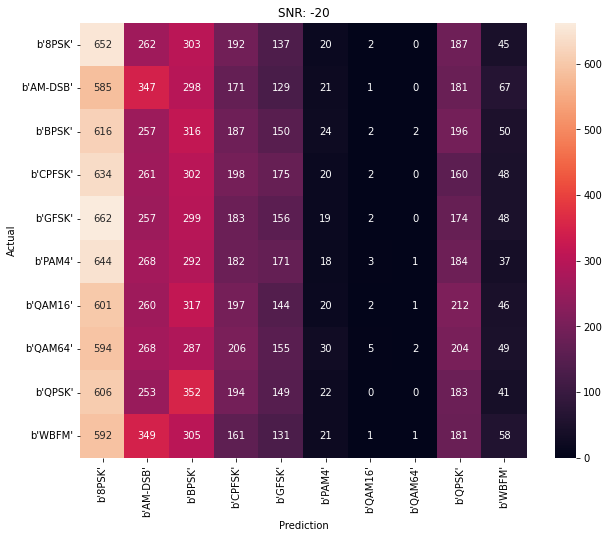

Accuracy at SNR = -18 is 0.10911111111111112%


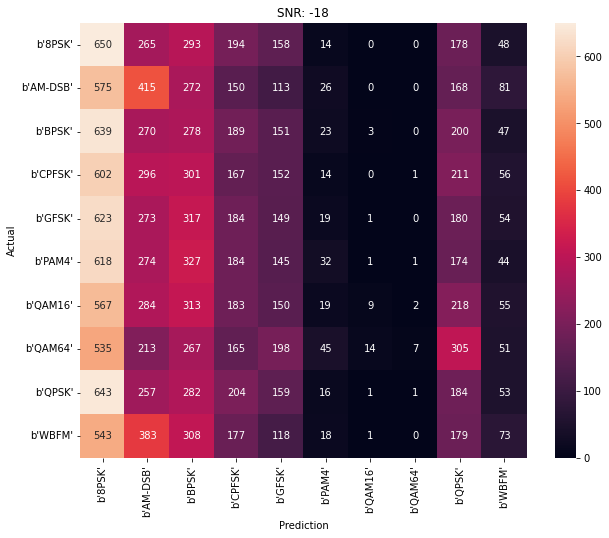

Accuracy at SNR = -16 is 0.11744444444444445%


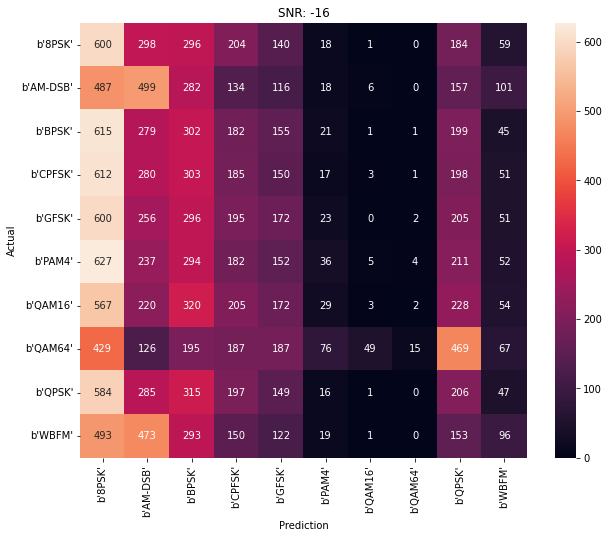

Accuracy at SNR = -14 is 0.13833333333333334%


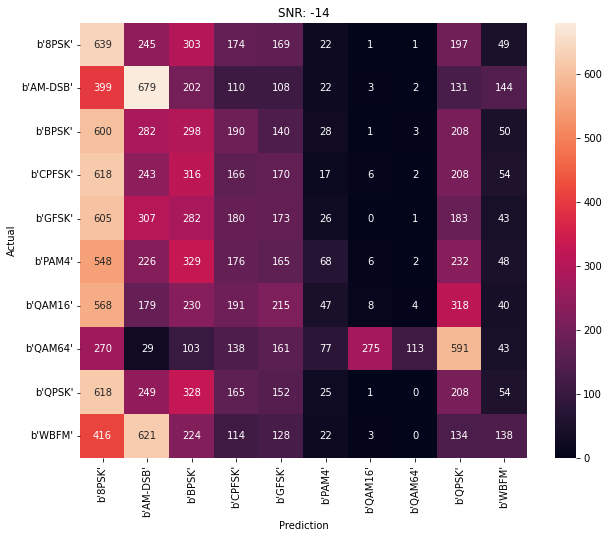

Accuracy at SNR = -12 is 0.17444444444444446%


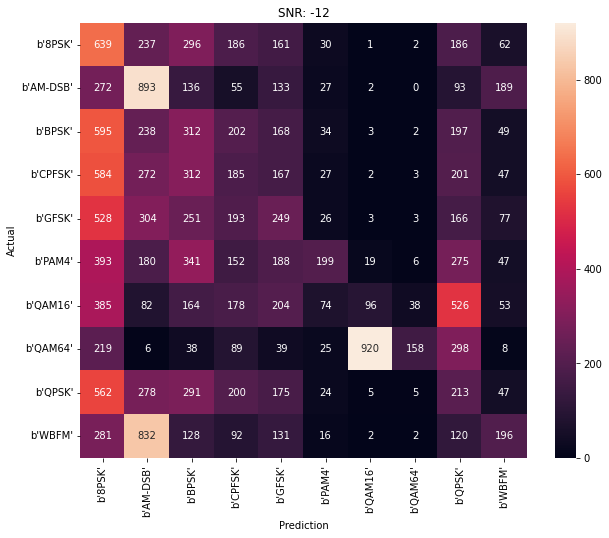

Accuracy at SNR = -10 is 0.2708333333333333%


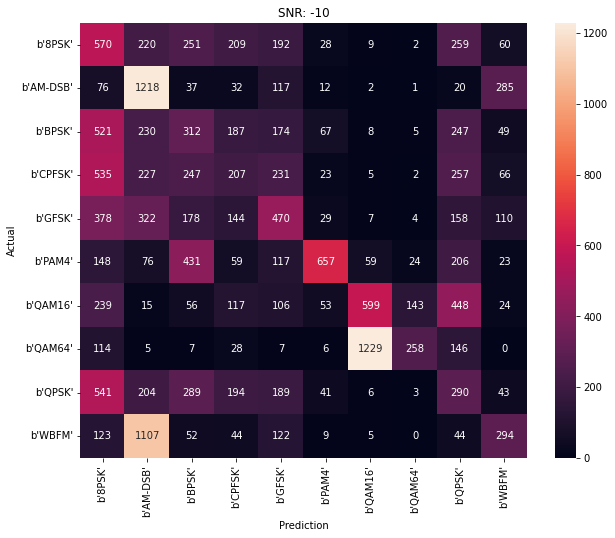

Accuracy at SNR = -8 is 0.3826111111111111%


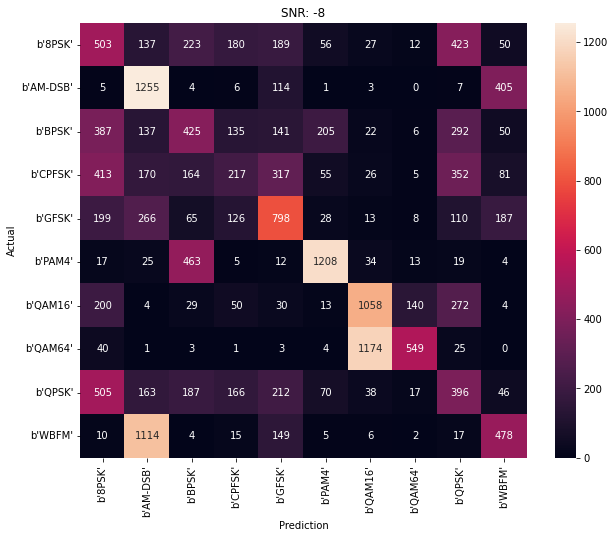

Accuracy at SNR = -6 is 0.5133333333333333%


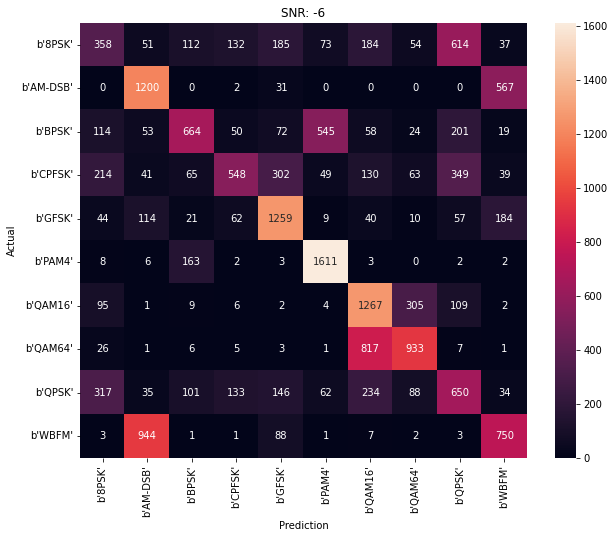

Accuracy at SNR = -4 is 0.6201666666666666%


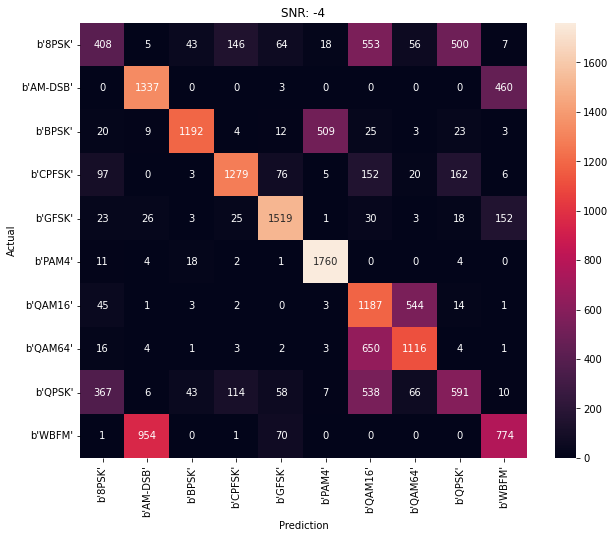

Accuracy at SNR = -2 is 0.7220555555555556%


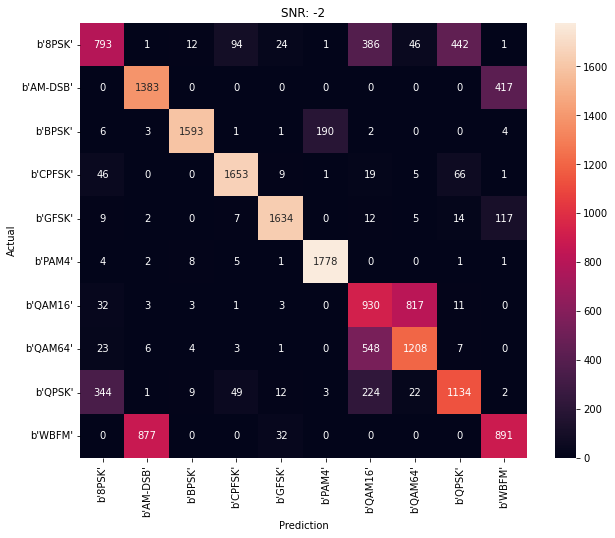

Accuracy at SNR = 0 is 0.7967777777777778%


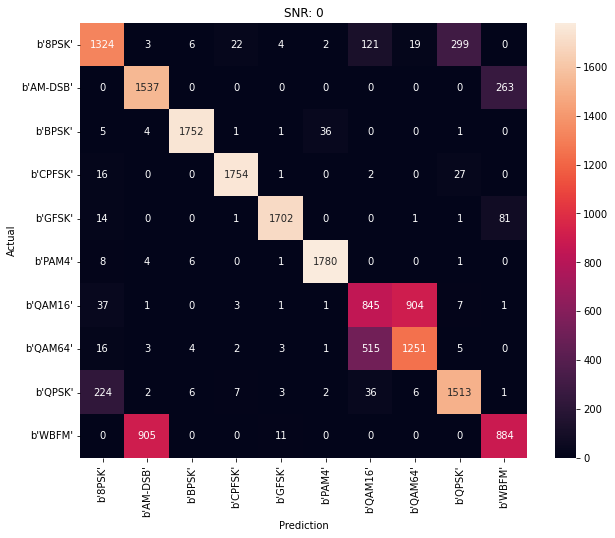

Accuracy at SNR = 2 is 0.8275555555555556%


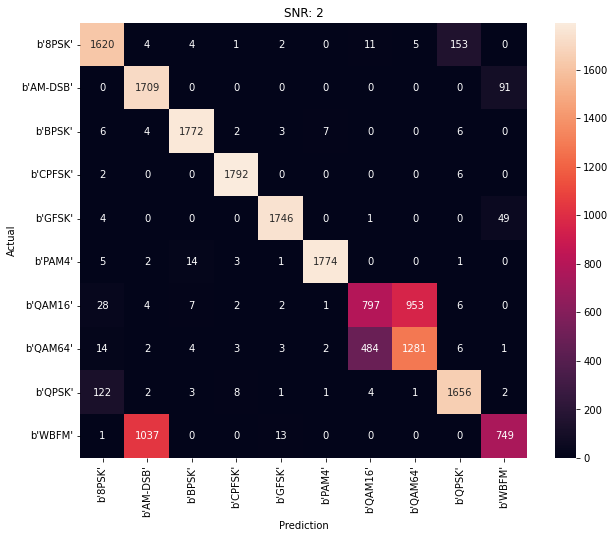

Accuracy at SNR = 4 is 0.8345555555555556%


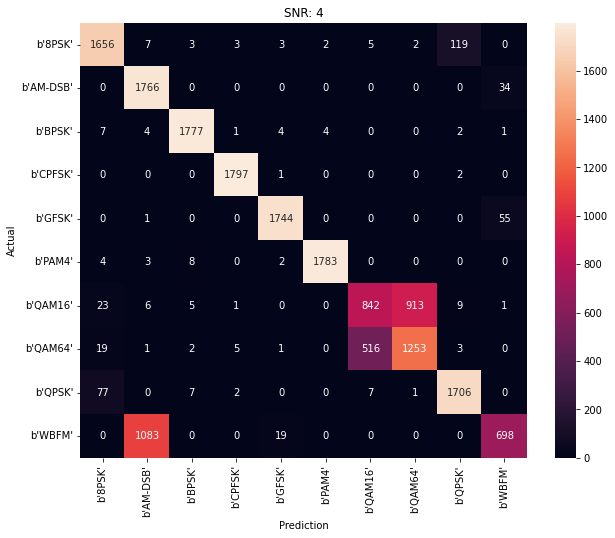

Accuracy at SNR = 6 is 0.8326666666666667%


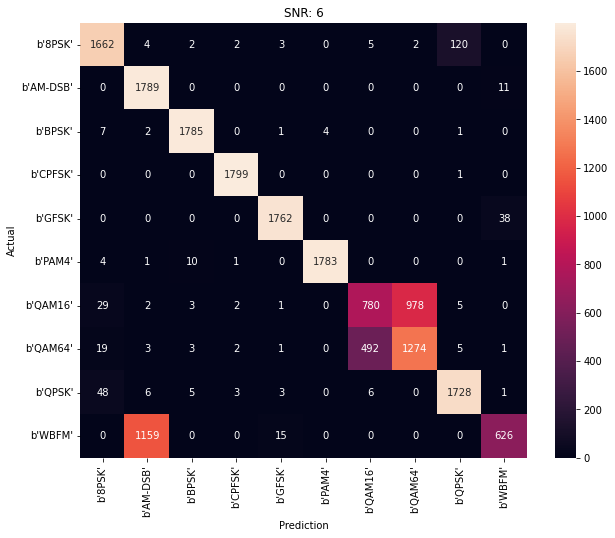

Accuracy at SNR = 8 is 0.8443888888888889%


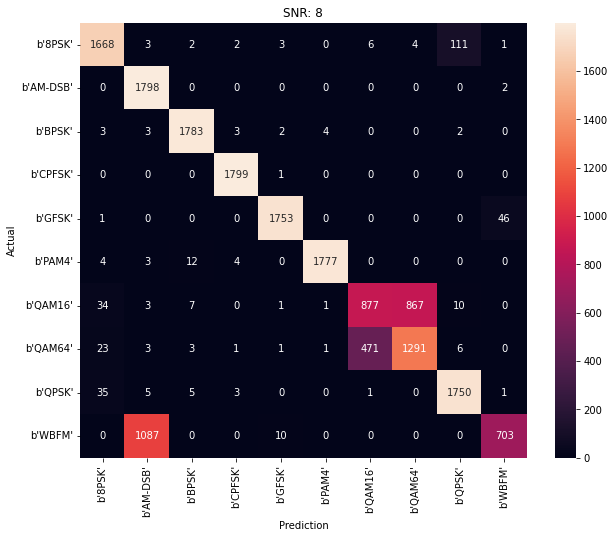

Accuracy at SNR = 10 is 0.8384444444444444%


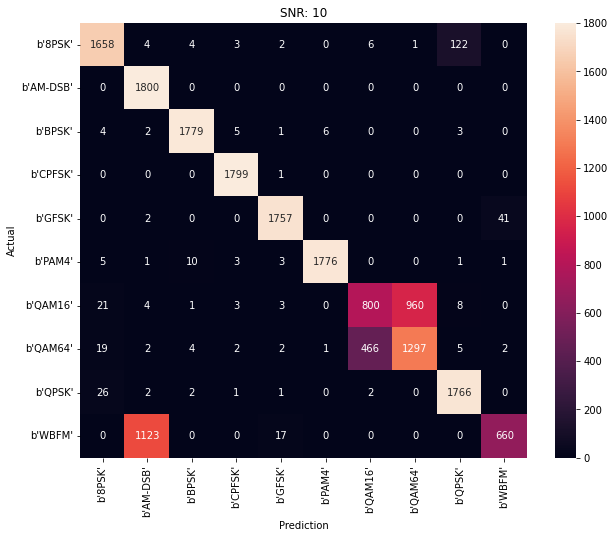

Accuracy at SNR = 12 is 0.8380555555555556%


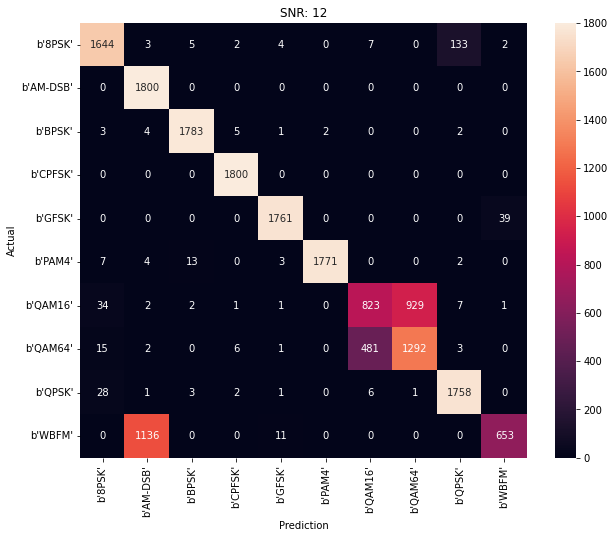

Accuracy at SNR = 14 is 0.8358888888888889%


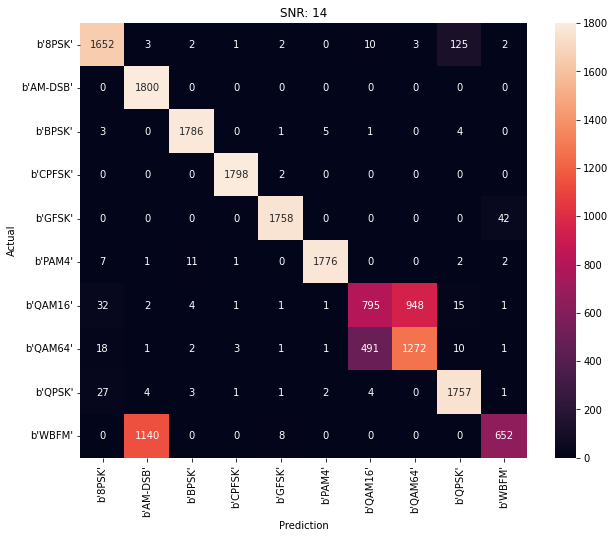

Accuracy at SNR = 16 is 0.8382222222222222%


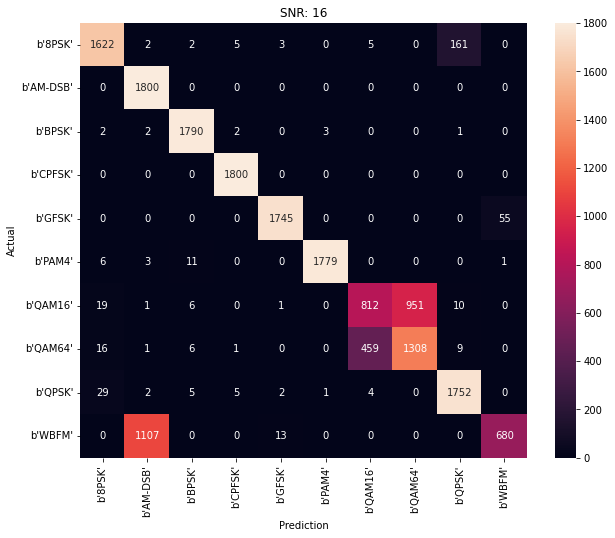

Accuracy at SNR = 18 is 0.8361111111111111%


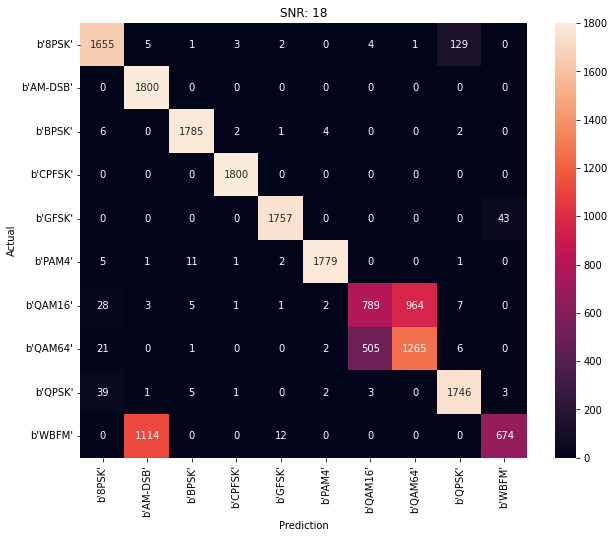

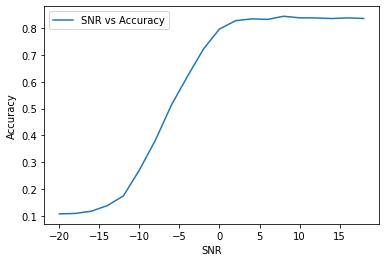

In [ ]:
plot_model_history(history, 'CNN Model')
model_scoring(cnn_model, history, testing_data, testing_pair_labels)

## Reshaping data for RNN and LSTM models

In [ ]:
training_data, validation_data, testing_data = reshape_data_for_rnn_lstm(training_data, validation_data, testing_data)

In [ ]:
print('training data shape:', training_data.shape)
print('validation data shape:', validation_data.shape)
print('testing data shape:', testing_data.shape)

training data shape: (798000, 2, 128)
validation data shape: (42000, 2, 128)
testing data shape: (360000, 2, 128)


## RNN Model

In [ ]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [ ]:
rnn_model = Sequential()
rnn_model.add(SimpleRNN(128, activation='relu'))
#rnn_model.add(Dropout(0.5))
rnn_model.add(Dense(10, activation='softmax'))
rnn_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))


In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/rnn_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = rnn_model.fit(training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

Epoch 1/200
1551/1559 [============================>.] - ETA: 0s - loss: 1.8926 - accuracy: 0.2596
Epoch 1: val_loss improved from inf to 1.75984, saving model to saved_models/rnn_classification.hdf5
1559/1559 [==============================] - 9s 5ms/step - loss: 1.8918 - accuracy: 0.2598 - val_loss: 1.7598 - val_accuracy: 0.2990
Epoch 2/200
1552/1559 [============================>.] - ETA: 0s - loss: 1.7130 - accuracy: 0.3177
Epoch 2: val_loss improved from 1.75984 to 1.69200, saving model to saved_models/rnn_classification.hdf5
1559/1559 [==============================] - 8s 5ms/step - loss: 1.7129 - accuracy: 0.3178 - val_loss: 1.6920 - val_accuracy: 0.3291
Epoch 3/200
1558/1559 [============================>.] - ETA: 0s - loss: 1.6600 - accuracy: 0.3392
Epoch 3: val_loss improved from 1.69200 to 1.64878, saving model to saved_models/rnn_classification.hdf5
1559/1559 [==============================] - 8s 5ms/step - loss: 1.6599 - accuracy: 0.3392 - val_loss: 1.6488 - val_accuracy: 

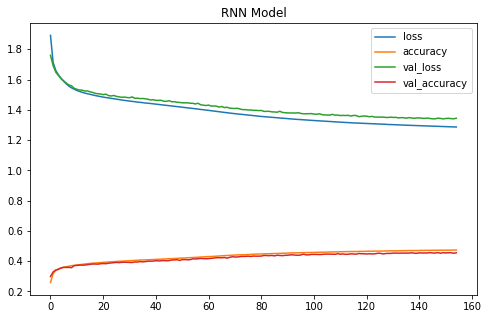

Accuracy at SNR = -20 is 0.10611111111111111%


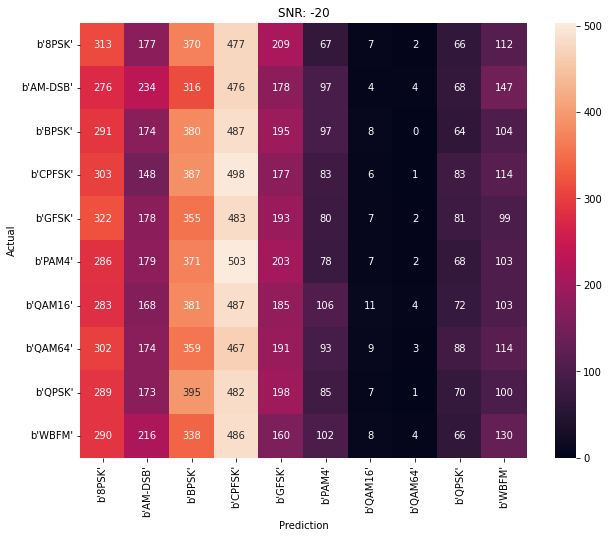

Accuracy at SNR = -18 is 0.10566666666666667%


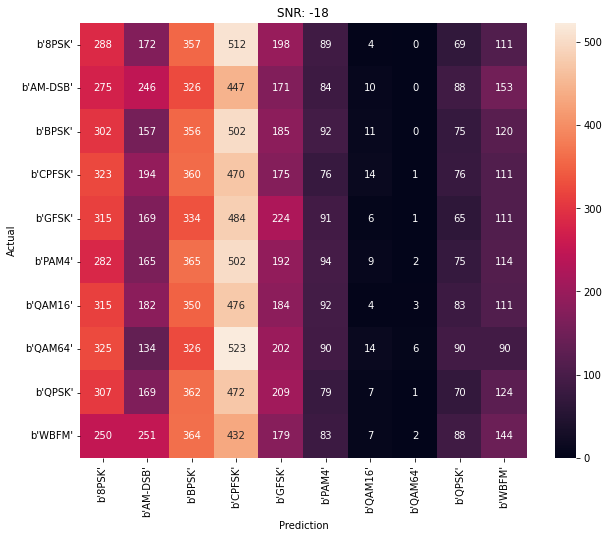

Accuracy at SNR = -16 is 0.11383333333333333%


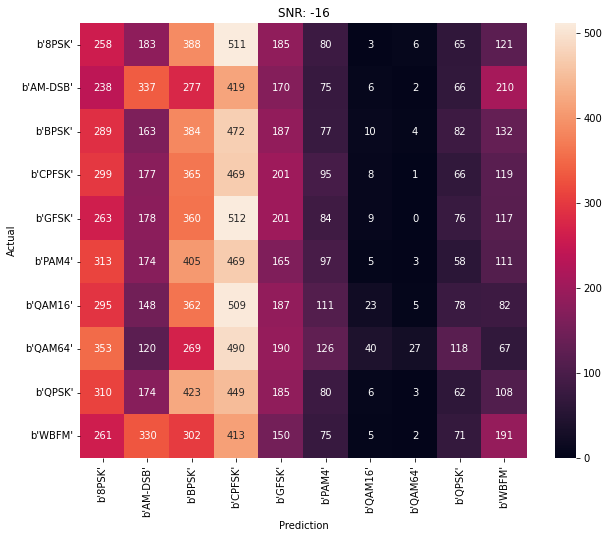

Accuracy at SNR = -14 is 0.1388888888888889%


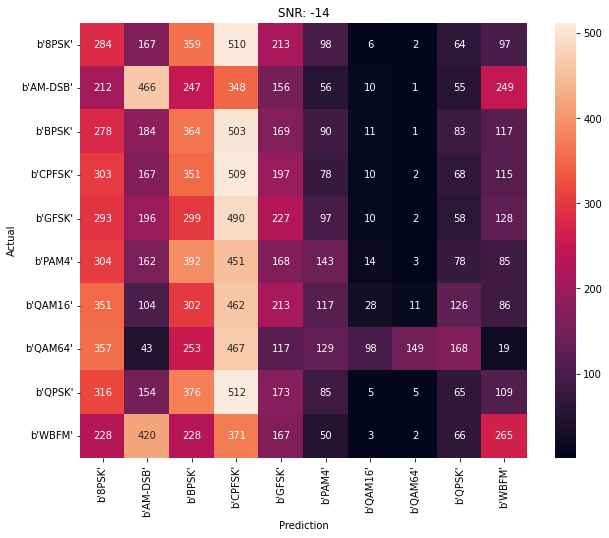

Accuracy at SNR = -12 is 0.17966666666666667%


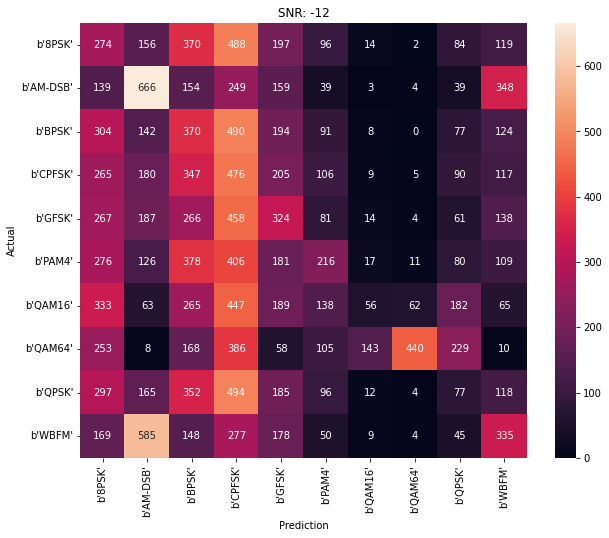

Accuracy at SNR = -10 is 0.24244444444444443%


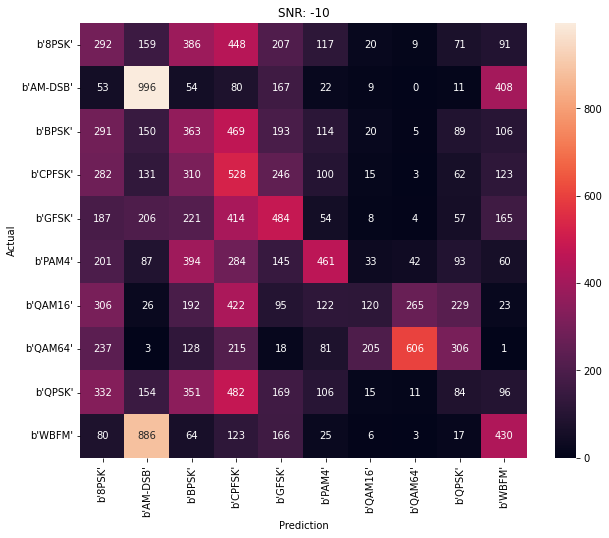

Accuracy at SNR = -8 is 0.3013888888888889%


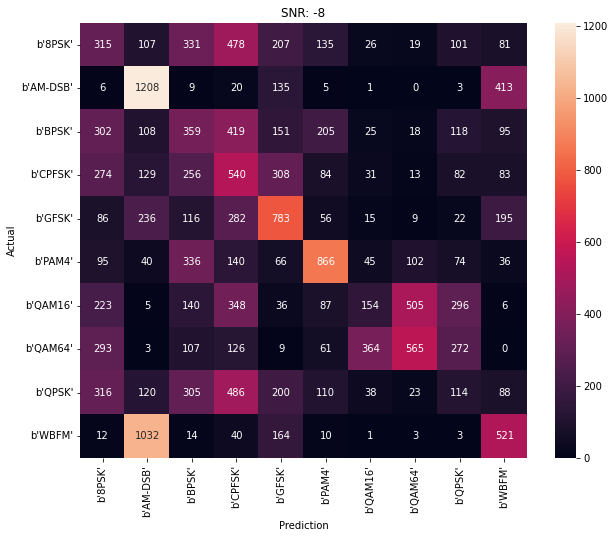

Accuracy at SNR = -6 is 0.3718888888888889%


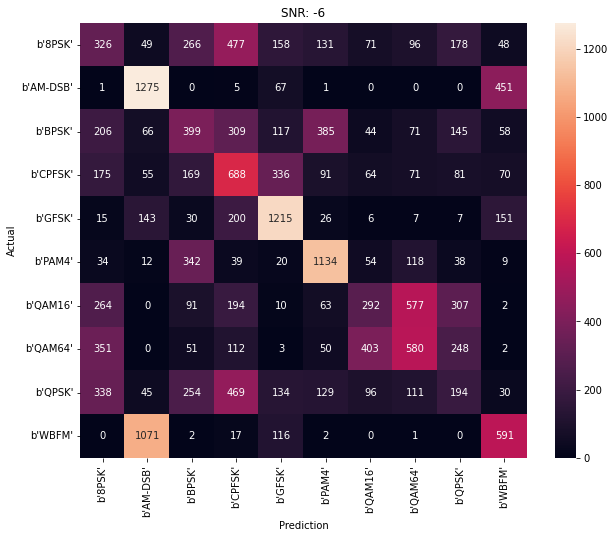

Accuracy at SNR = -4 is 0.4439444444444444%


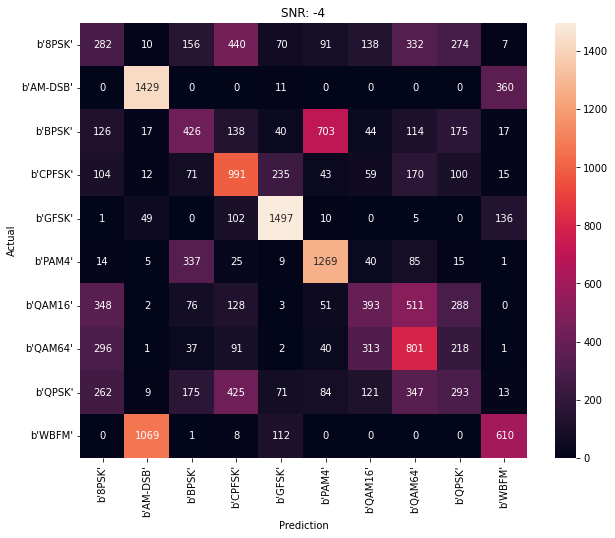

Accuracy at SNR = -2 is 0.5162222222222222%


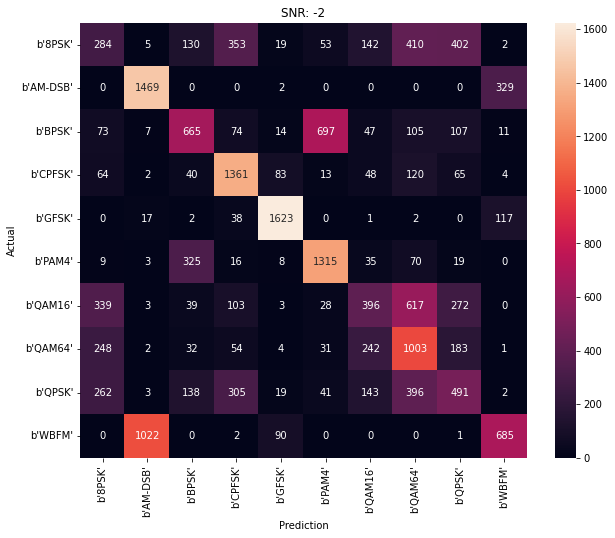

Accuracy at SNR = 0 is 0.5743333333333334%


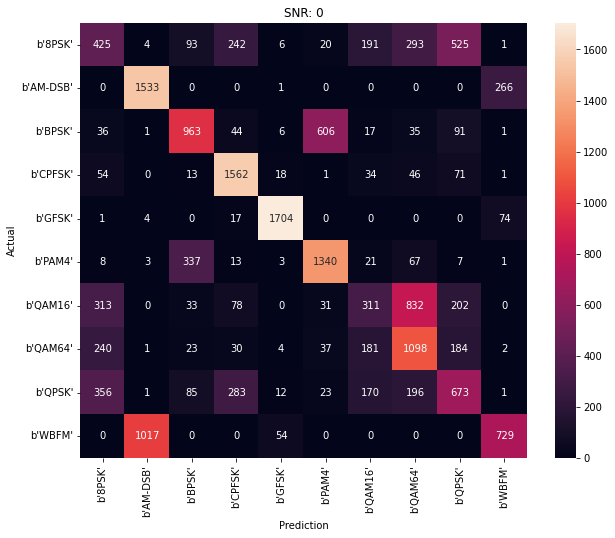

Accuracy at SNR = 2 is 0.6258333333333334%


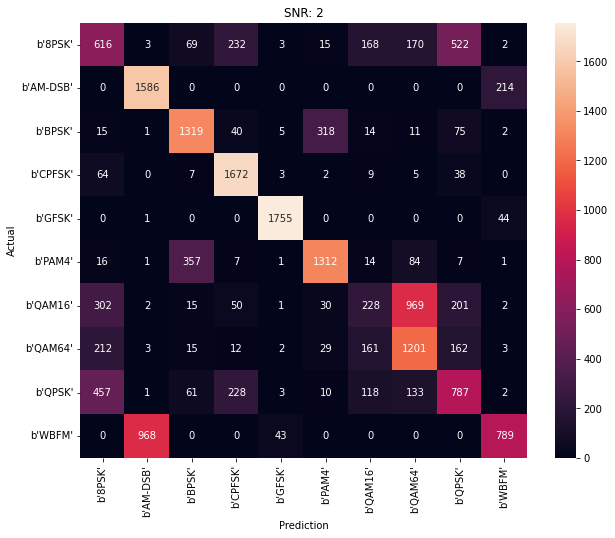

Accuracy at SNR = 4 is 0.6555%


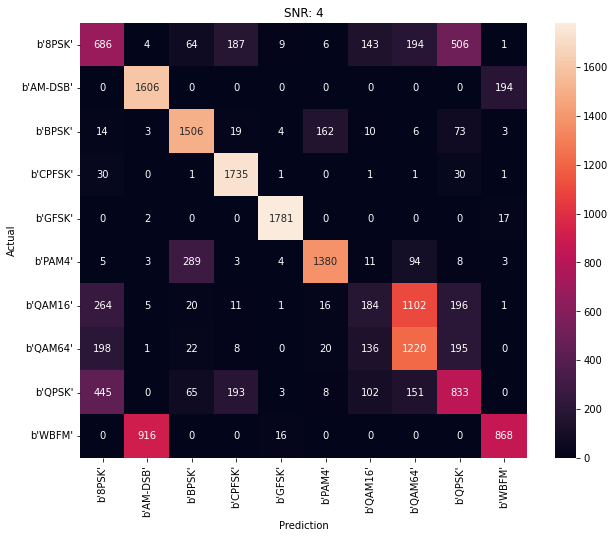

Accuracy at SNR = 6 is 0.6672777777777777%


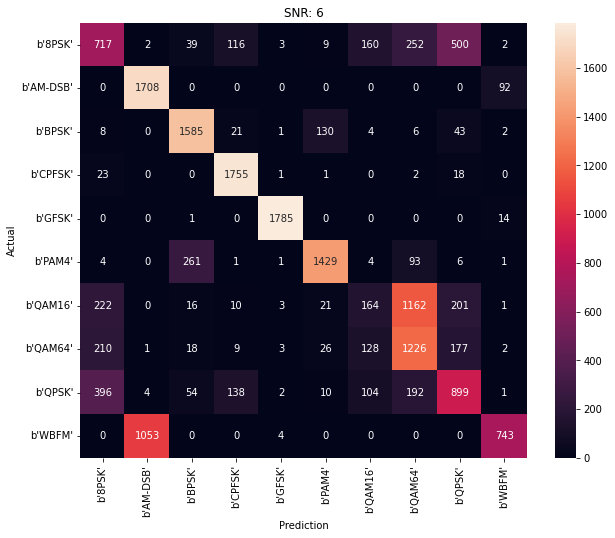

Accuracy at SNR = 8 is 0.6755%


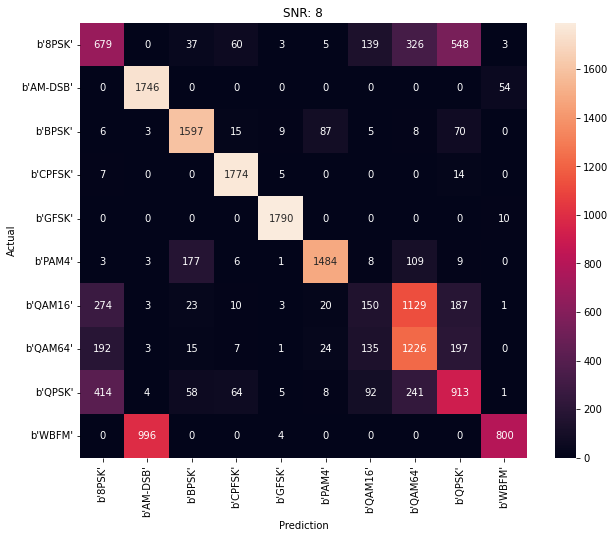

Accuracy at SNR = 10 is 0.6733888888888889%


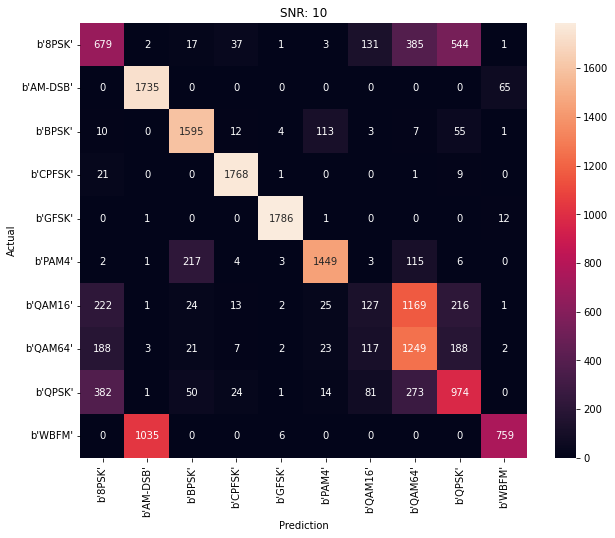

Accuracy at SNR = 12 is 0.6708888888888889%


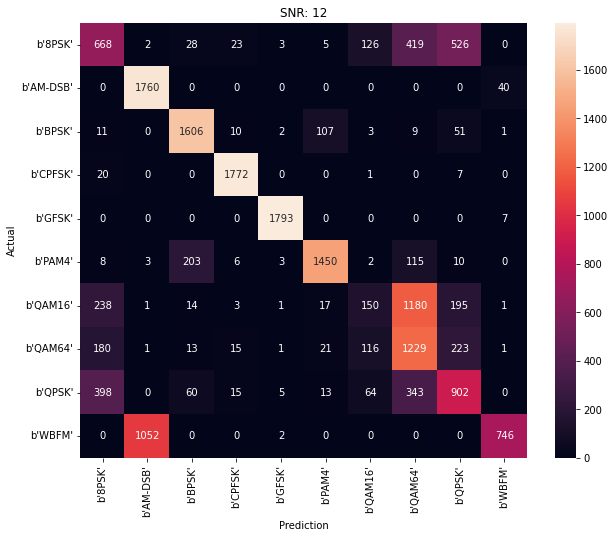

Accuracy at SNR = 14 is 0.6748888888888889%


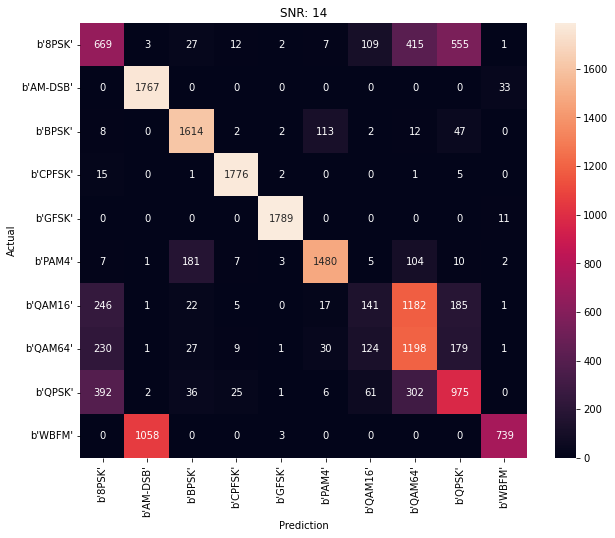

Accuracy at SNR = 16 is 0.6738333333333333%


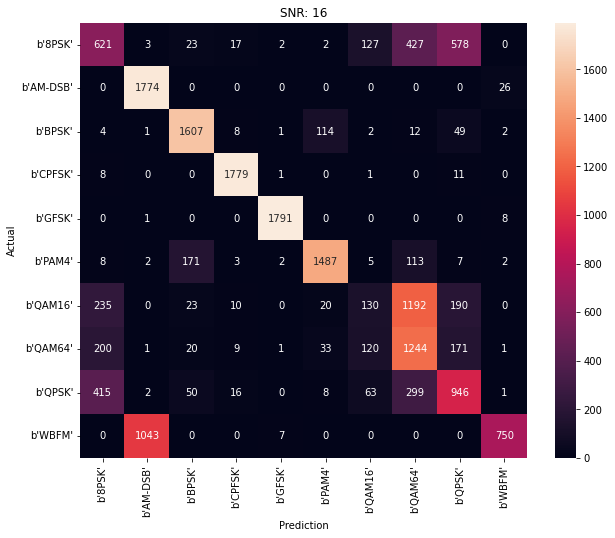

Accuracy at SNR = 18 is 0.6809444444444445%


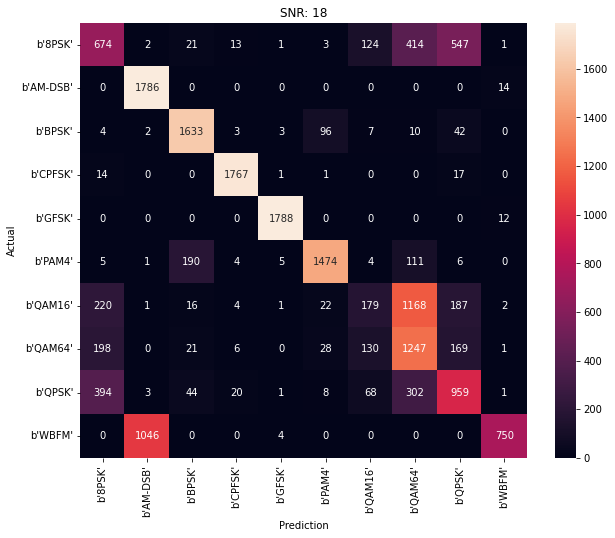

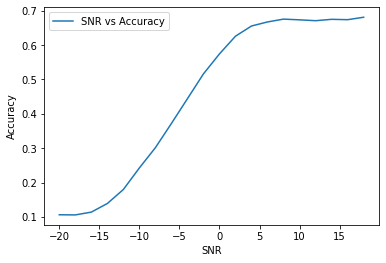

In [ ]:
plot_model_history(history, 'RNN Model')
model_scoring(rnn_model, history, testing_data, testing_pair_labels)

## LSTM Model

In [ ]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [ ]:
lstm_model = Sequential()
lstm_model.add(LSTM(256))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(10, activation='softmax'))
lstm_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))

In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/lstm_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = lstm_model.fit(training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

Epoch 1/200
1557/1559 [============================>.] - ETA: 0s - loss: 2.0928 - accuracy: 0.1842
Epoch 1: val_loss improved from inf to 2.05699, saving model to saved_models/lstm_classification.hdf5
1559/1559 [==============================] - 10s 5ms/step - loss: 2.0929 - accuracy: 0.1842 - val_loss: 2.0570 - val_accuracy: 0.1974
Epoch 2/200
1550/1559 [============================>.] - ETA: 0s - loss: 2.0312 - accuracy: 0.2105
Epoch 2: val_loss improved from 2.05699 to 1.99869, saving model to saved_models/lstm_classification.hdf5
1559/1559 [==============================] - 7s 5ms/step - loss: 2.0310 - accuracy: 0.2106 - val_loss: 1.9987 - val_accuracy: 0.2251
Epoch 3/200
1555/1559 [============================>.] - ETA: 0s - loss: 1.9714 - accuracy: 0.2384
Epoch 3: val_loss improved from 1.99869 to 1.93565, saving model to saved_models/lstm_classification.hdf5
1559/1559 [==============================] - 7s 5ms/step - loss: 1.9714 - accuracy: 0.2385 - val_loss: 1.9357 - val_accura

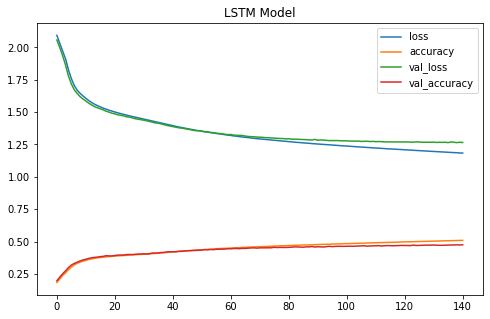

Accuracy at SNR = -20 is 0.10622222222222222%


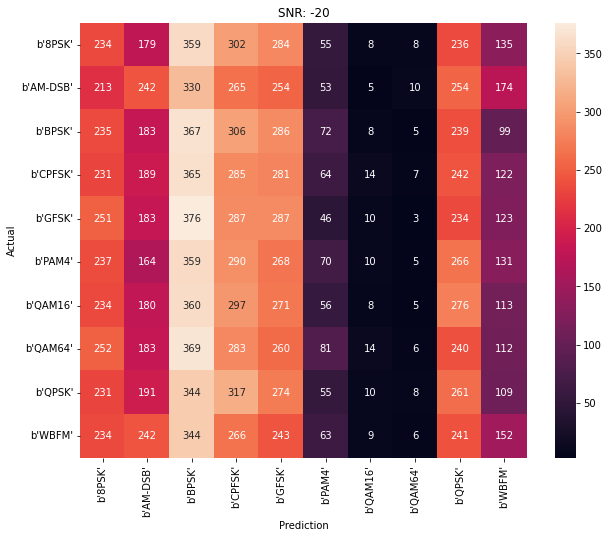

Accuracy at SNR = -18 is 0.10972222222222222%


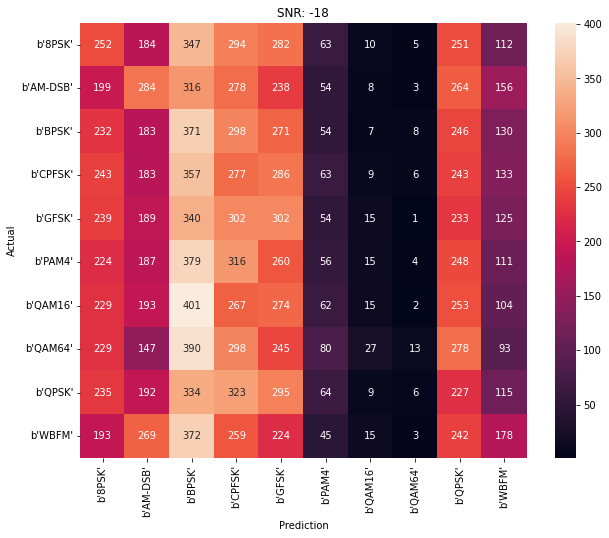

Accuracy at SNR = -16 is 0.11977777777777777%


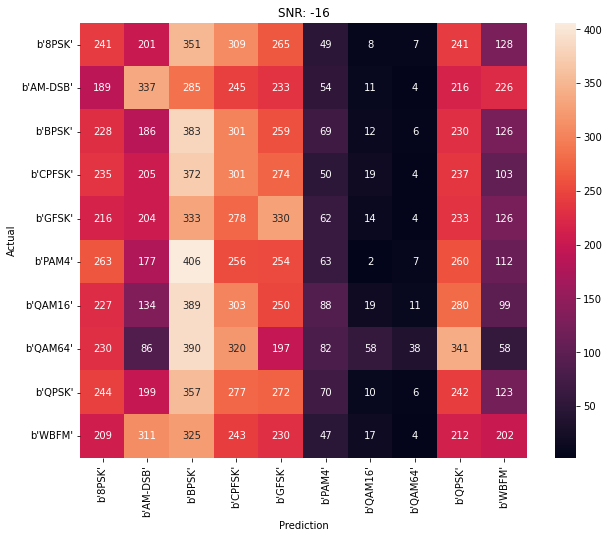

Accuracy at SNR = -14 is 0.1308888888888889%


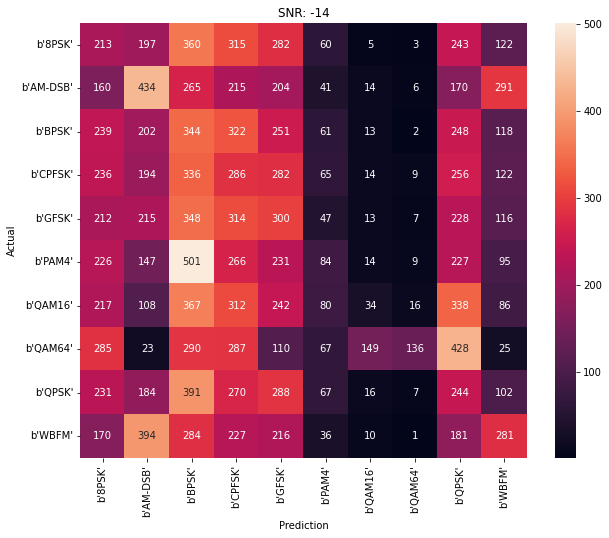

Accuracy at SNR = -12 is 0.17227777777777778%


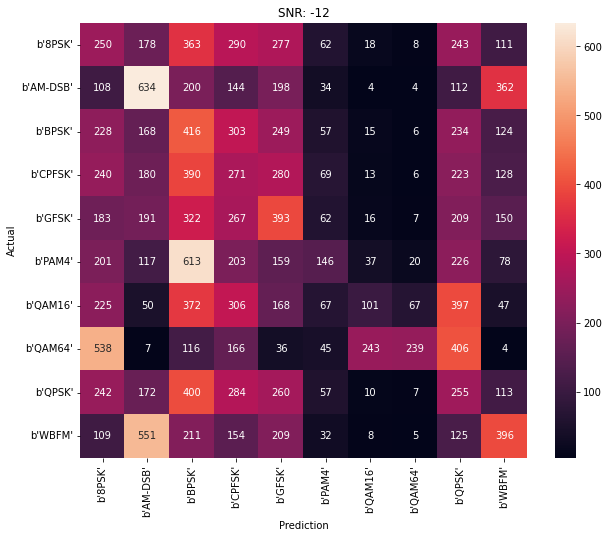

Accuracy at SNR = -10 is 0.23172222222222222%


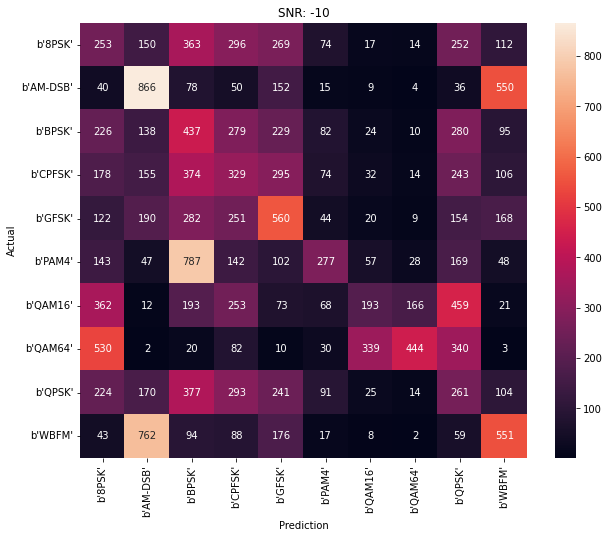

Accuracy at SNR = -8 is 0.31666666666666665%


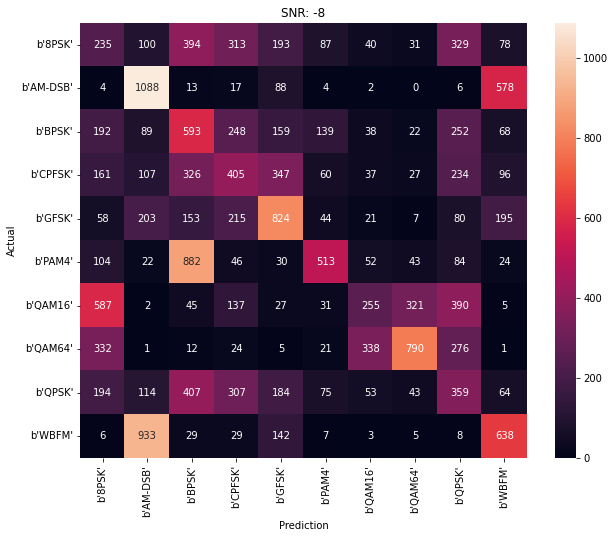

Accuracy at SNR = -6 is 0.43022222222222223%


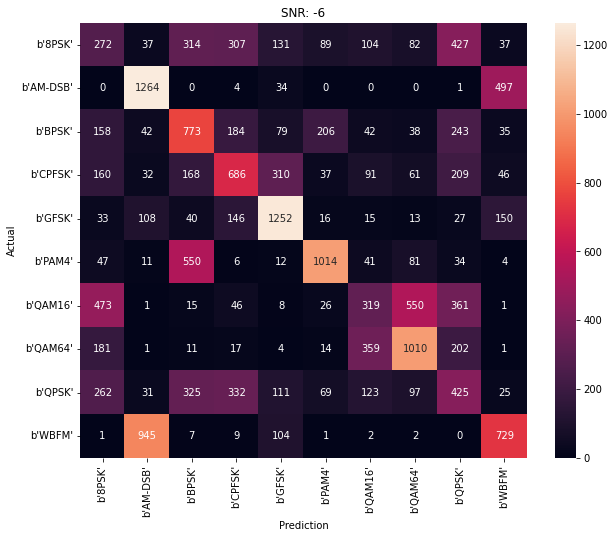

Accuracy at SNR = -4 is 0.5358333333333334%


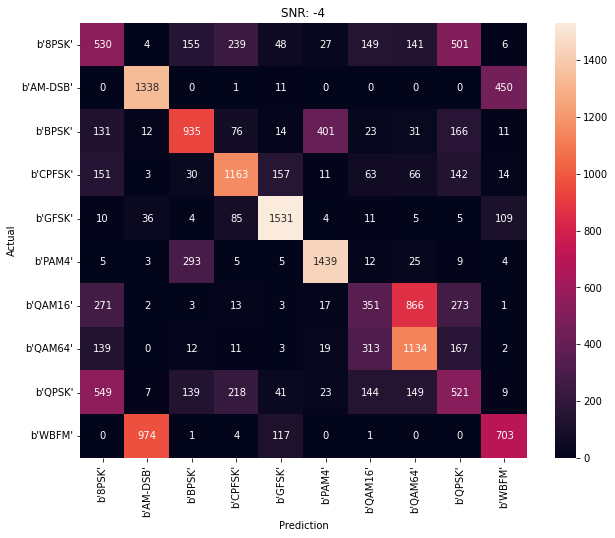

Accuracy at SNR = -2 is 0.6104444444444445%


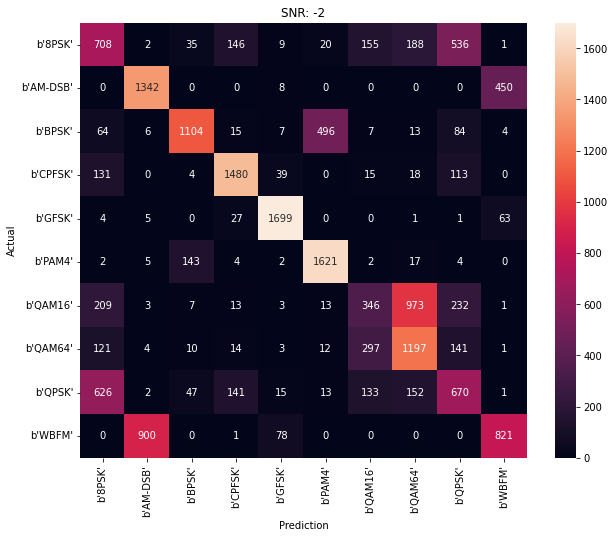

Accuracy at SNR = 0 is 0.6477777777777778%


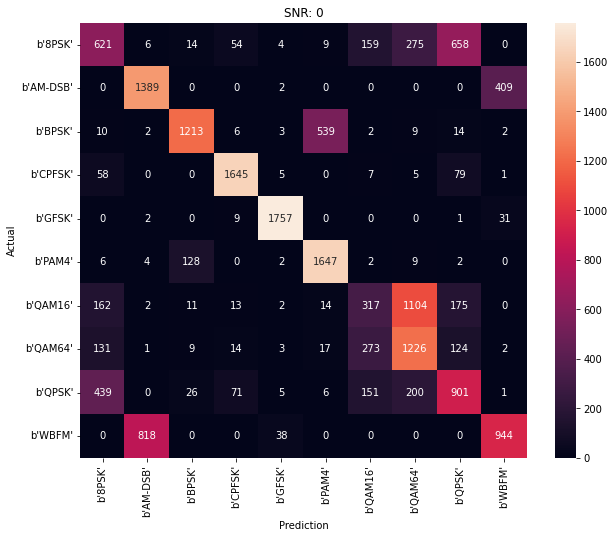

Accuracy at SNR = 2 is 0.6642777777777777%


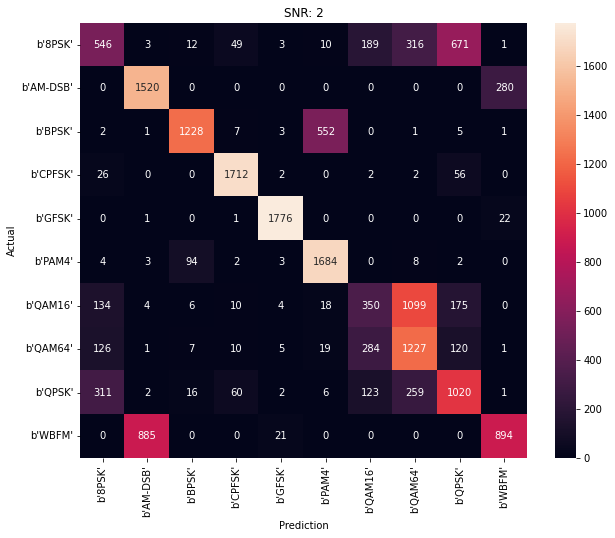

Accuracy at SNR = 4 is 0.6761111111111111%


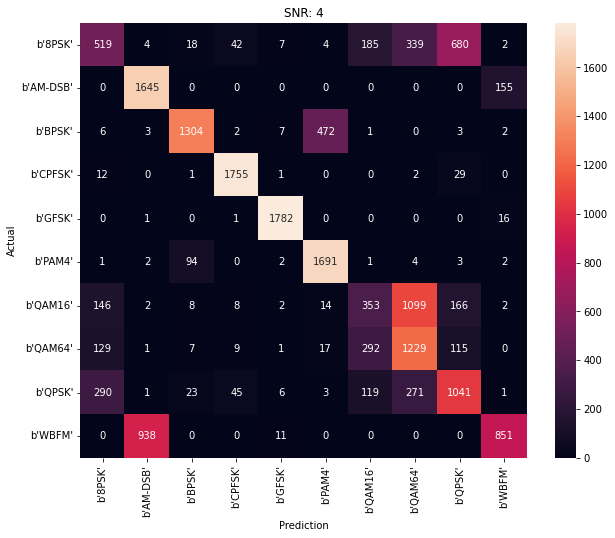

Accuracy at SNR = 6 is 0.6728888888888889%


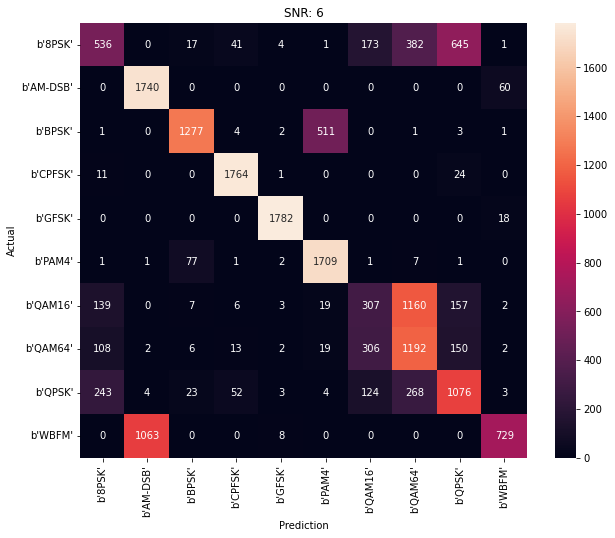

Accuracy at SNR = 8 is 0.6735%


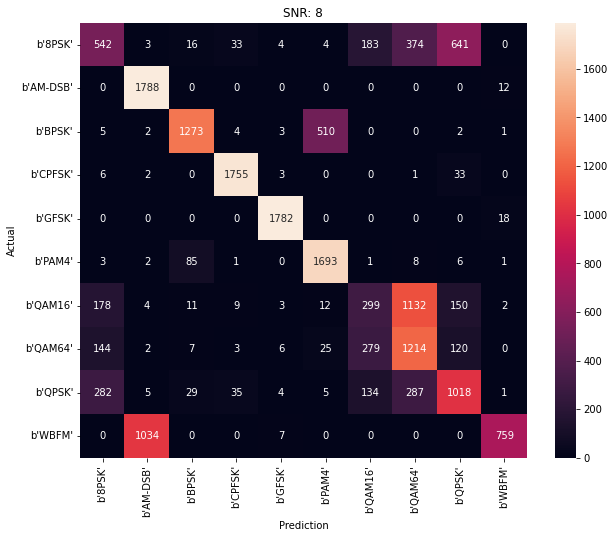

Accuracy at SNR = 10 is 0.6741666666666667%


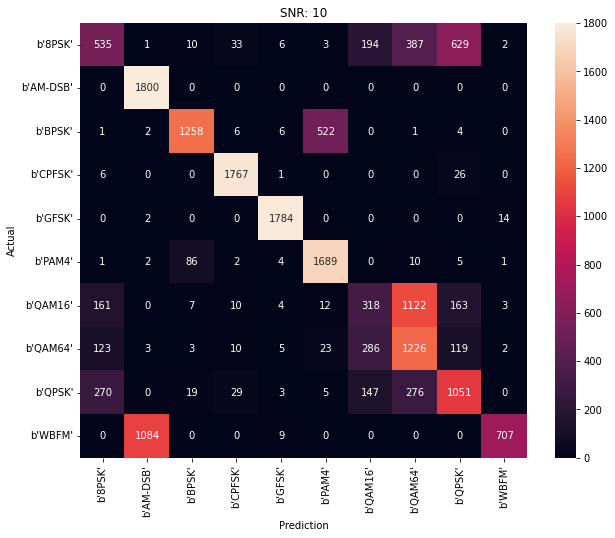

Accuracy at SNR = 12 is 0.6639444444444444%


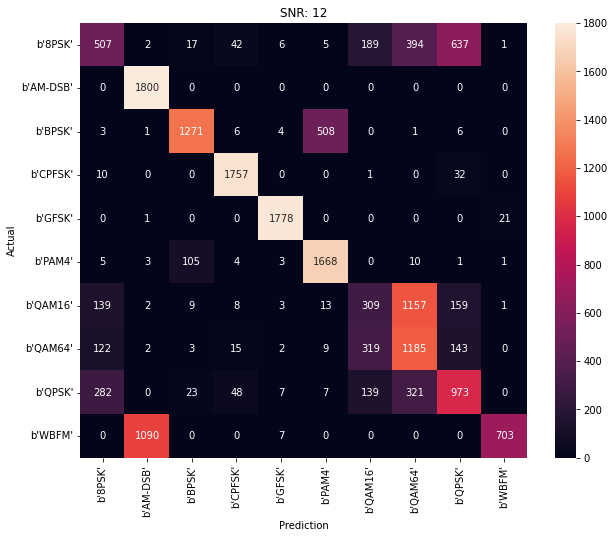

Accuracy at SNR = 14 is 0.6772222222222222%


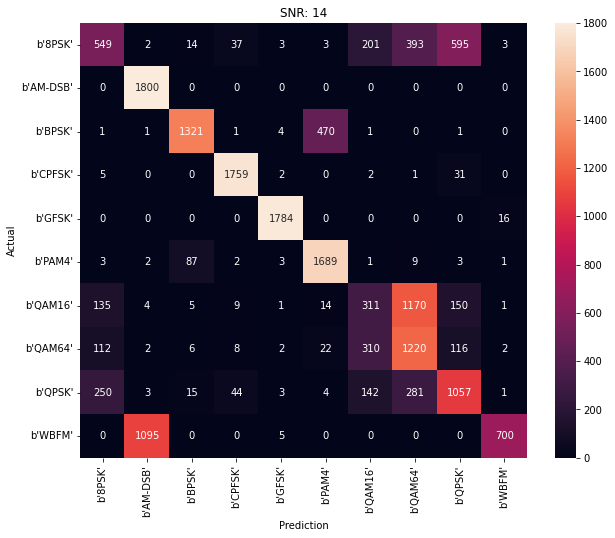

Accuracy at SNR = 16 is 0.6787777777777778%


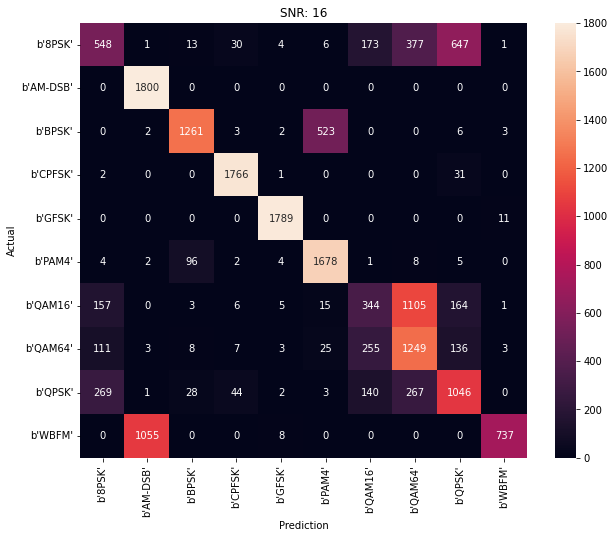

Accuracy at SNR = 18 is 0.6716111111111112%


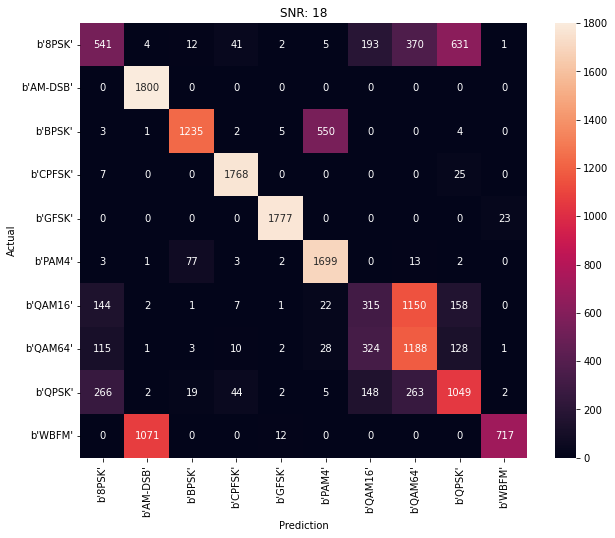

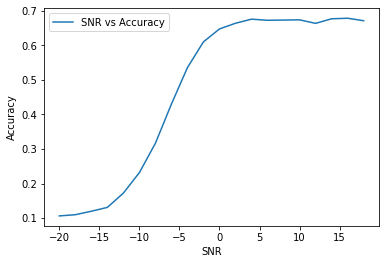

In [ ]:
plot_model_history(history, 'LSTM Model')
model_scoring(lstm_model, history, testing_data, testing_pair_labels)

# Differentiated Features Space

In [27]:
fdit_training_data = np.concatenate((normalize(np.gradient(training_data[:,0], axis = 1)), normalize(np.gradient(training_data[:,1], axis = 1))), axis=1).reshape(training_data.shape)
fdit_validation_data = np.concatenate((normalize(np.gradient(validation_data[:,0], axis = 1)), normalize(np.gradient(validation_data[:,1], axis = 1))), axis=1).reshape(validation_data.shape)
fdit_testing_data = np.concatenate((normalize(np.gradient(testing_data[:,0], axis = 1)), normalize(np.gradient(testing_data[:,1], axis = 1))), axis=1).reshape(testing_data.shape)

In [28]:
print('fdit training data shape:', fdit_training_data.shape)
print('fdit validation data shape:', fdit_validation_data.shape)
print('fdit testing data shape:', fdit_testing_data.shape)

fdit training data shape: (798000, 2, 128)
fdit validation data shape: (42000, 2, 128)
fdit testing data shape: (360000, 2, 128)


## CNN Model

In [ ]:
fdit_training_data, fdit_validation_data, fdit_testing_data = reshape_data_for_cnn(fdit_training_data, fdit_validation_data, fdit_testing_data)

In [ ]:
print('training data shape:', fdit_training_data.shape)
print('validation data shape:', fdit_validation_data.shape)
print('testing data shape:', fdit_testing_data.shape)

training data shape: (798000, 2, 128, 1)
validation data shape: (42000, 2, 128, 1)
testing data shape: (360000, 2, 128, 1)


In [ ]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [ ]:
cnn_model = Sequential()
cnn_model.add(Conv2D(256, 3, activation='relu', padding='same'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Conv2D(64, 3, strides=2, activation='relu', padding='same'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Flatten())
cnn_model.add(Dense(128, activation='relu' ))
cnn_model.add(Dense(10,  activation='softmax'))
cnn_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))

In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/cnn_fdit_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = cnn_model.fit(fdit_training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(fdit_validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

Epoch 1/200
1559/1559 [==============================] - ETA: 0s - loss: 1.8433 - accuracy: 0.2877
Epoch 1: val_loss improved from inf to 1.64716, saving model to saved_models/cnn_fdit_classification.hdf5
1559/1559 [==============================] - 64s 41ms/step - loss: 1.8433 - accuracy: 0.2877 - val_loss: 1.6472 - val_accuracy: 0.3578
Epoch 2/200
1559/1559 [==============================] - ETA: 0s - loss: 1.6533 - accuracy: 0.3564
Epoch 2: val_loss improved from 1.64716 to 1.58753, saving model to saved_models/cnn_fdit_classification.hdf5
1559/1559 [==============================] - 64s 41ms/step - loss: 1.6533 - accuracy: 0.3564 - val_loss: 1.5875 - val_accuracy: 0.3837
Epoch 3/200
1559/1559 [==============================] - ETA: 0s - loss: 1.6153 - accuracy: 0.3718
Epoch 3: val_loss improved from 1.58753 to 1.56957, saving model to saved_models/cnn_fdit_classification.hdf5
1559/1559 [==============================] - 64s 41ms/step - loss: 1.6153 - accuracy: 0.3718 - val_loss: 1.

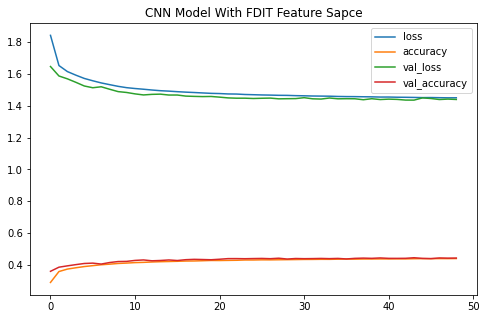

Accuracy at SNR = -20 is 0.10072222222222223%


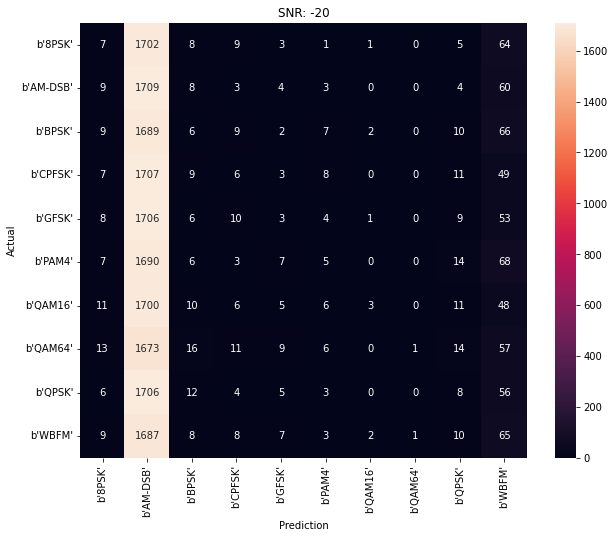

Accuracy at SNR = -18 is 0.09983333333333333%


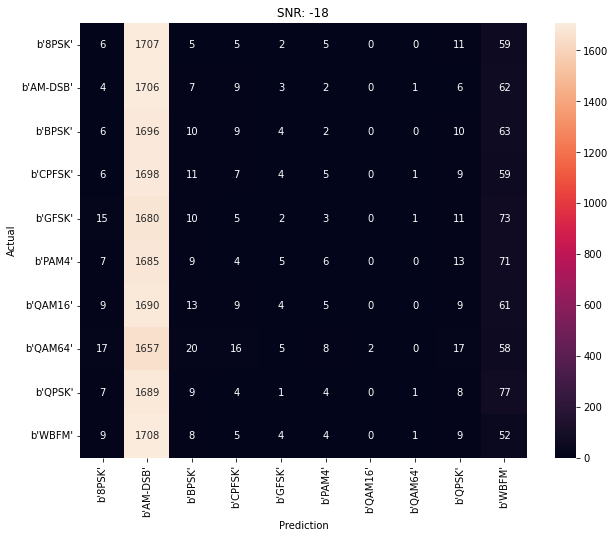

Accuracy at SNR = -16 is 0.10033333333333333%


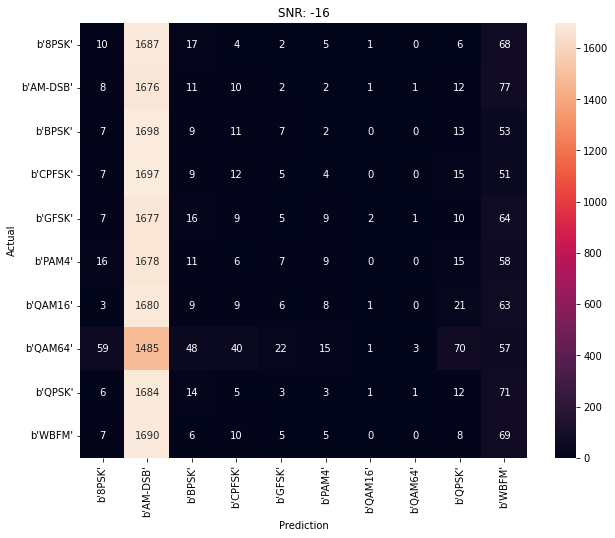

Accuracy at SNR = -14 is 0.10122222222222223%


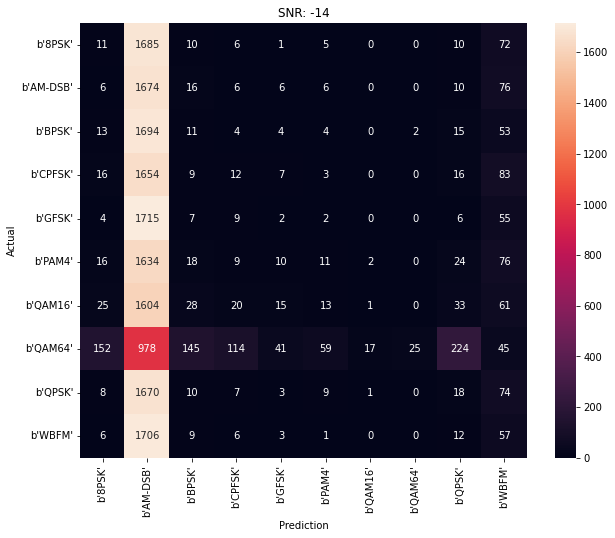

Accuracy at SNR = -12 is 0.11138888888888888%


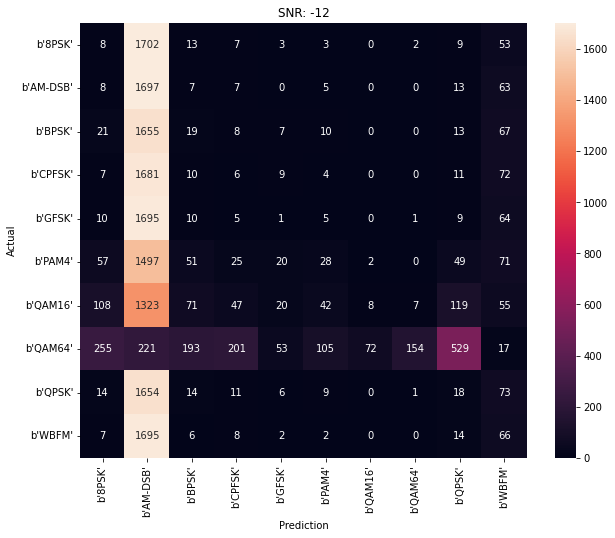

Accuracy at SNR = -10 is 0.1288888888888889%


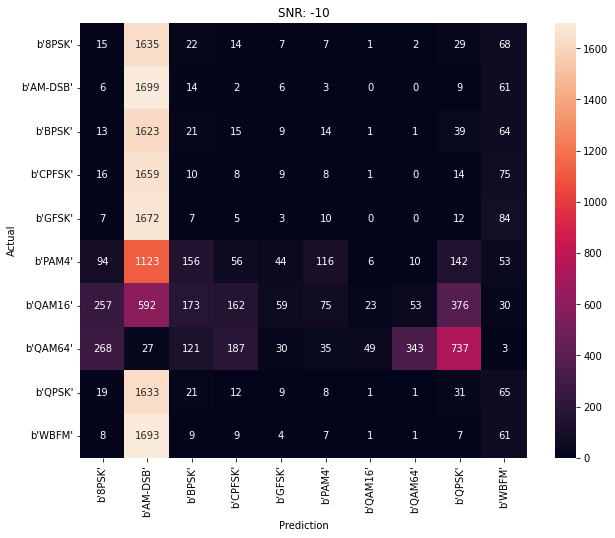

Accuracy at SNR = -8 is 0.15516666666666667%


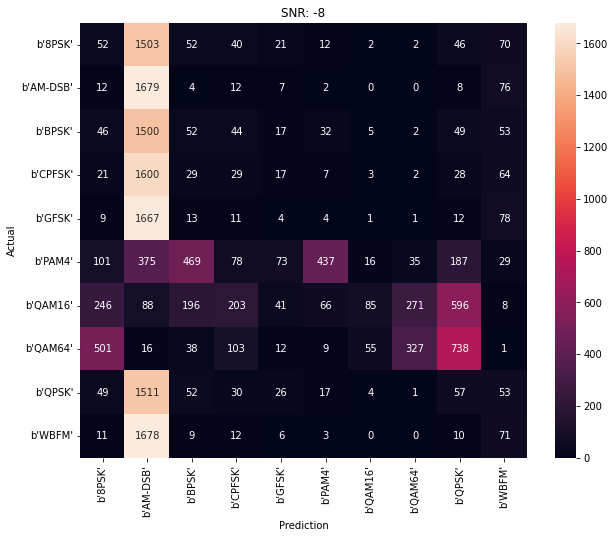

Accuracy at SNR = -6 is 0.20605555555555555%


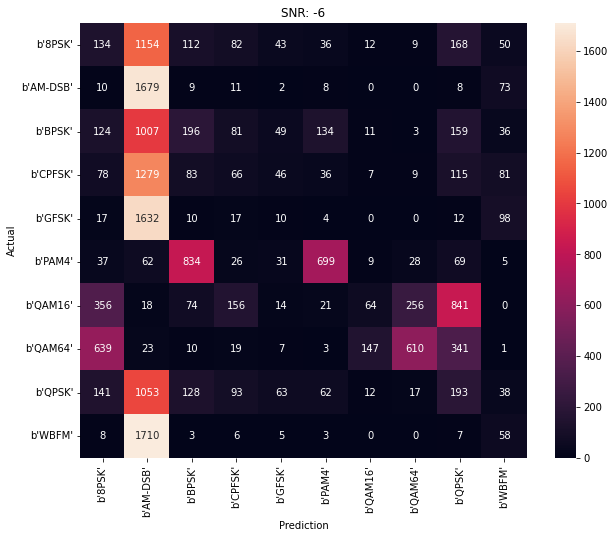

Accuracy at SNR = -4 is 0.29488888888888887%


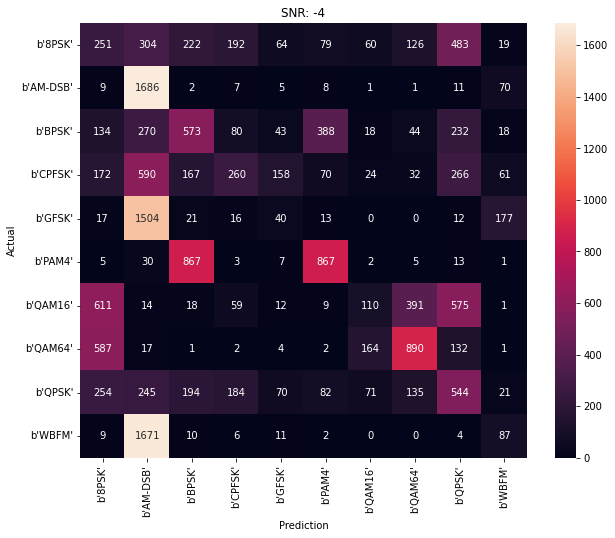

Accuracy at SNR = -2 is 0.4176666666666667%


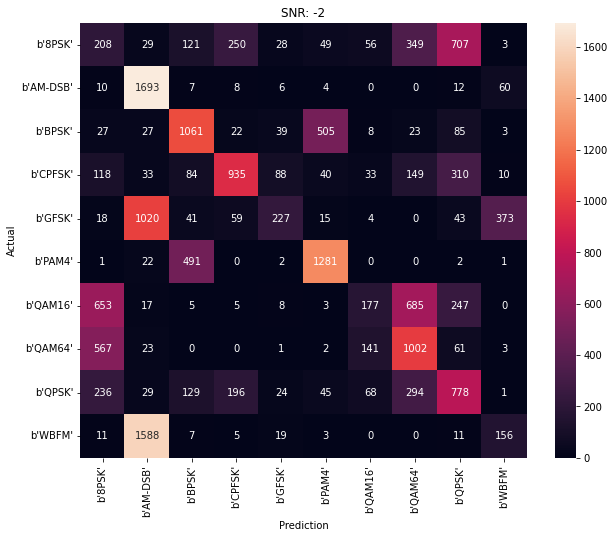

Accuracy at SNR = 0 is 0.5326666666666666%


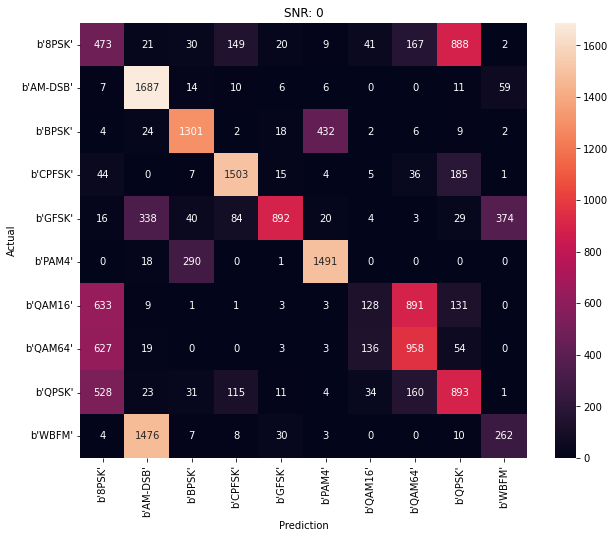

Accuracy at SNR = 2 is 0.617%


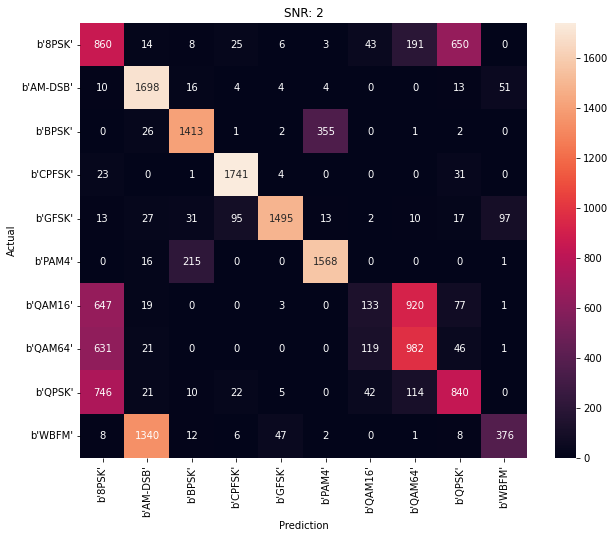

Accuracy at SNR = 4 is 0.6694444444444444%


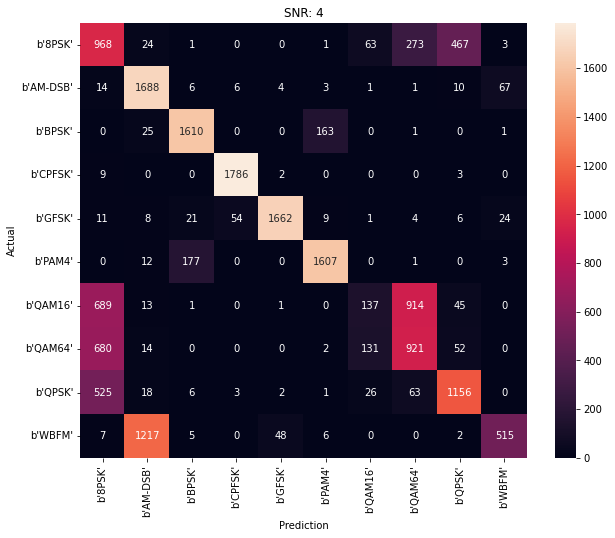

Accuracy at SNR = 6 is 0.7140555555555556%


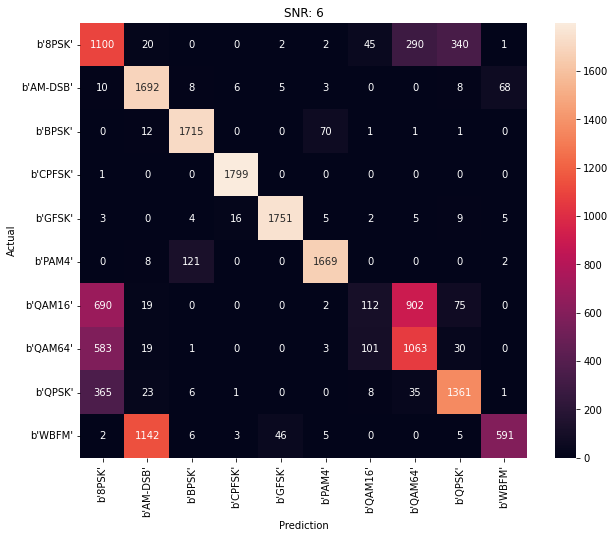

Accuracy at SNR = 8 is 0.7571111111111111%


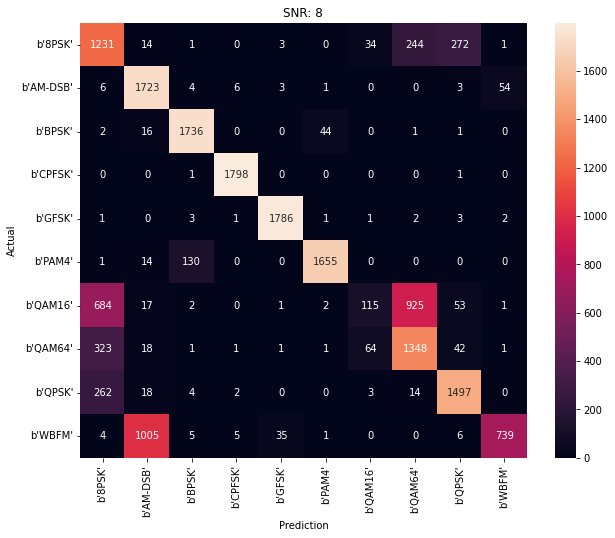

Accuracy at SNR = 10 is 0.7729444444444444%


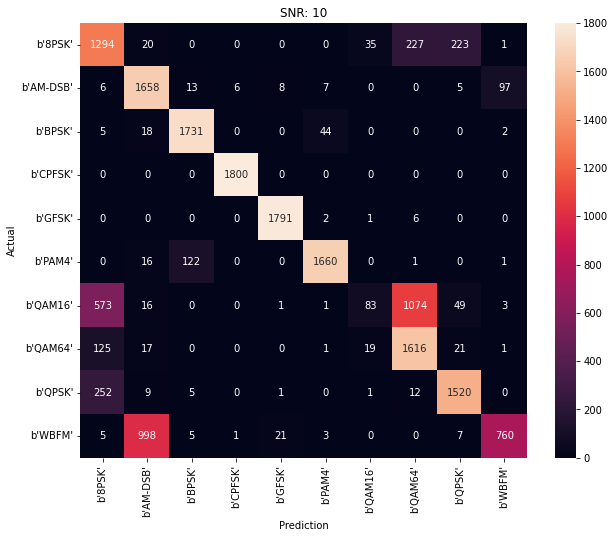

Accuracy at SNR = 12 is 0.7782777777777777%


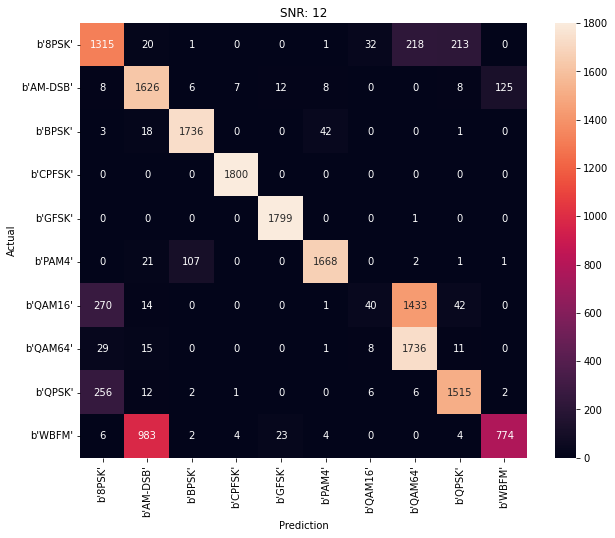

Accuracy at SNR = 14 is 0.7765%


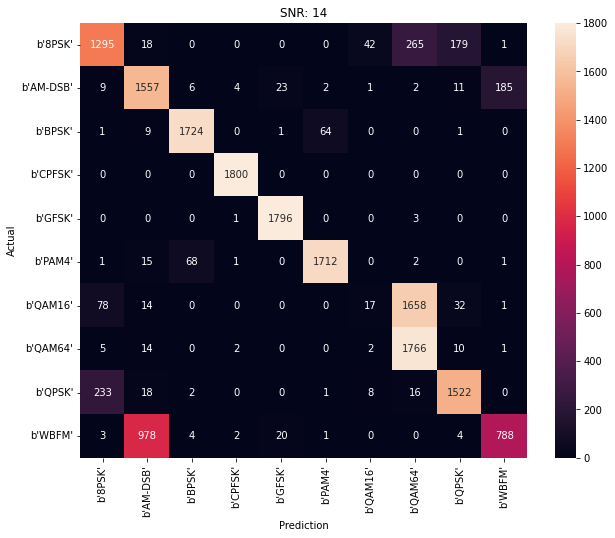

Accuracy at SNR = 16 is 0.7634444444444445%


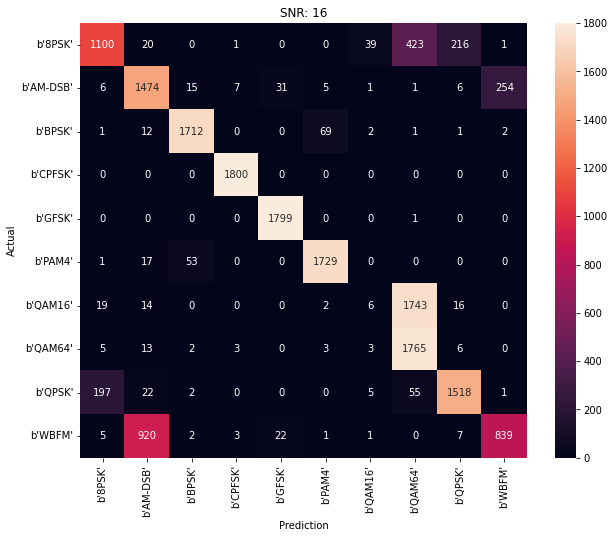

Accuracy at SNR = 18 is 0.7347777777777778%


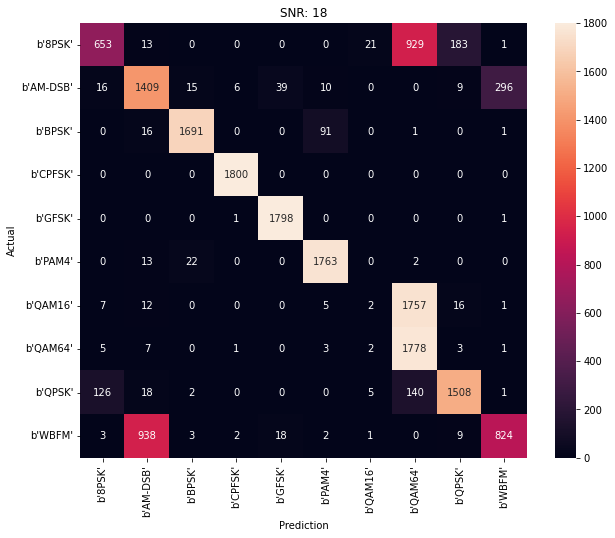

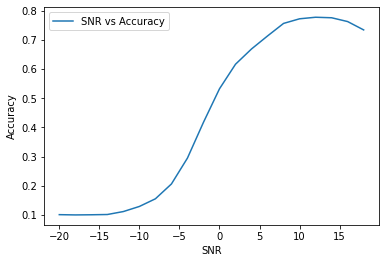

In [ ]:
plot_model_history(history, 'CNN Model With FDIT Feature Sapce')
model_scoring(cnn_model, history, fdit_testing_data, testing_pair_labels)

## Reshaping data for RNN and LSTM models

In [ ]:
fdit_training_data, fdit_validation_data, fdit_testing_data = reshape_data_for_rnn_lstm(fdit_training_data, fdit_validation_data, fdit_testing_data)

In [ ]:
print('training data shape:', fdit_training_data.shape)
print('validation data shape:', fdit_validation_data.shape)
print('testing data shape:', fdit_testing_data.shape)

training data shape: (798000, 2, 128)
validation data shape: (42000, 2, 128)
testing data shape: (360000, 2, 128)


## RNN Model

In [ ]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [ ]:
rnn_model = Sequential()
rnn_model.add(SimpleRNN(128, activation='relu'))
#rnn_model.add(Dropout(0.5))
rnn_model.add(Dense(10, activation='softmax'))
rnn_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))


In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/rnn_fdit_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = rnn_model.fit(fdit_training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(fdit_validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

Epoch 1/200
1559/1559 [==============================] - ETA: 0s - loss: 1.9940 - accuracy: 0.2511
Epoch 1: val_loss improved from inf to 1.89675, saving model to saved_models/rnn_fdit_classification.hdf5
1559/1559 [==============================] - 9s 5ms/step - loss: 1.9940 - accuracy: 0.2511 - val_loss: 1.8967 - val_accuracy: 0.2921
Epoch 2/200
1558/1559 [============================>.] - ETA: 0s - loss: 1.8419 - accuracy: 0.3094
Epoch 2: val_loss improved from 1.89675 to 1.79719, saving model to saved_models/rnn_fdit_classification.hdf5
1559/1559 [==============================] - 7s 5ms/step - loss: 1.8418 - accuracy: 0.3094 - val_loss: 1.7972 - val_accuracy: 0.3223
Epoch 3/200
1558/1559 [============================>.] - ETA: 0s - loss: 1.7697 - accuracy: 0.3273
Epoch 3: val_loss improved from 1.79719 to 1.75286, saving model to saved_models/rnn_fdit_classification.hdf5
1559/1559 [==============================] - 7s 5ms/step - loss: 1.7697 - accuracy: 0.3273 - val_loss: 1.7529 -

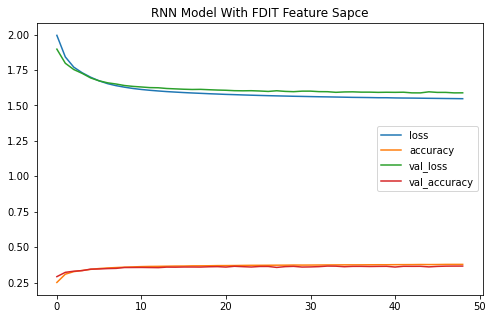

Accuracy at SNR = -20 is 0.09988888888888889%


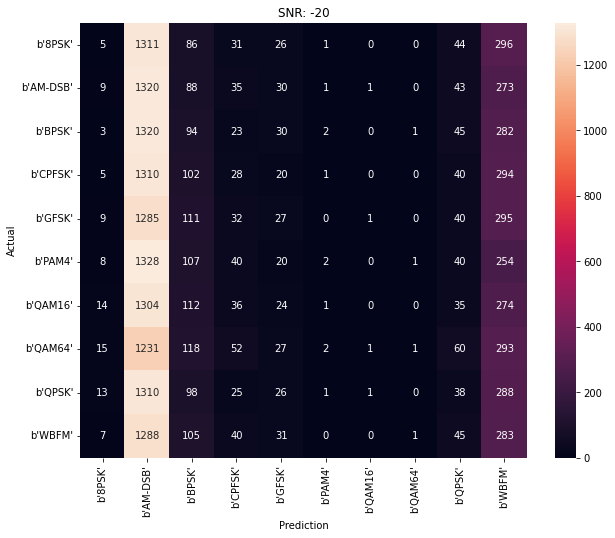

Accuracy at SNR = -18 is 0.10205555555555555%


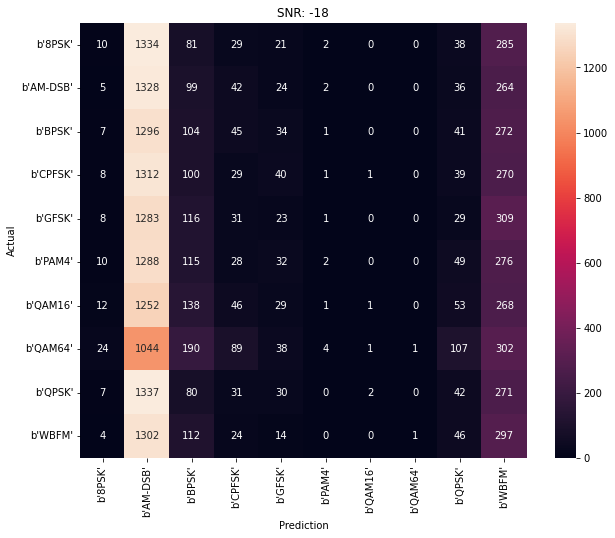

Accuracy at SNR = -16 is 0.10016666666666667%


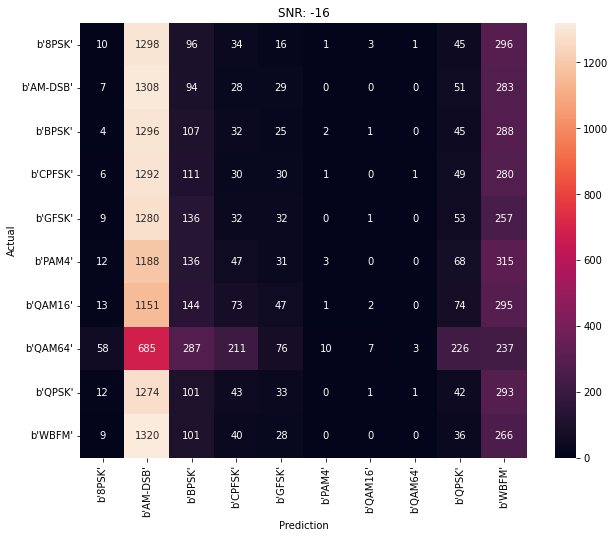

Accuracy at SNR = -14 is 0.10561111111111111%


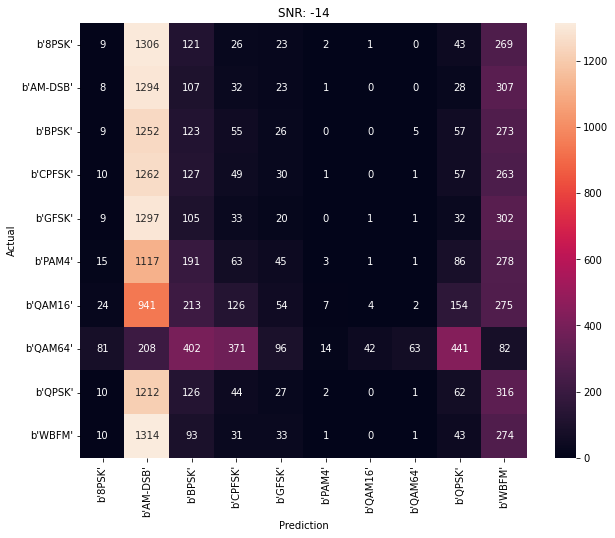

Accuracy at SNR = -12 is 0.12377777777777778%


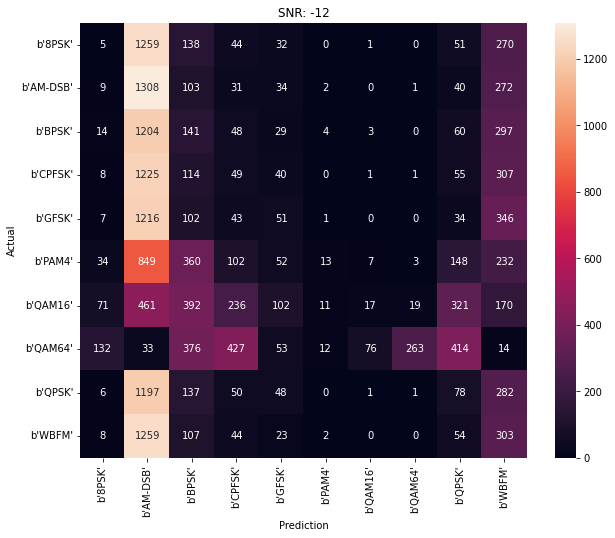

Accuracy at SNR = -10 is 0.15388888888888888%


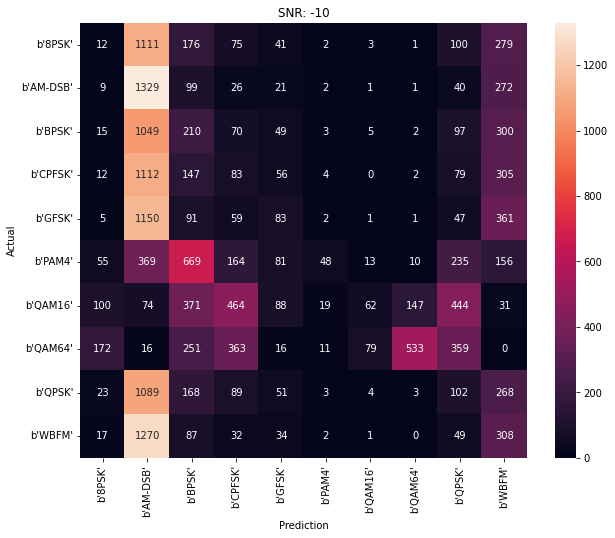

Accuracy at SNR = -8 is 0.19816666666666666%


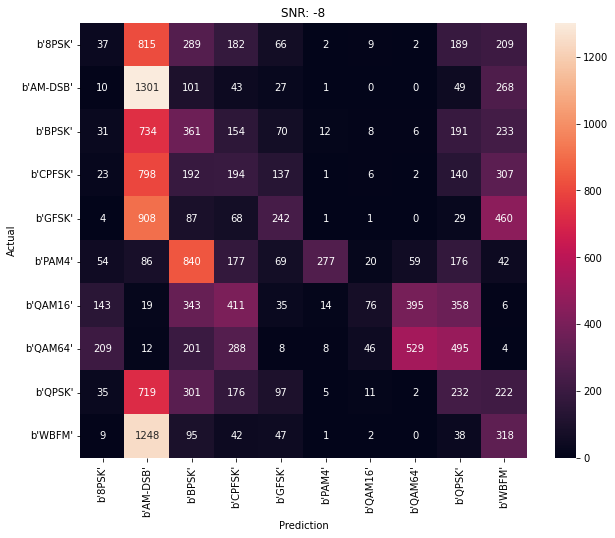

Accuracy at SNR = -6 is 0.28%


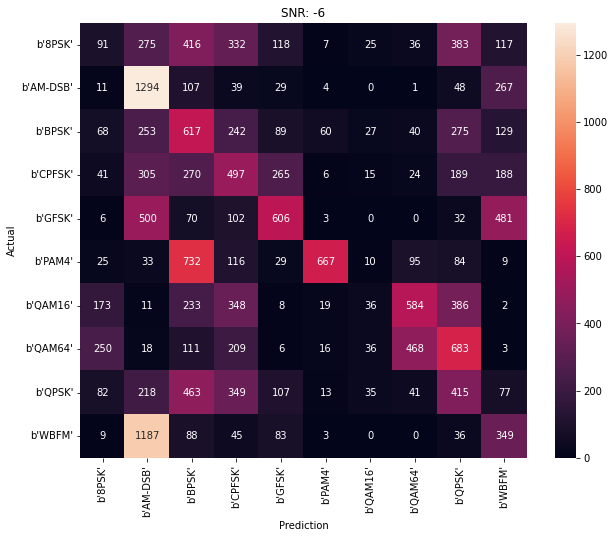

Accuracy at SNR = -4 is 0.3631111111111111%


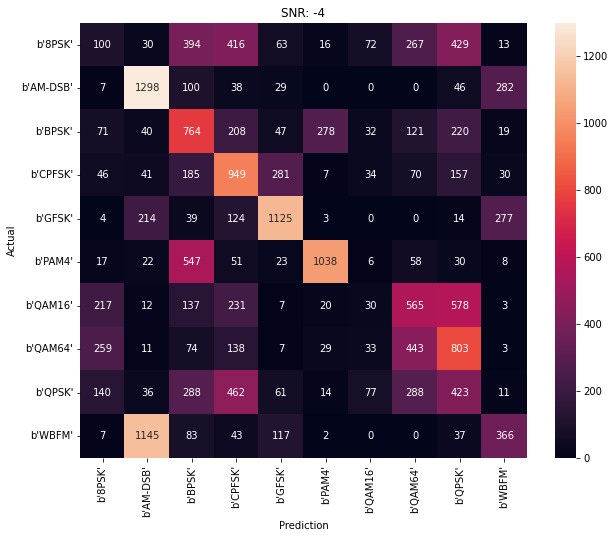

Accuracy at SNR = -2 is 0.4161111111111111%


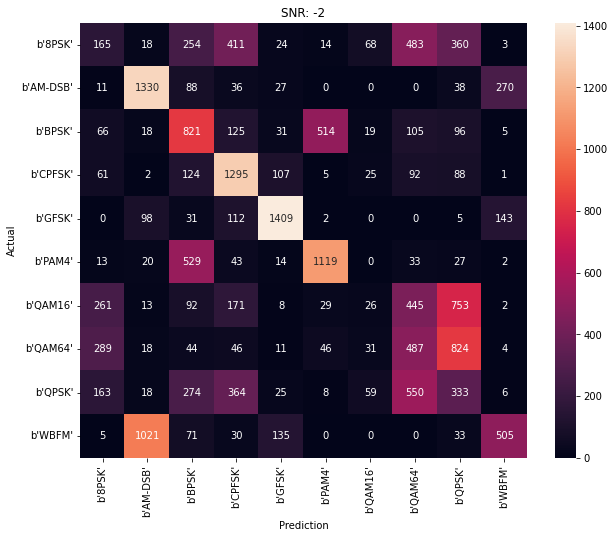

Accuracy at SNR = 0 is 0.4543888888888889%


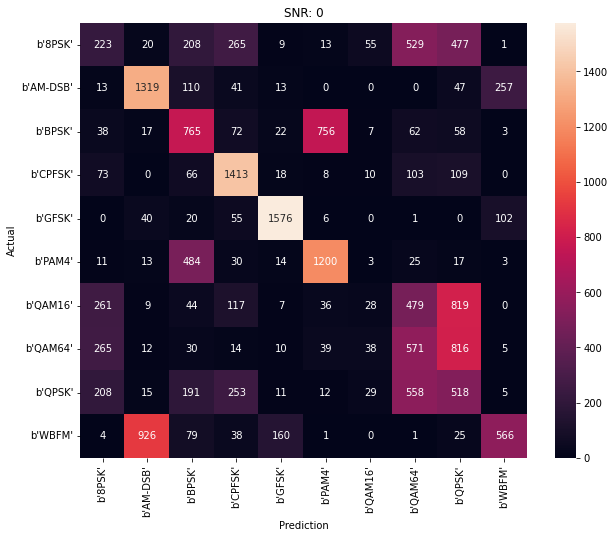

Accuracy at SNR = 2 is 0.48788888888888887%


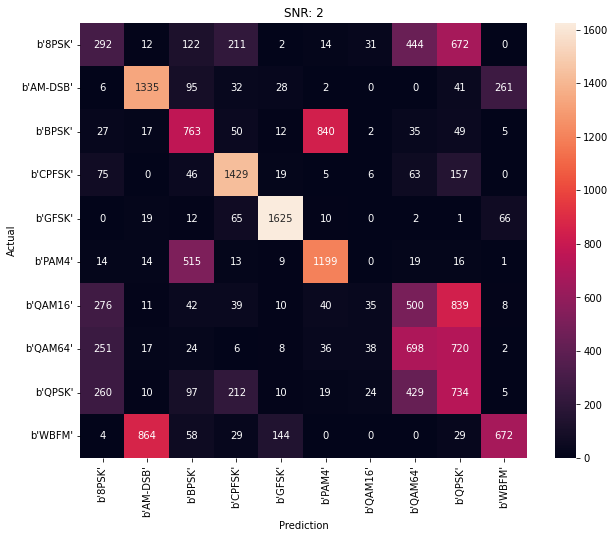

Accuracy at SNR = 4 is 0.5220555555555556%


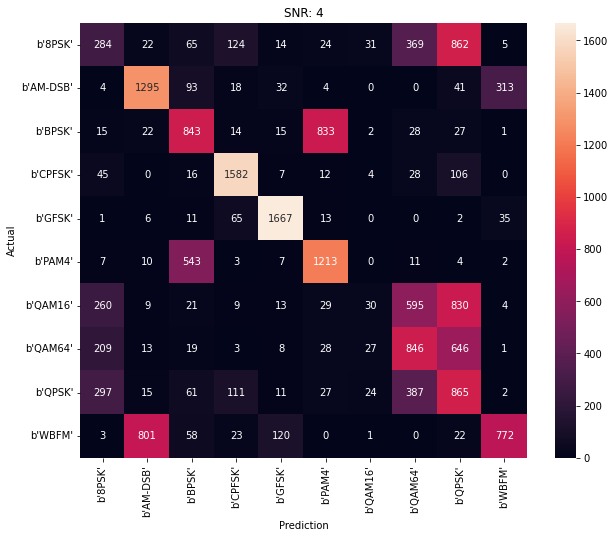

Accuracy at SNR = 6 is 0.5439444444444445%


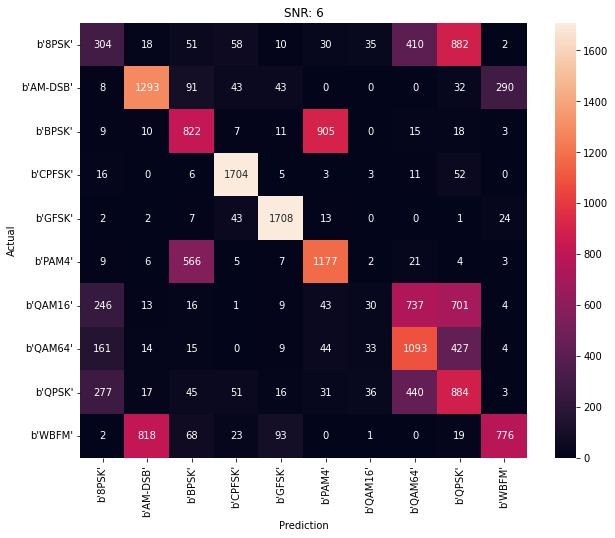

Accuracy at SNR = 8 is 0.5782222222222222%


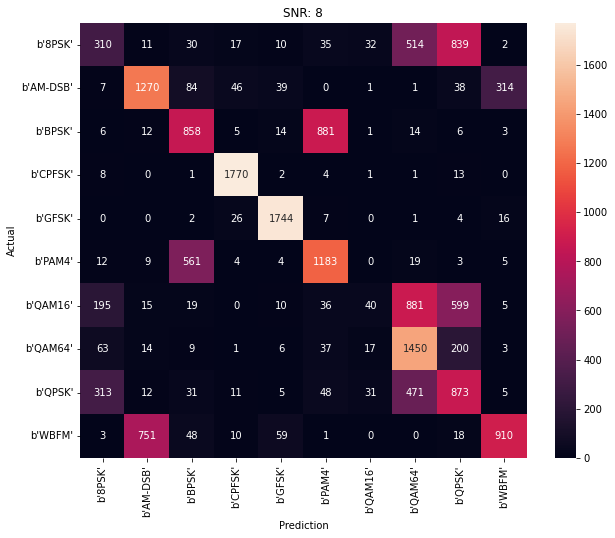

Accuracy at SNR = 10 is 0.5770555555555555%


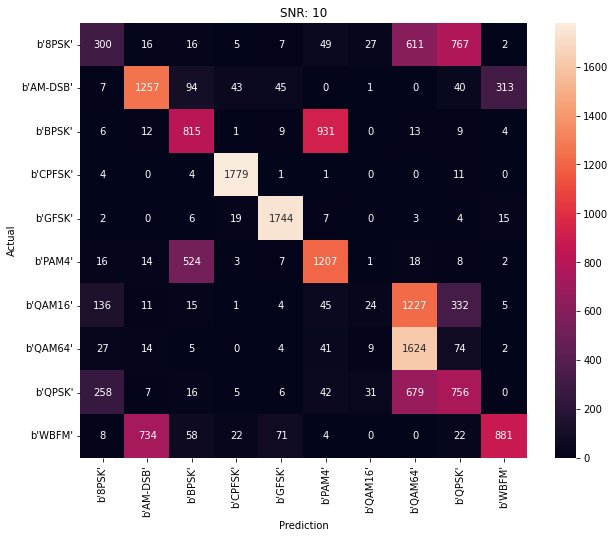

Accuracy at SNR = 12 is 0.5747777777777778%


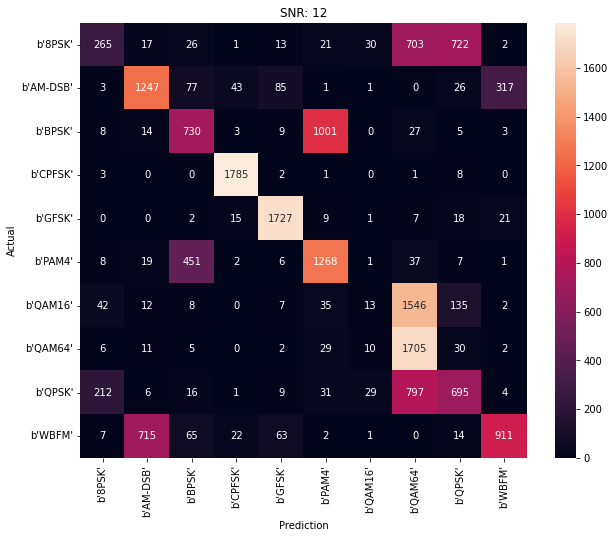

Accuracy at SNR = 14 is 0.5630555555555555%


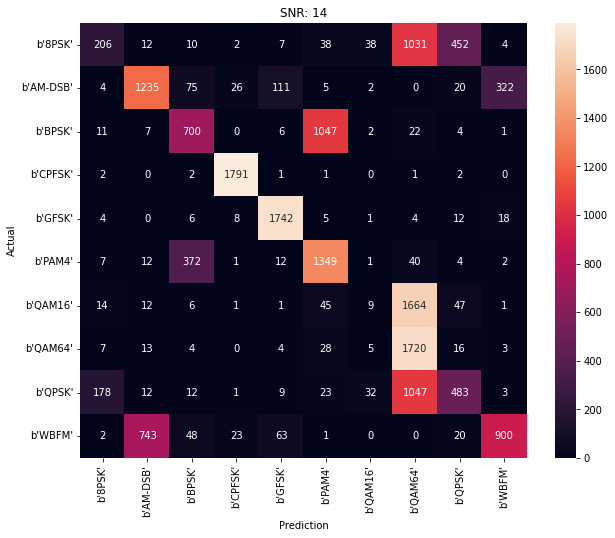

Accuracy at SNR = 16 is 0.5385555555555556%


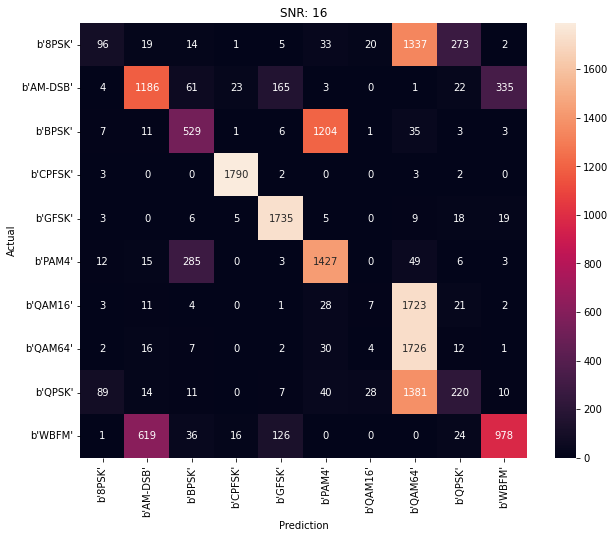

Accuracy at SNR = 18 is 0.5183888888888889%


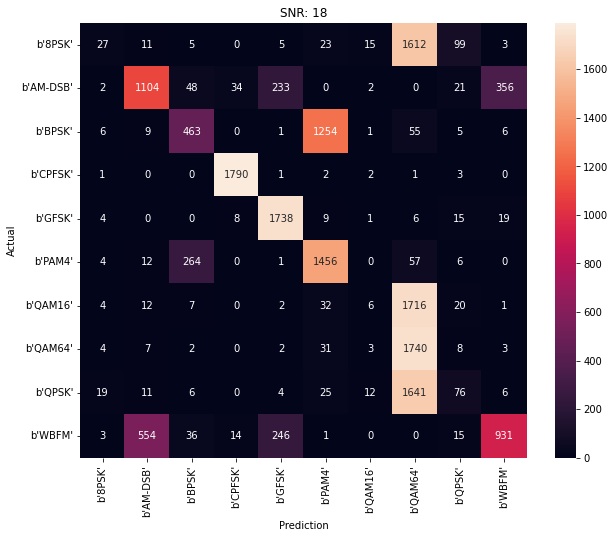

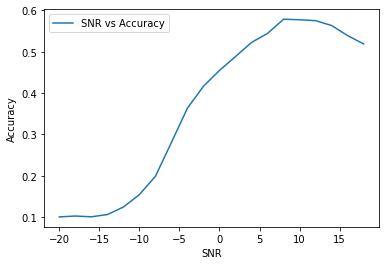

In [ ]:
plot_model_history(history, 'RNN Model With FDIT Feature Sapce')
model_scoring(rnn_model, history, fdit_testing_data, testing_pair_labels)

## LSTM Model

In [ ]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [ ]:
lstm_model = Sequential()
lstm_model.add(LSTM(256))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(10, activation='softmax'))
lstm_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))

In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/lstm_fdit_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = lstm_model.fit(fdit_training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(fdit_validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

Epoch 1/200
1550/1559 [============================>.] - ETA: 0s - loss: 2.0299 - accuracy: 0.2357
Epoch 1: val_loss improved from inf to 1.91719, saving model to saved_models/lstm_fdit_classification.hdf5
1559/1559 [==============================] - 9s 5ms/step - loss: 2.0293 - accuracy: 0.2359 - val_loss: 1.9172 - val_accuracy: 0.2834
Epoch 2/200
1550/1559 [============================>.] - ETA: 0s - loss: 1.8876 - accuracy: 0.2889
Epoch 2: val_loss improved from 1.91719 to 1.83435, saving model to saved_models/lstm_fdit_classification.hdf5
1559/1559 [==============================] - 7s 4ms/step - loss: 1.8873 - accuracy: 0.2890 - val_loss: 1.8344 - val_accuracy: 0.3052
Epoch 3/200
1548/1559 [============================>.] - ETA: 0s - loss: 1.8091 - accuracy: 0.3089
Epoch 3: val_loss improved from 1.83435 to 1.75779, saving model to saved_models/lstm_fdit_classification.hdf5
1559/1559 [==============================] - 7s 4ms/step - loss: 1.8089 - accuracy: 0.3089 - val_loss: 1.757

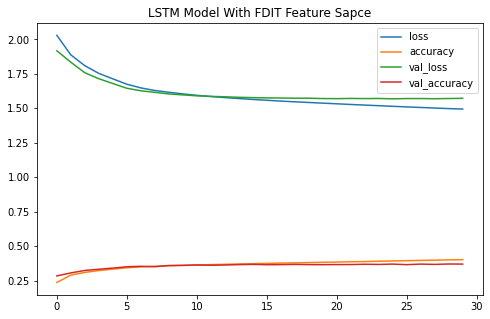

Accuracy at SNR = -20 is 0.09788888888888889%


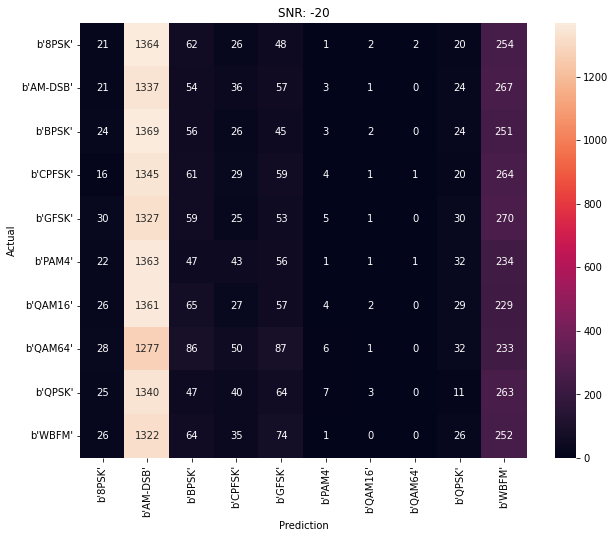

Accuracy at SNR = -18 is 0.10066666666666667%


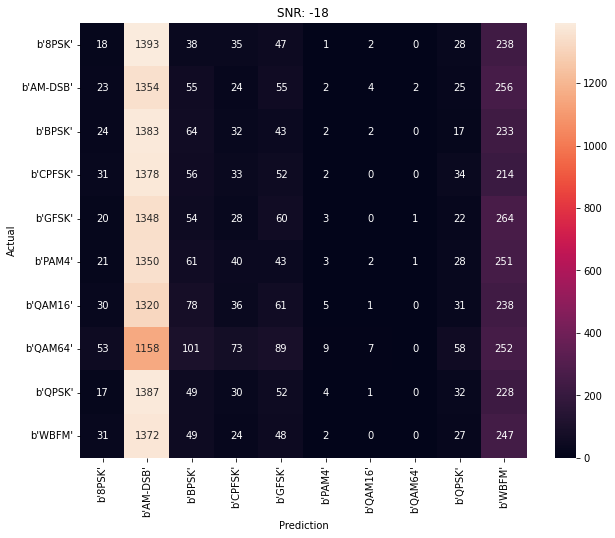

Accuracy at SNR = -16 is 0.10005555555555555%


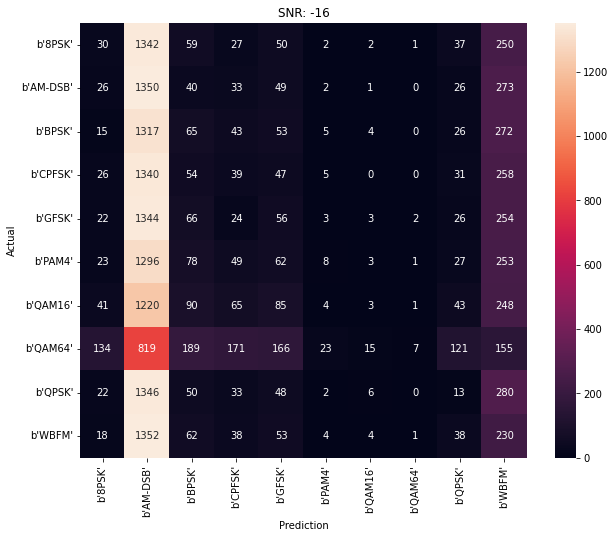

Accuracy at SNR = -14 is 0.10477777777777778%


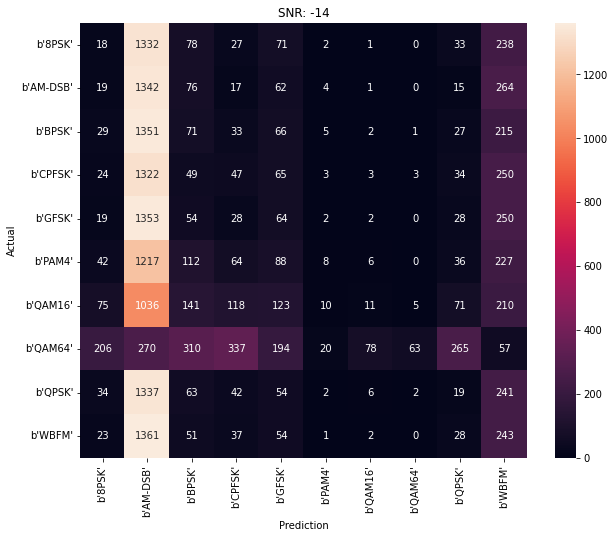

Accuracy at SNR = -12 is 0.12027777777777778%


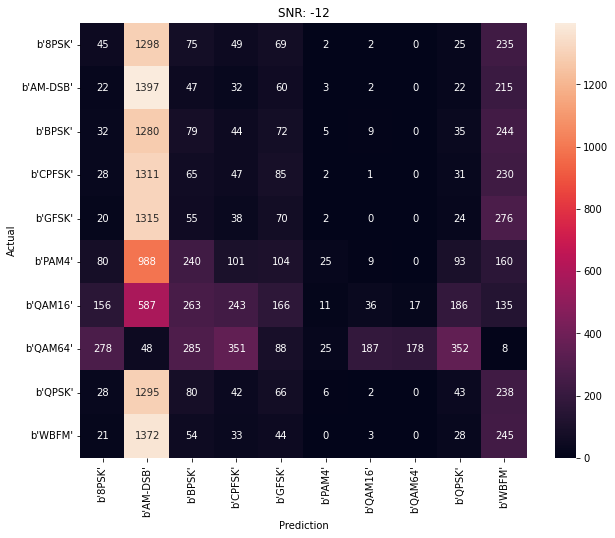

Accuracy at SNR = -10 is 0.13844444444444445%


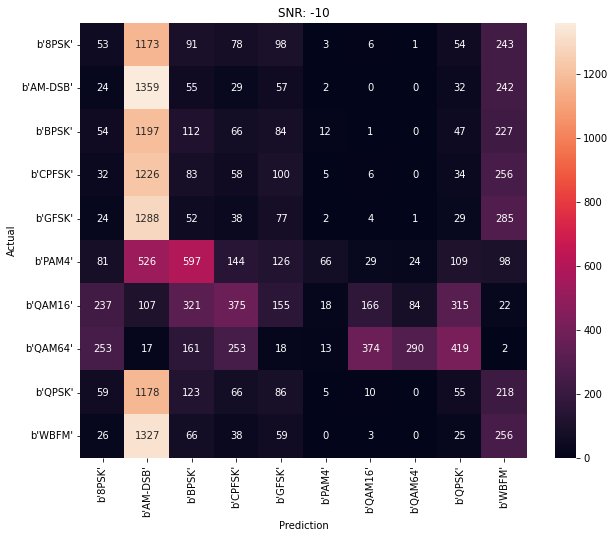

Accuracy at SNR = -8 is 0.17805555555555555%


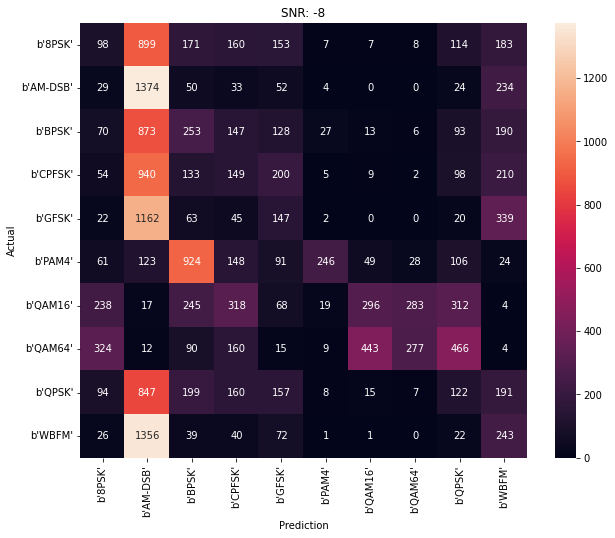

Accuracy at SNR = -6 is 0.26666666666666666%


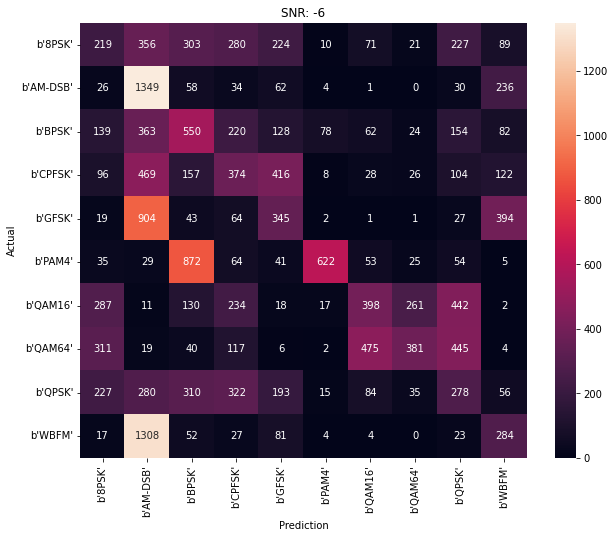

Accuracy at SNR = -4 is 0.376%


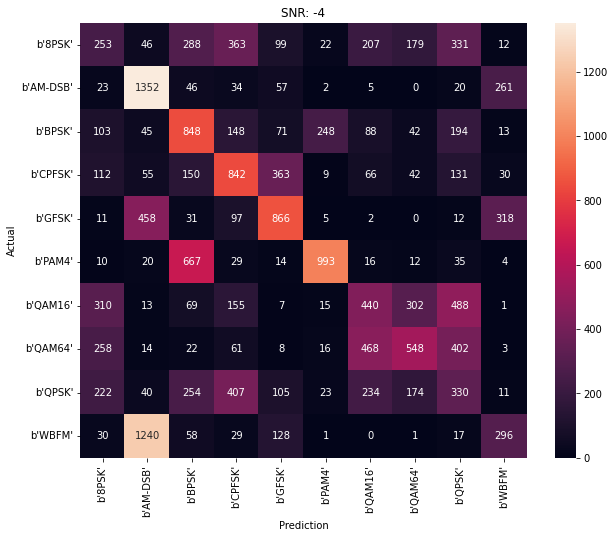

Accuracy at SNR = -2 is 0.4493888888888889%


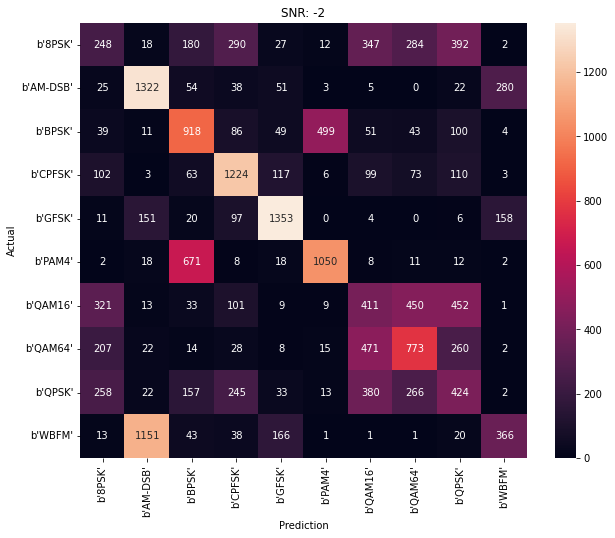

Accuracy at SNR = 0 is 0.5103333333333333%


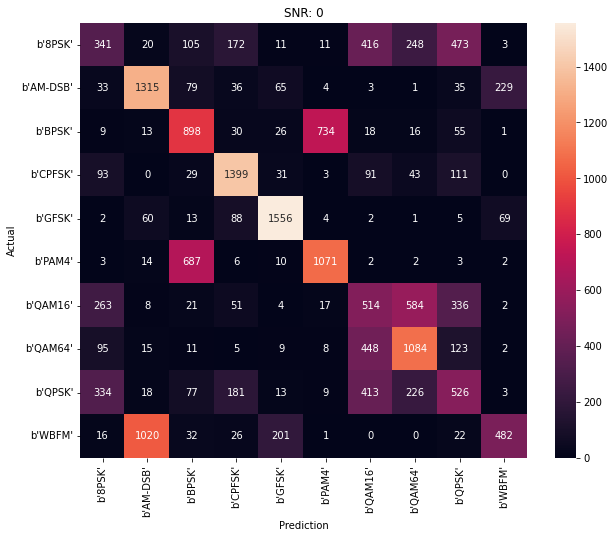

Accuracy at SNR = 2 is 0.5387222222222222%


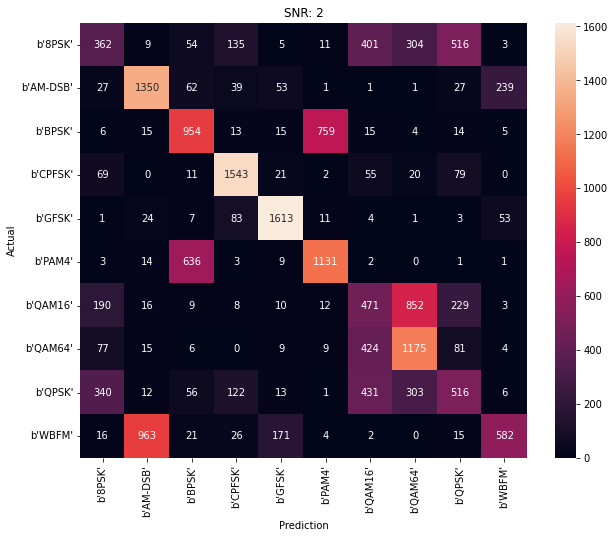

Accuracy at SNR = 4 is 0.5661111111111111%


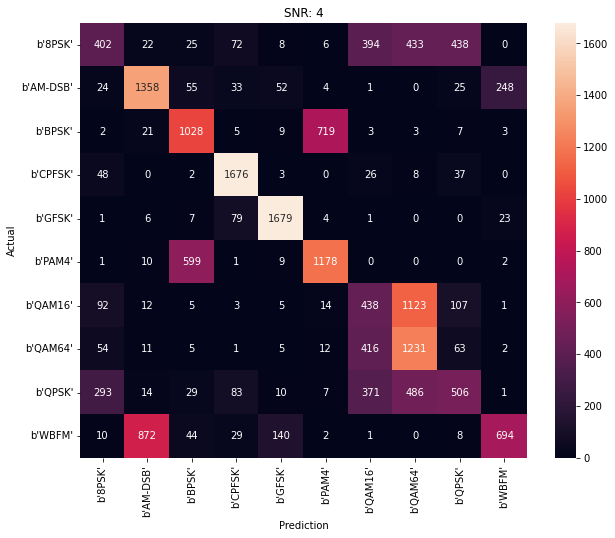

Accuracy at SNR = 6 is 0.5572222222222222%


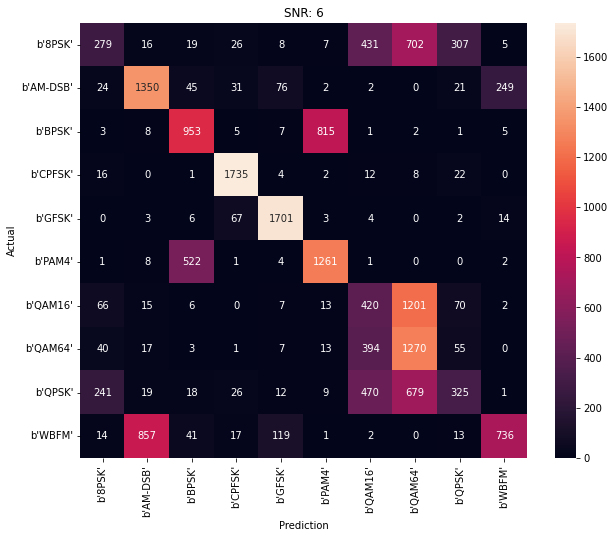

Accuracy at SNR = 8 is 0.5576111111111111%


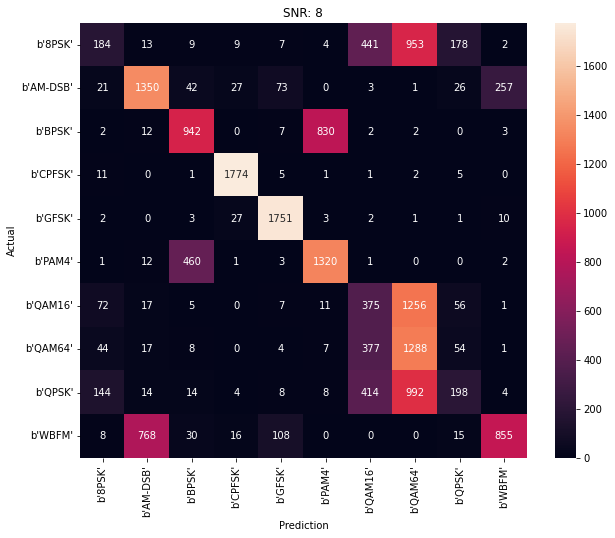

Accuracy at SNR = 10 is 0.5384444444444444%


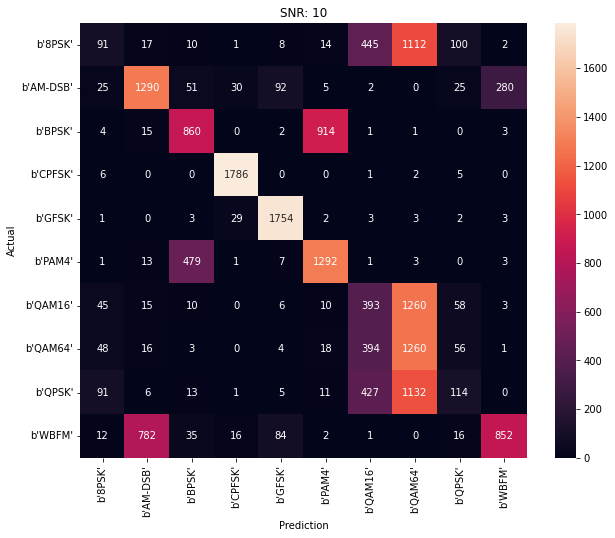

Accuracy at SNR = 12 is 0.5319444444444444%


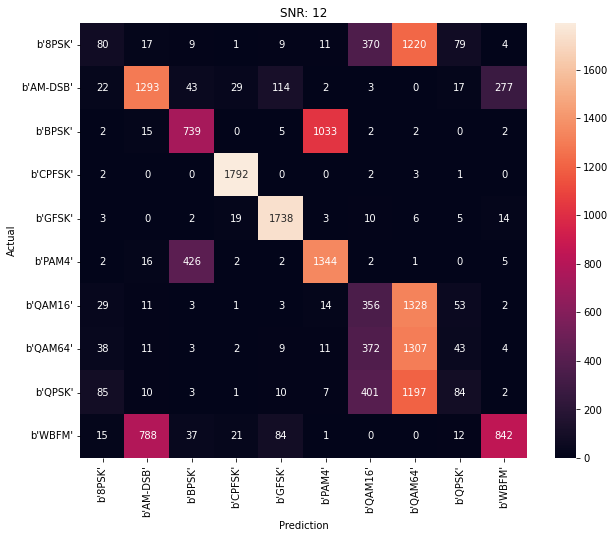

Accuracy at SNR = 14 is 0.5343888888888889%


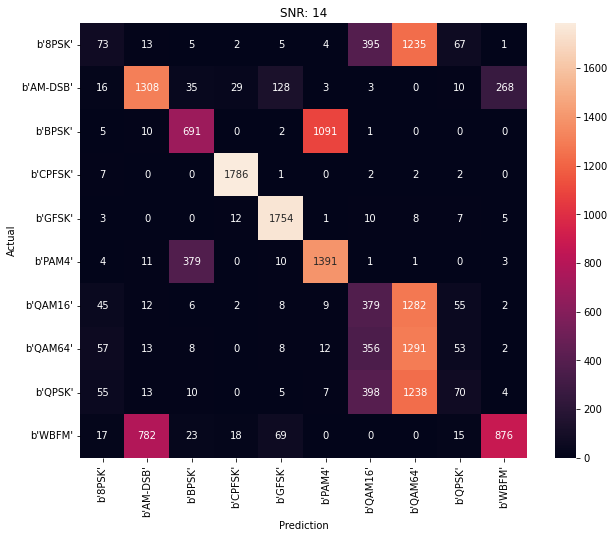

Accuracy at SNR = 16 is 0.5335%


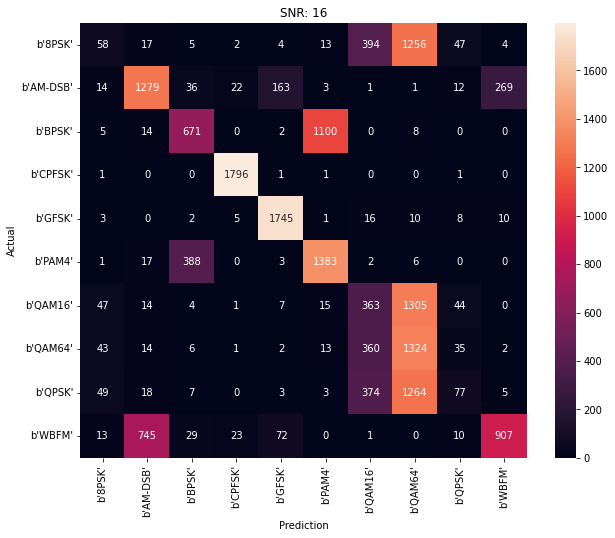

Accuracy at SNR = 18 is 0.528%


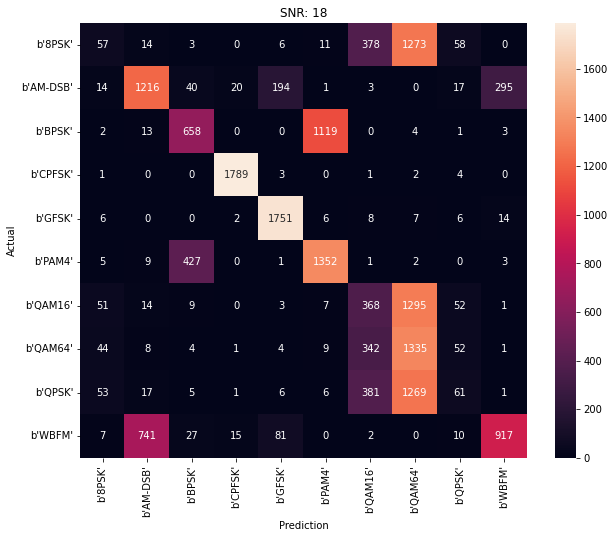

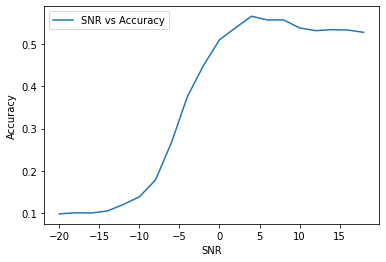

In [ ]:
plot_model_history(history, 'LSTM Model With FDIT Feature Sapce')
model_scoring(lstm_model, history, fdit_testing_data, testing_pair_labels)

# Integrated Features Space

In [29]:
fiit_training_data = integrate.cumtrapz(training_data, initial=0)
fiit_validation_data = integrate.cumtrapz(validation_data, initial=0)
fiit_testing_data = integrate.cumtrapz(testing_data, initial=0)

In [30]:
print('fiit training data shape:', fiit_training_data.shape)
print('fiit validation data shape:', fiit_validation_data.shape)
print('fiit testing data shape:', fiit_testing_data.shape)

fiit training data shape: (798000, 2, 128)
fiit validation data shape: (42000, 2, 128)
fiit testing data shape: (360000, 2, 128)


## CNN Model

In [29]:
fiit_training_data, fiit_validation_data, fiit_testing_data = reshape_data_for_cnn(fiit_training_data, fiit_validation_data, fiit_testing_data)

In [30]:
print('training data shape:', fiit_training_data.shape)
print('validation data shape:', fiit_validation_data.shape)
print('testing data shape:', fiit_testing_data.shape)

training data shape: (798000, 2, 128, 1)
validation data shape: (42000, 2, 128, 1)
testing data shape: (360000, 2, 128, 1)


In [31]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [32]:
cnn_model = Sequential()
cnn_model.add(Conv2D(256, 3, activation='relu', padding='same'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Conv2D(64, 3, strides=2, activation='relu', padding='same'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Flatten())
cnn_model.add(Dense(128, activation='relu' ))
cnn_model.add(Dense(10,  activation='softmax'))
cnn_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))

In [33]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/cnn_fiit_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = cnn_model.fit(fiit_training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(fiit_validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

Epoch 1/200
1559/1559 [==============================] - ETA: 0s - loss: 1.8168 - accuracy: 0.2821
Epoch 1: val_loss improved from inf to 1.65205, saving model to saved_models/cnn_fiit_classification.hdf5
1559/1559 [==============================] - 78s 42ms/step - loss: 1.8168 - accuracy: 0.2821 - val_loss: 1.6521 - val_accuracy: 0.3437
Epoch 2/200
1559/1559 [==============================] - ETA: 0s - loss: 1.6410 - accuracy: 0.3445
Epoch 2: val_loss improved from 1.65205 to 1.57706, saving model to saved_models/cnn_fiit_classification.hdf5
1559/1559 [==============================] - 65s 42ms/step - loss: 1.6410 - accuracy: 0.3445 - val_loss: 1.5771 - val_accuracy: 0.3715
Epoch 3/200
1558/1559 [============================>.] - ETA: 0s - loss: 1.5820 - accuracy: 0.3650
Epoch 3: val_loss improved from 1.57706 to 1.51946, saving model to saved_models/cnn_fiit_classification.hdf5
1559/1559 [==============================] - 66s 42ms/step - loss: 1.5820 - accuracy: 0.3650 - val_loss: 1.

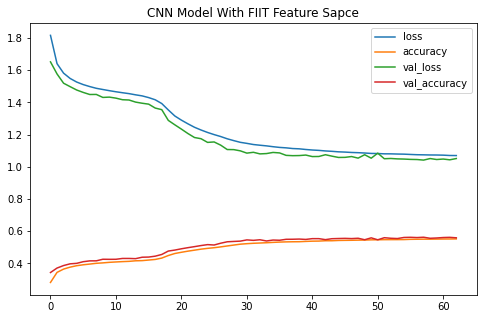

Accuracy at SNR = -20 is 0.10216666666666667%


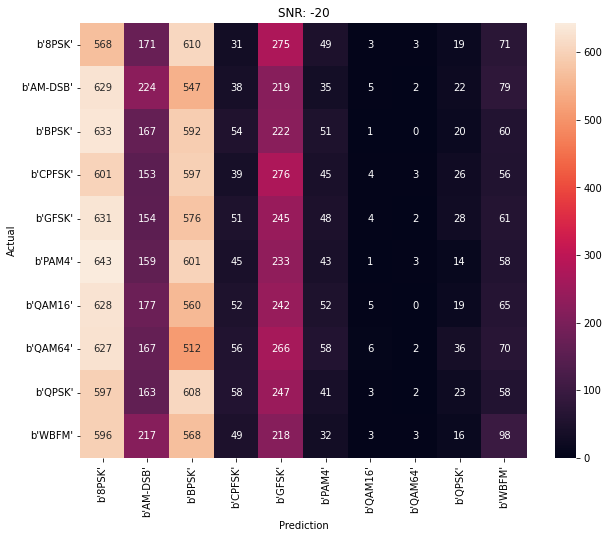

Accuracy at SNR = -18 is 0.10805555555555556%


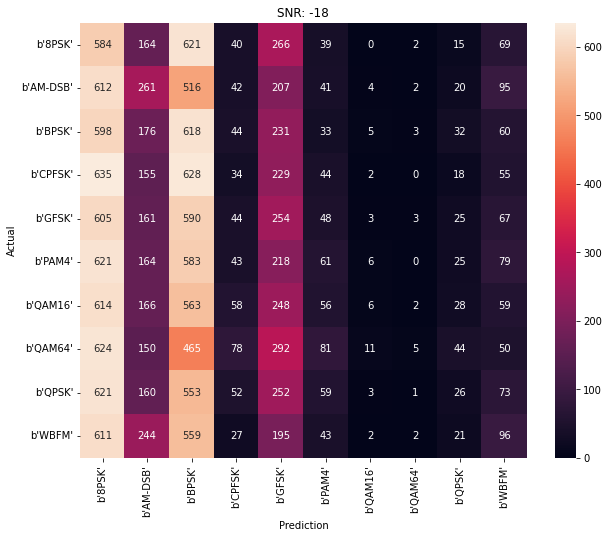

Accuracy at SNR = -16 is 0.11811111111111111%


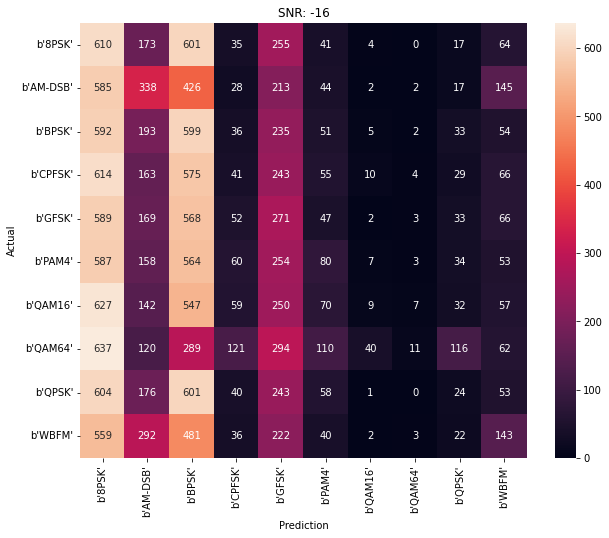

Accuracy at SNR = -14 is 0.143%


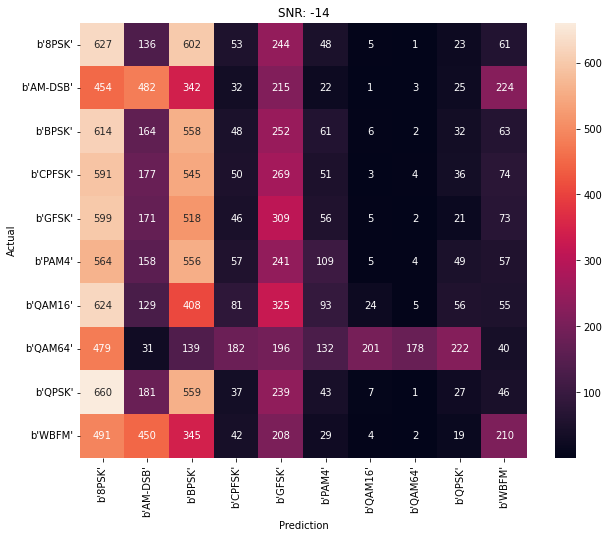

Accuracy at SNR = -12 is 0.19088888888888889%


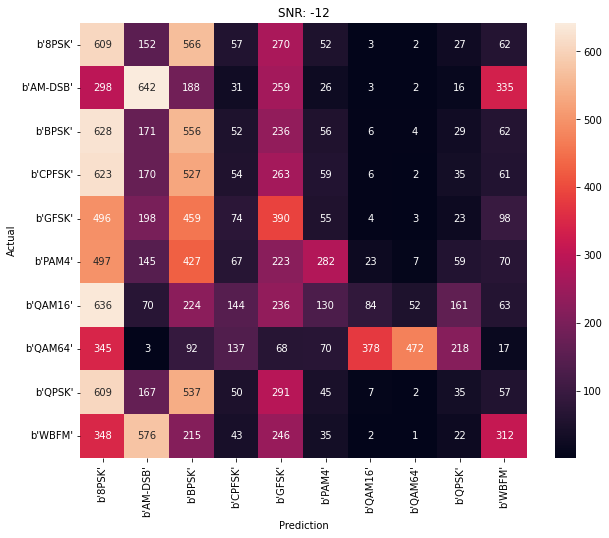

Accuracy at SNR = -10 is 0.26416666666666666%


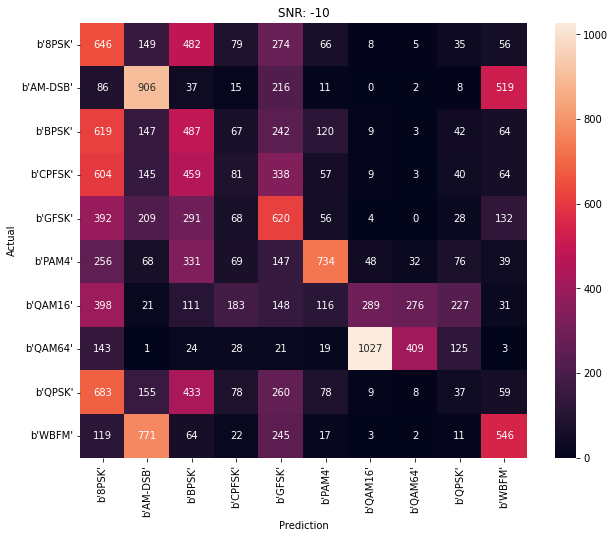

Accuracy at SNR = -8 is 0.3638888888888889%


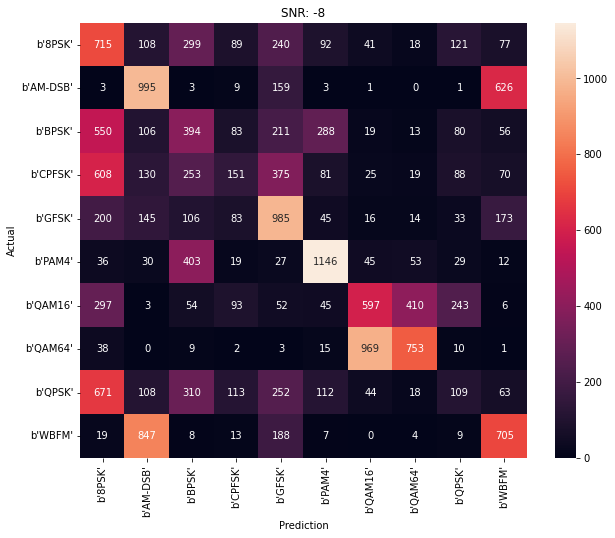

Accuracy at SNR = -6 is 0.4752777777777778%


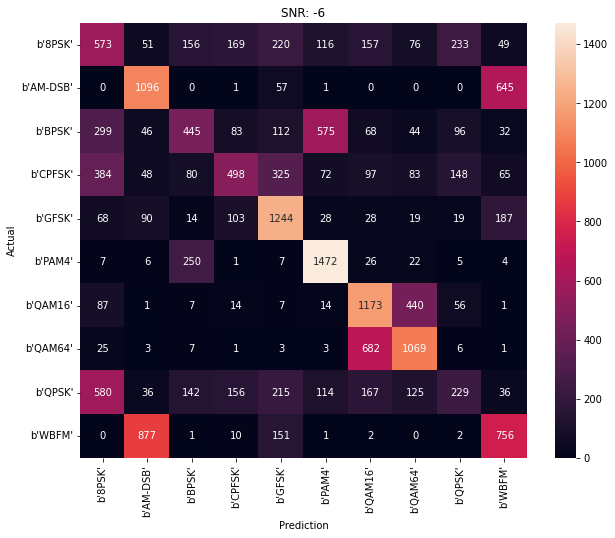

Accuracy at SNR = -4 is 0.5982777777777778%


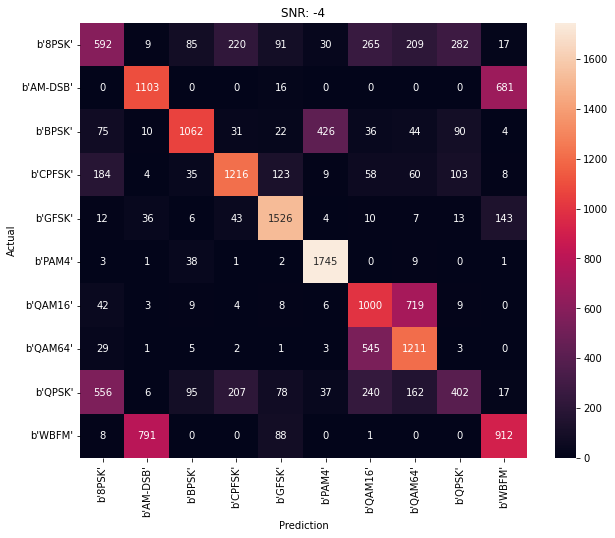

Accuracy at SNR = -2 is 0.6952222222222222%


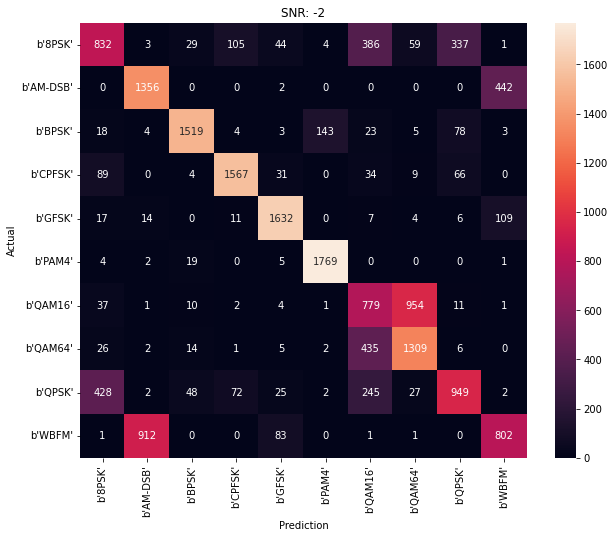

Accuracy at SNR = 0 is 0.7738888888888888%


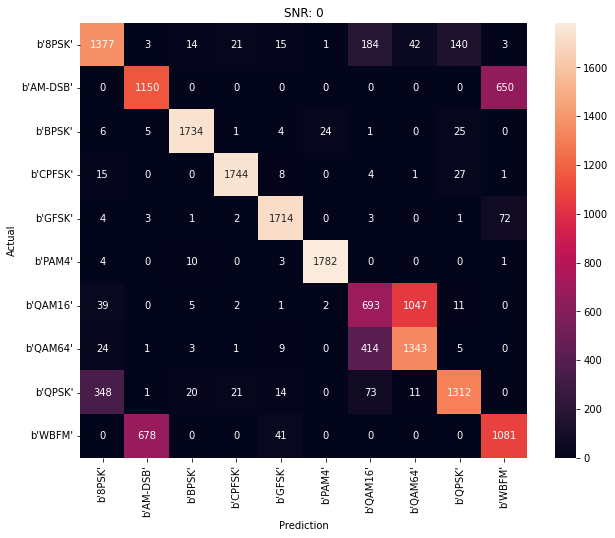

Accuracy at SNR = 2 is 0.8082777777777778%


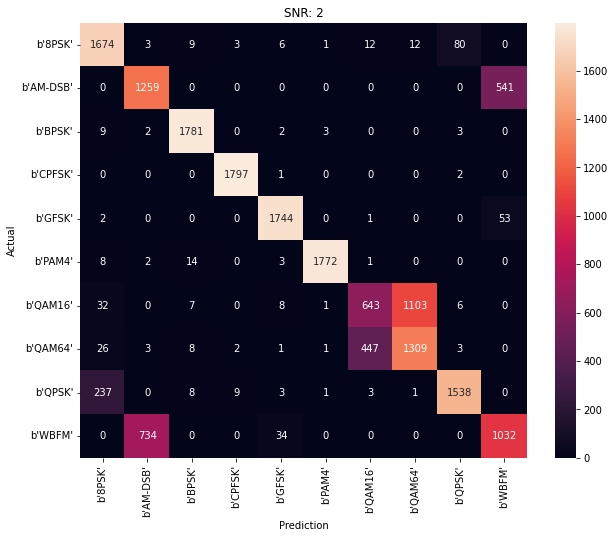

Accuracy at SNR = 4 is 0.8175555555555556%


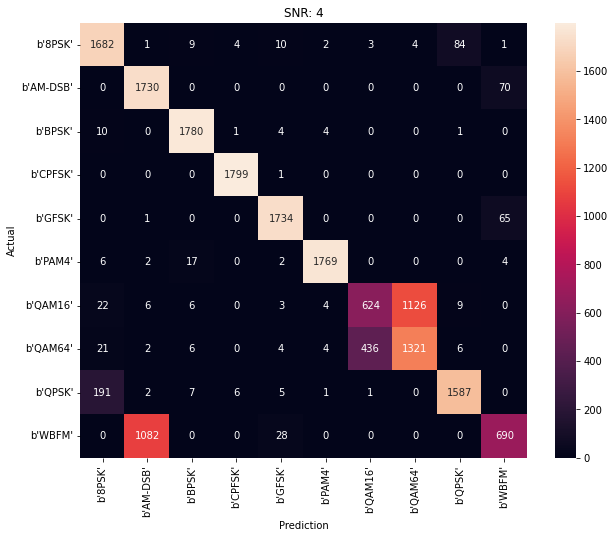

Accuracy at SNR = 6 is 0.8262222222222222%


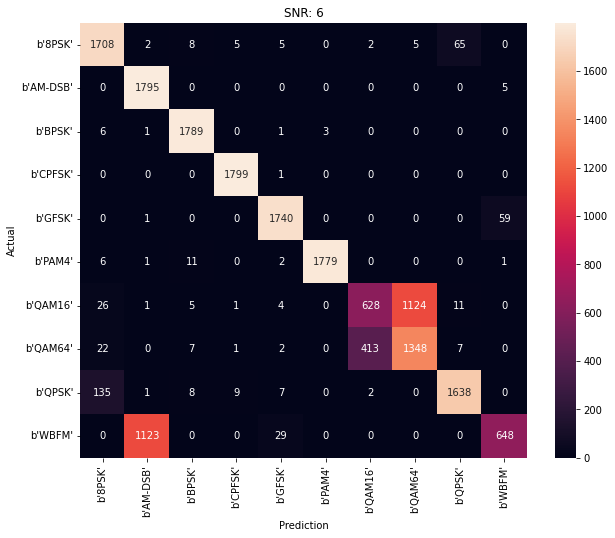

Accuracy at SNR = 8 is 0.8232222222222222%


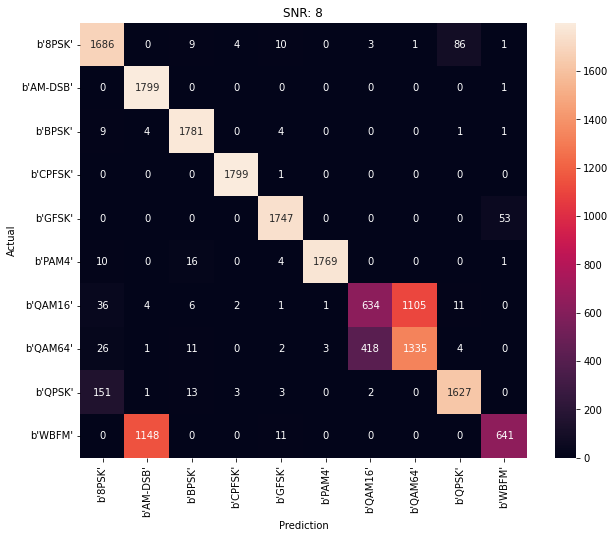

Accuracy at SNR = 10 is 0.8289444444444445%


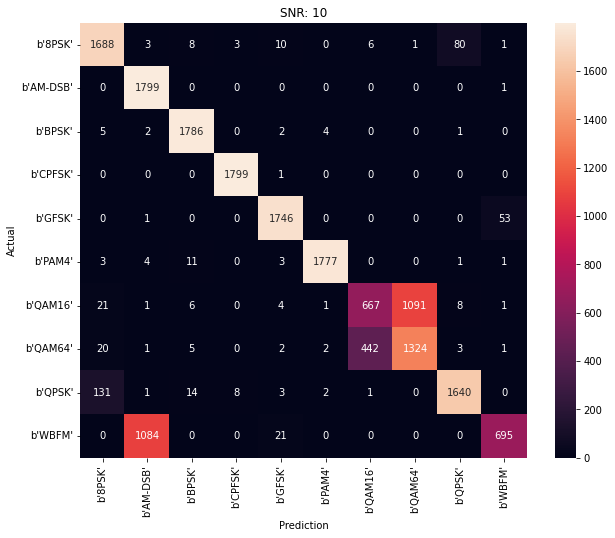

Accuracy at SNR = 12 is 0.8225555555555556%


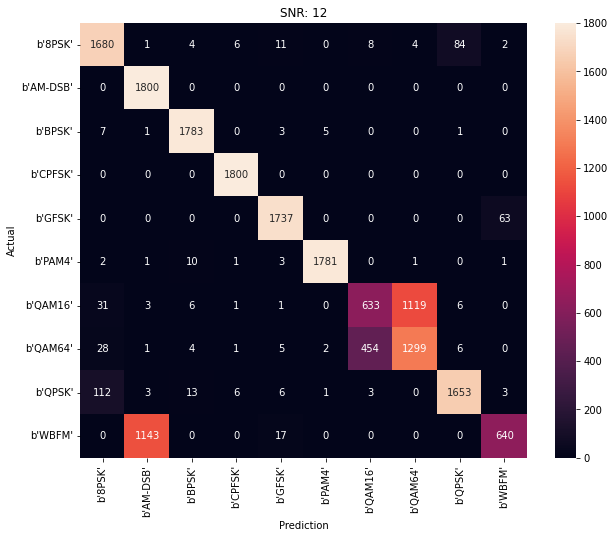

Accuracy at SNR = 14 is 0.8226111111111111%


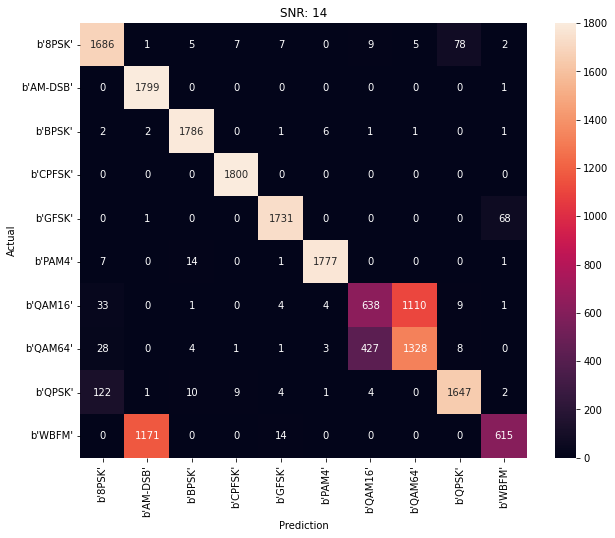

Accuracy at SNR = 16 is 0.8242777777777778%


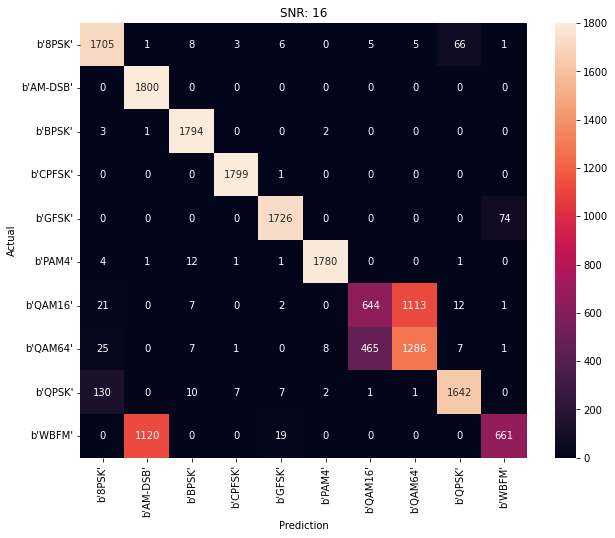

Accuracy at SNR = 18 is 0.8263888888888888%


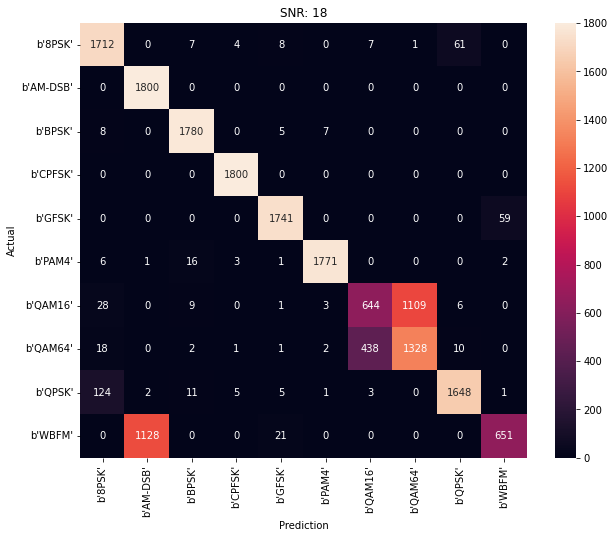

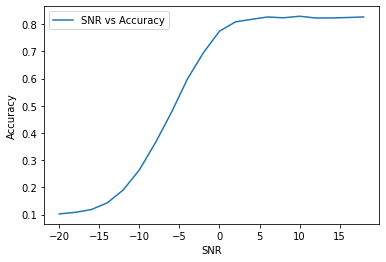

In [34]:
plot_model_history(history, 'CNN Model With FIIT Feature Sapce')
model_scoring(cnn_model, history, fiit_testing_data, testing_pair_labels)

## Reshaping data for RNN and LSTM models

In [31]:
fiit_training_data, fiit_validation_data, fiit_testing_data = reshape_data_for_rnn_lstm(fiit_training_data, fiit_validation_data, fiit_testing_data)

In [32]:
print('training data shape:', fiit_training_data.shape)
print('validation data shape:', fiit_validation_data.shape)
print('testing data shape:', fiit_testing_data.shape)

training data shape: (798000, 2, 128)
validation data shape: (42000, 2, 128)
testing data shape: (360000, 2, 128)


## RNN Model

In [33]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [34]:
rnn_model = Sequential()
rnn_model.add(SimpleRNN(128, activation='relu'))
#rnn_model.add(Dropout(0.5))
rnn_model.add(Dense(10, activation='softmax'))
rnn_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))


In [39]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/rnn_fiit_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = rnn_model.fit(fiit_training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(fiit_validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

Epoch 1/200
1555/1559 [============================>.] - ETA: 0s - loss: 1.8557 - accuracy: 0.2679
Epoch 1: val_loss improved from inf to 1.74447, saving model to saved_models/rnn_fiit_classification.hdf5
1559/1559 [==============================] - 9s 5ms/step - loss: 1.8555 - accuracy: 0.2680 - val_loss: 1.7445 - val_accuracy: 0.3001
Epoch 2/200
1556/1559 [============================>.] - ETA: 0s - loss: 1.6958 - accuracy: 0.3110
Epoch 2: val_loss improved from 1.74447 to 1.66137, saving model to saved_models/rnn_fiit_classification.hdf5
1559/1559 [==============================] - 8s 5ms/step - loss: 1.6958 - accuracy: 0.3110 - val_loss: 1.6614 - val_accuracy: 0.3232
Epoch 3/200
1555/1559 [============================>.] - ETA: 0s - loss: 1.6369 - accuracy: 0.3287
Epoch 3: val_loss improved from 1.66137 to 1.62020, saving model to saved_models/rnn_fiit_classification.hdf5
1559/1559 [==============================] - 8s 5ms/step - loss: 1.6368 - accuracy: 0.3287 - val_loss: 1.6202 -

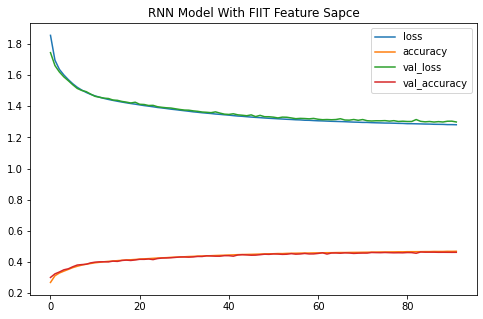

Accuracy at SNR = -20 is 0.10438888888888889%


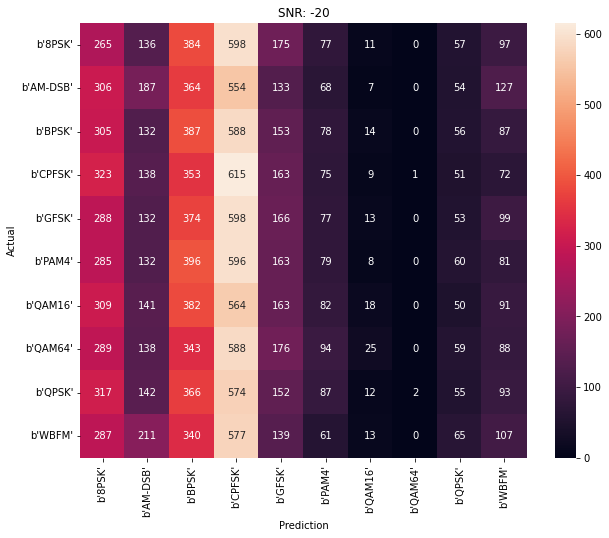

Accuracy at SNR = -18 is 0.10616666666666667%


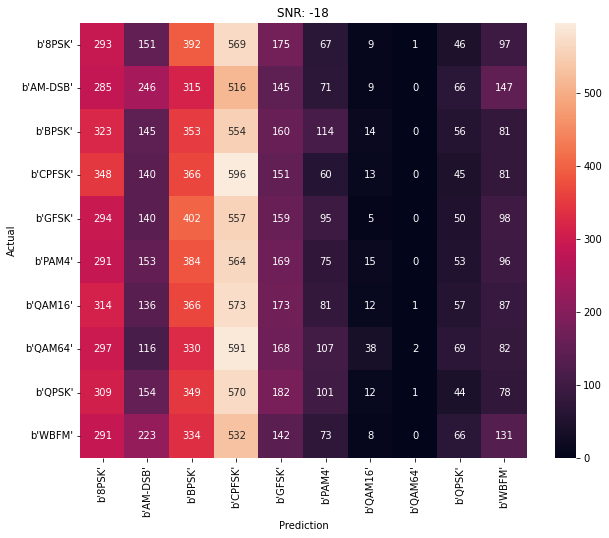

Accuracy at SNR = -16 is 0.11566666666666667%


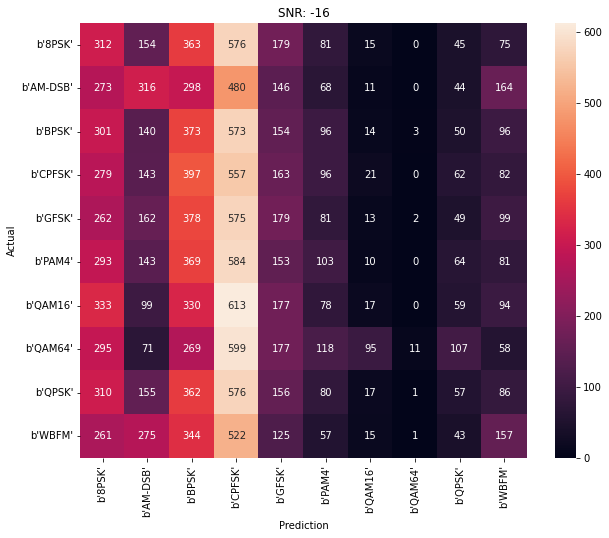

Accuracy at SNR = -14 is 0.13627777777777778%


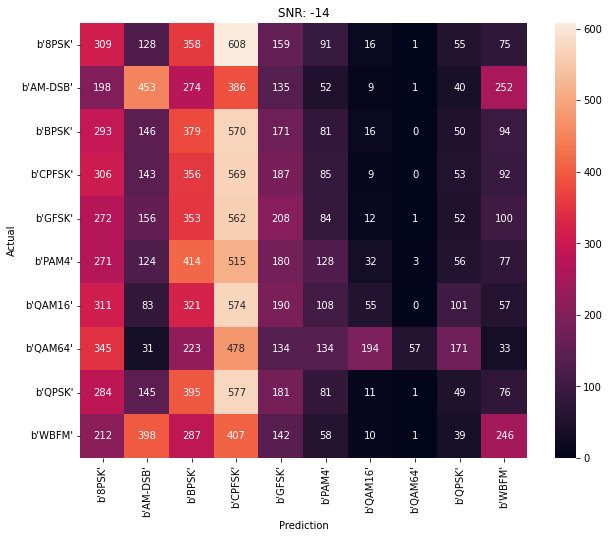

Accuracy at SNR = -12 is 0.17272222222222222%


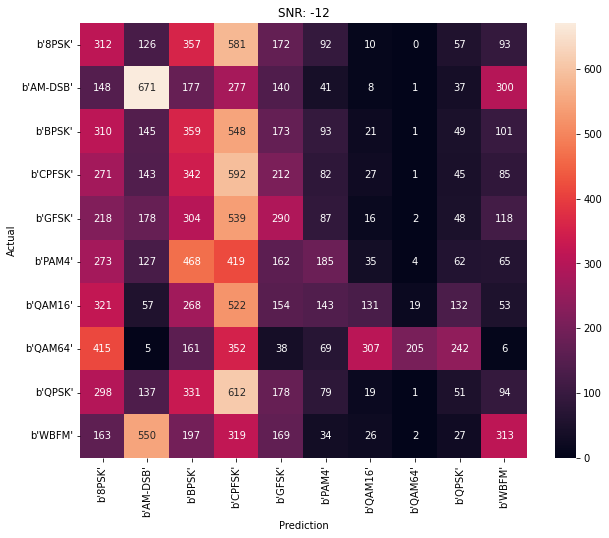

Accuracy at SNR = -10 is 0.24566666666666667%


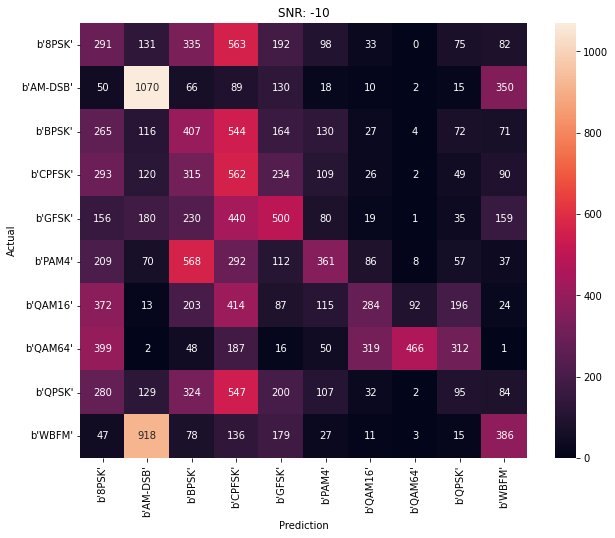

Accuracy at SNR = -8 is 0.3244444444444444%


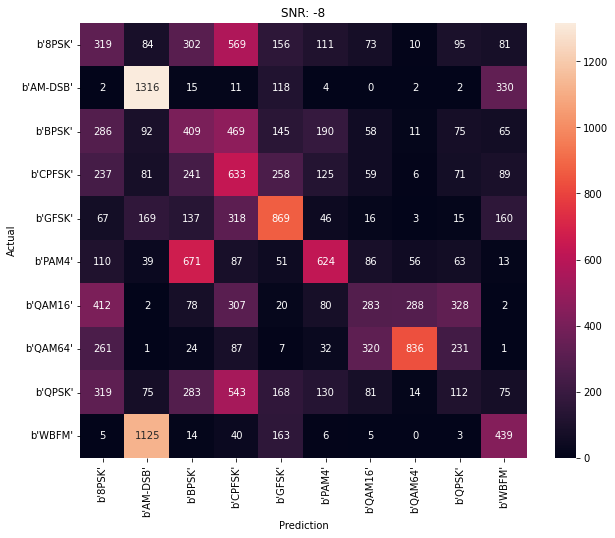

Accuracy at SNR = -6 is 0.40255555555555556%


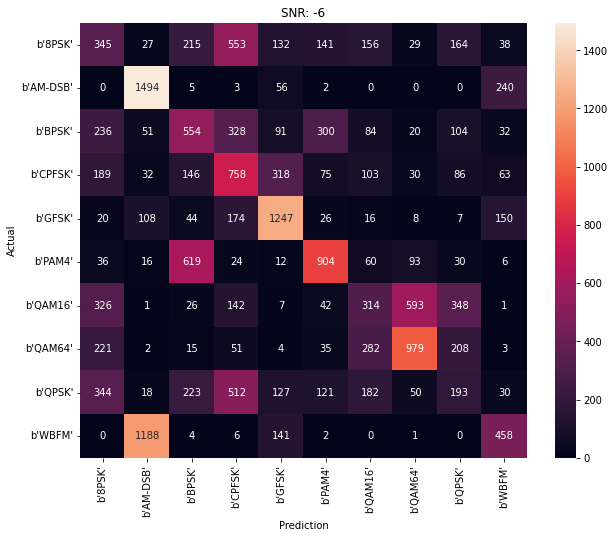

Accuracy at SNR = -4 is 0.4857222222222222%


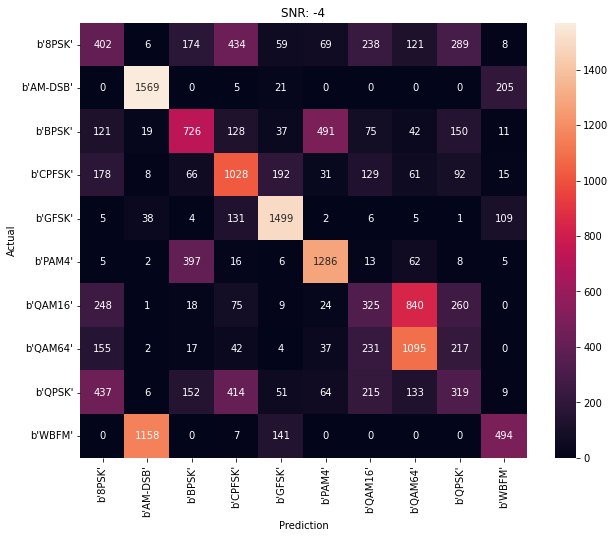

Accuracy at SNR = -2 is 0.5662222222222222%


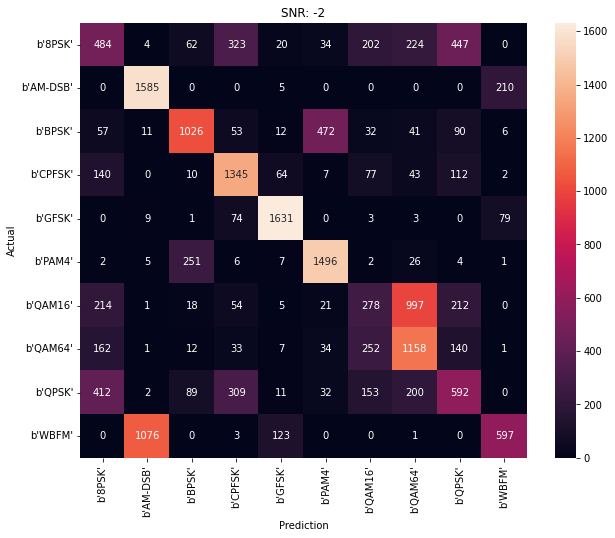

Accuracy at SNR = 0 is 0.6167222222222222%


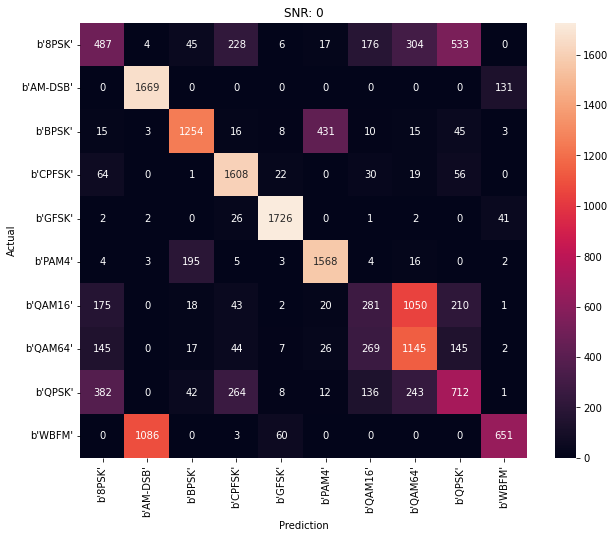

Accuracy at SNR = 2 is 0.6416666666666667%


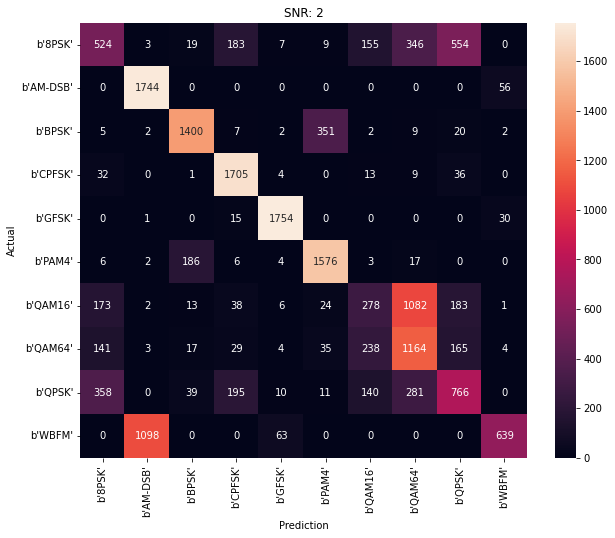

Accuracy at SNR = 4 is 0.6548888888888889%


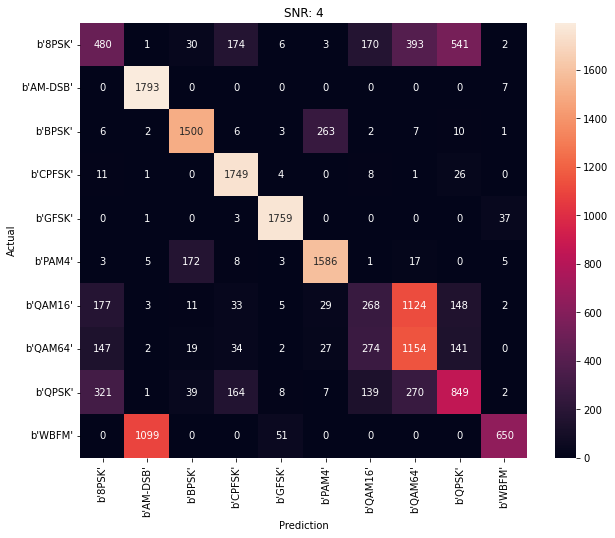

Accuracy at SNR = 6 is 0.66%


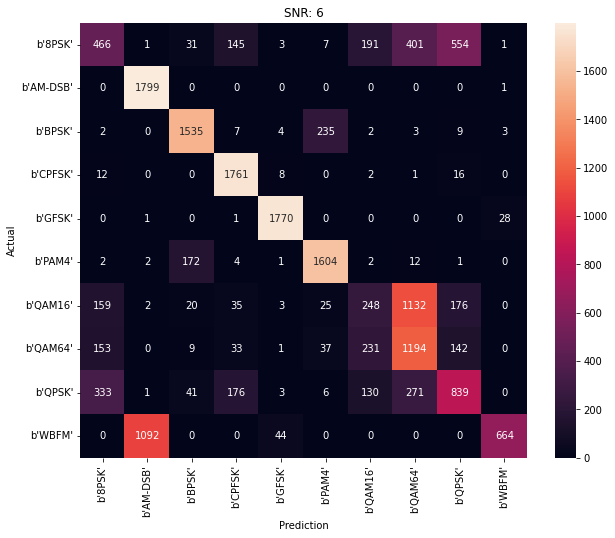

Accuracy at SNR = 8 is 0.6590555555555555%


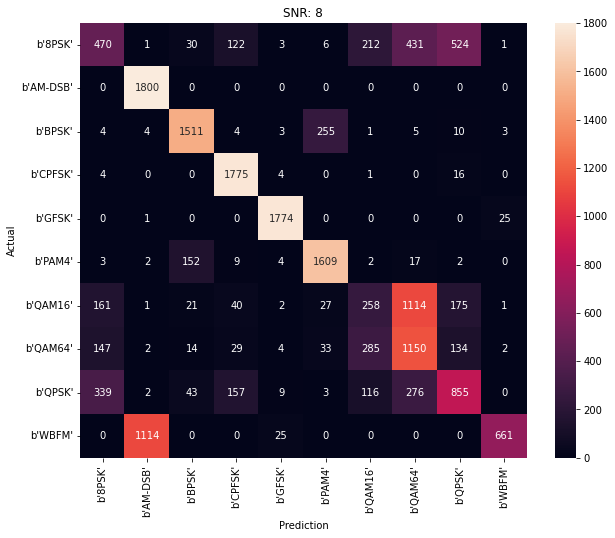

Accuracy at SNR = 10 is 0.6657777777777778%


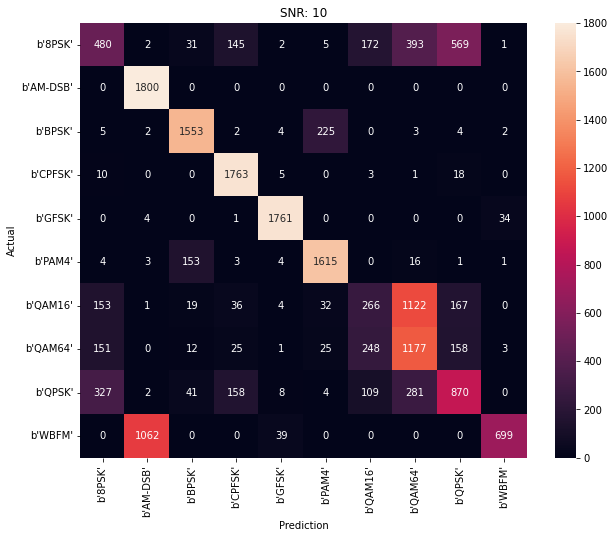

Accuracy at SNR = 12 is 0.6636666666666666%


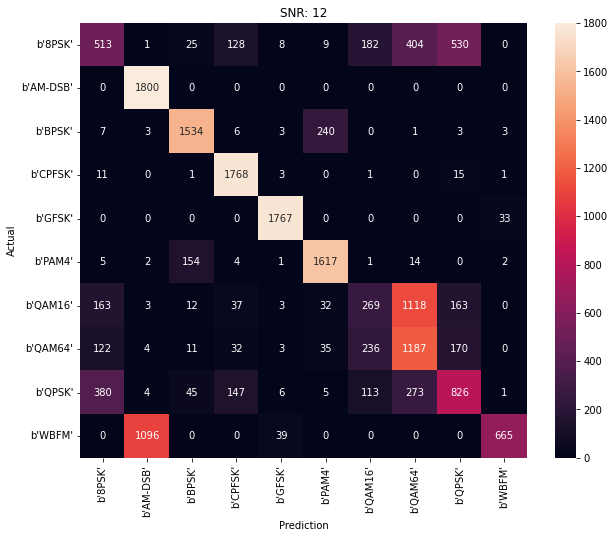

Accuracy at SNR = 14 is 0.6656666666666666%


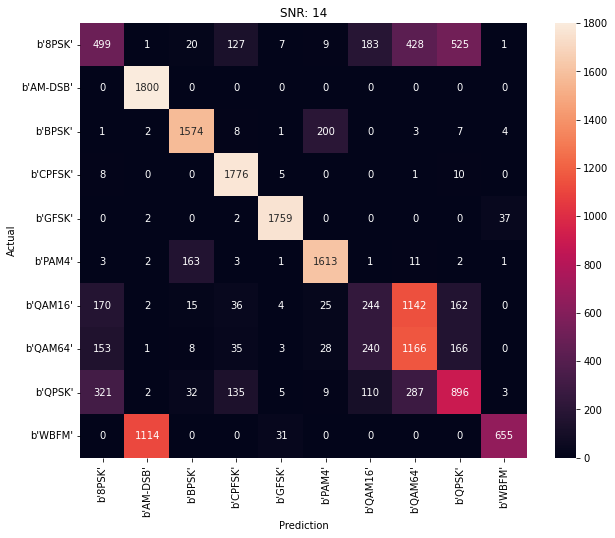

Accuracy at SNR = 16 is 0.669%


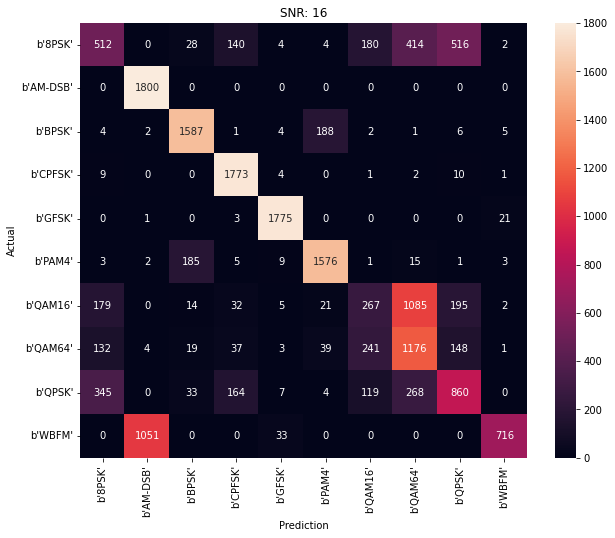

Accuracy at SNR = 18 is 0.6662222222222223%


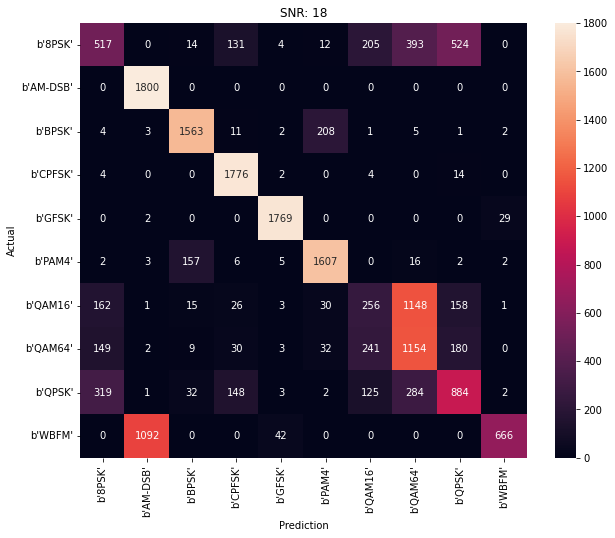

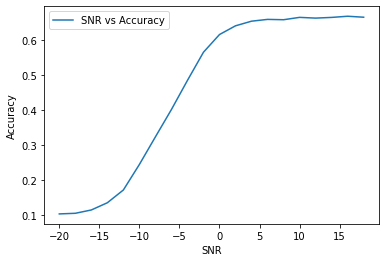

In [40]:
plot_model_history(history, 'RNN Model With FIIT Feature Sapce')
model_scoring(rnn_model, history, fiit_testing_data, testing_pair_labels)

## LSTM Model

In [41]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [42]:
lstm_model = Sequential()
lstm_model.add(LSTM(256))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(10, activation='softmax'))
lstm_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))

In [43]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/lstm_fiit_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = lstm_model.fit(fiit_training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(fiit_validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

Epoch 1/200
1550/1559 [============================>.] - ETA: 0s - loss: 1.9231 - accuracy: 0.2506
Epoch 1: val_loss improved from inf to 1.82238, saving model to saved_models/lstm_fiit_classification.hdf5
1559/1559 [==============================] - 11s 5ms/step - loss: 1.9226 - accuracy: 0.2508 - val_loss: 1.8224 - val_accuracy: 0.2812
Epoch 2/200
1558/1559 [============================>.] - ETA: 0s - loss: 1.7768 - accuracy: 0.2908
Epoch 2: val_loss improved from 1.82238 to 1.71569, saving model to saved_models/lstm_fiit_classification.hdf5
1559/1559 [==============================] - 8s 5ms/step - loss: 1.7768 - accuracy: 0.2908 - val_loss: 1.7157 - val_accuracy: 0.3097
Epoch 3/200
1551/1559 [============================>.] - ETA: 0s - loss: 1.7013 - accuracy: 0.3116
Epoch 3: val_loss improved from 1.71569 to 1.65902, saving model to saved_models/lstm_fiit_classification.hdf5
1559/1559 [==============================] - 7s 5ms/step - loss: 1.7011 - accuracy: 0.3117 - val_loss: 1.65

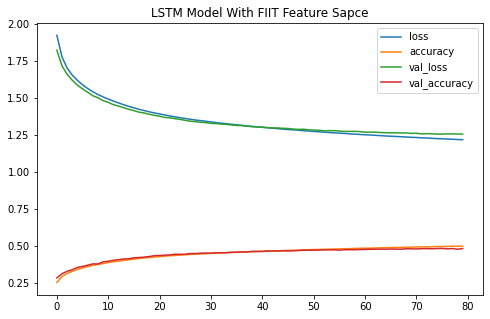

Accuracy at SNR = -20 is 0.10527777777777778%


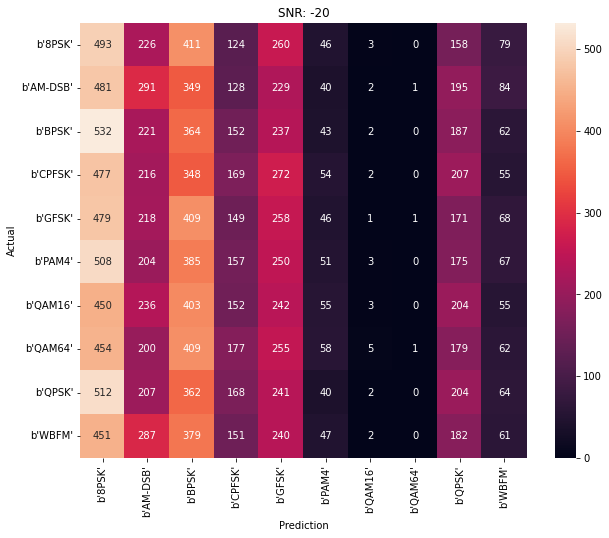

Accuracy at SNR = -18 is 0.10561111111111111%


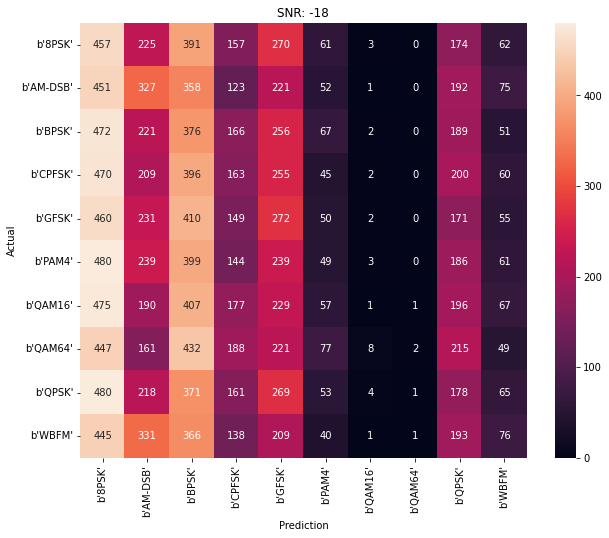

Accuracy at SNR = -16 is 0.11888888888888889%


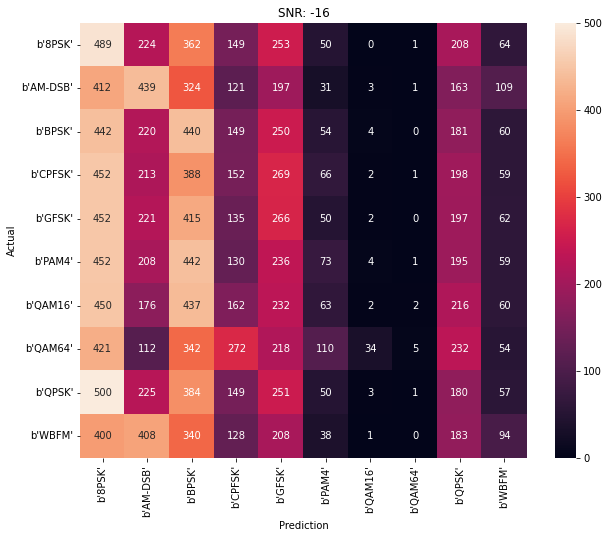

Accuracy at SNR = -14 is 0.13805555555555554%


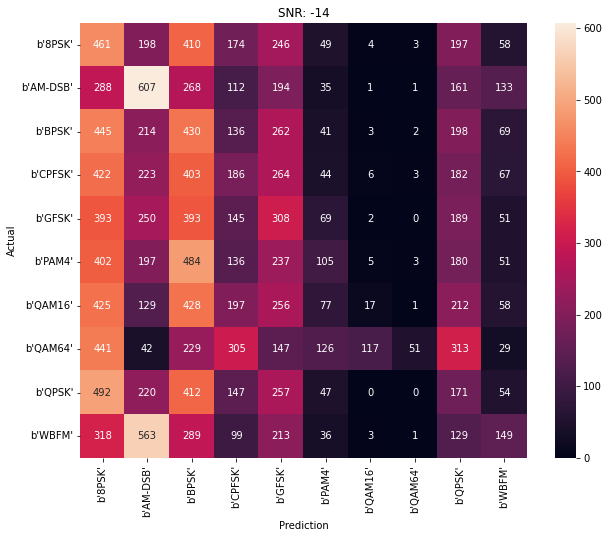

Accuracy at SNR = -12 is 0.173%


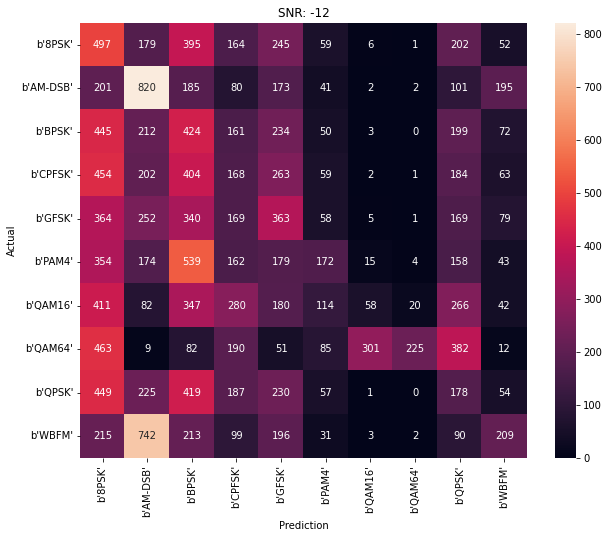

Accuracy at SNR = -10 is 0.24888888888888888%


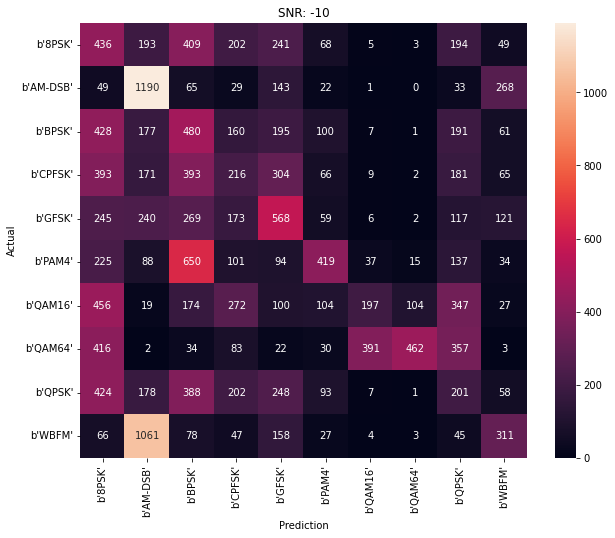

Accuracy at SNR = -8 is 0.3358888888888889%


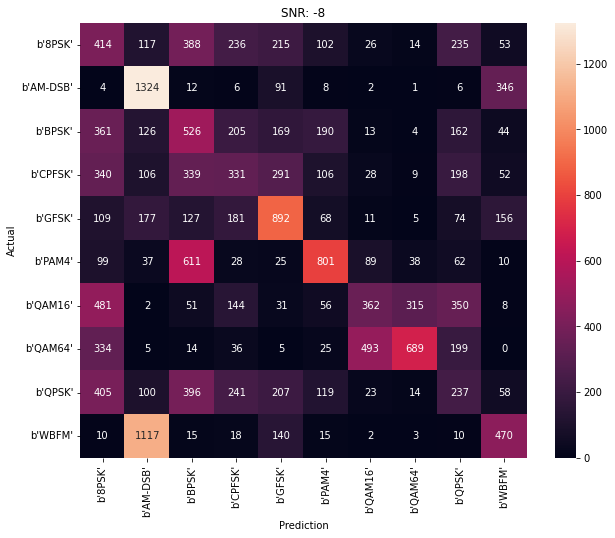

Accuracy at SNR = -6 is 0.41988888888888887%


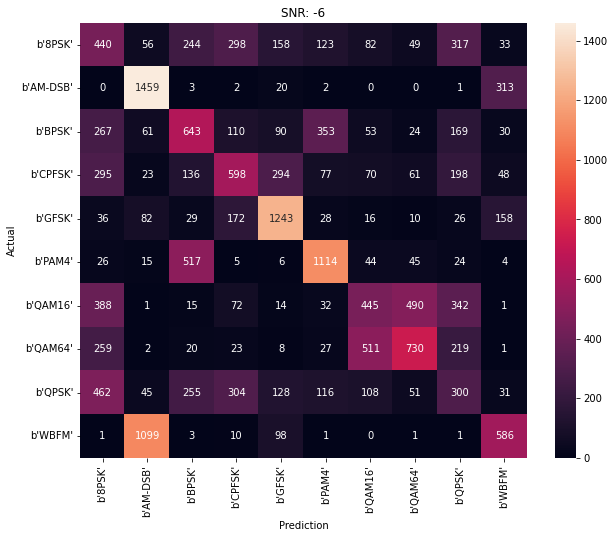

Accuracy at SNR = -4 is 0.5016111111111111%


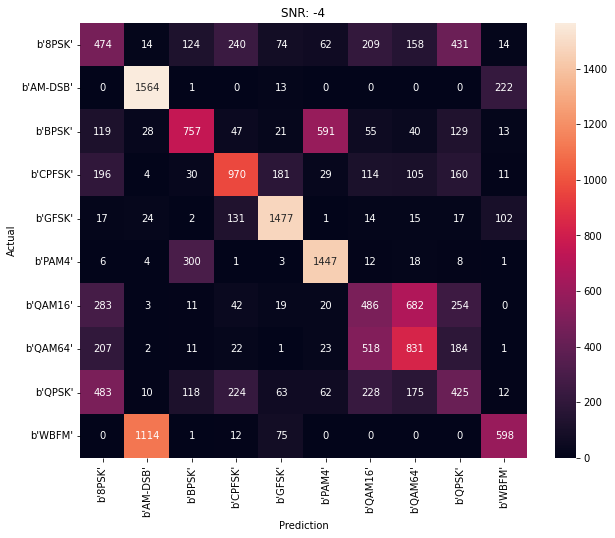

Accuracy at SNR = -2 is 0.5816111111111111%


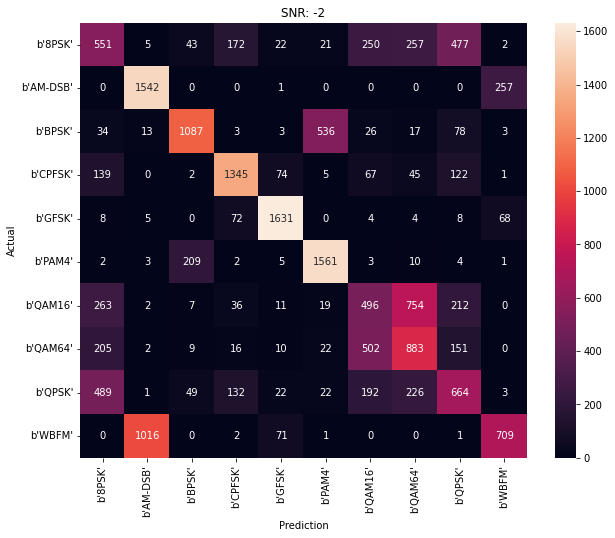

Accuracy at SNR = 0 is 0.6391666666666667%


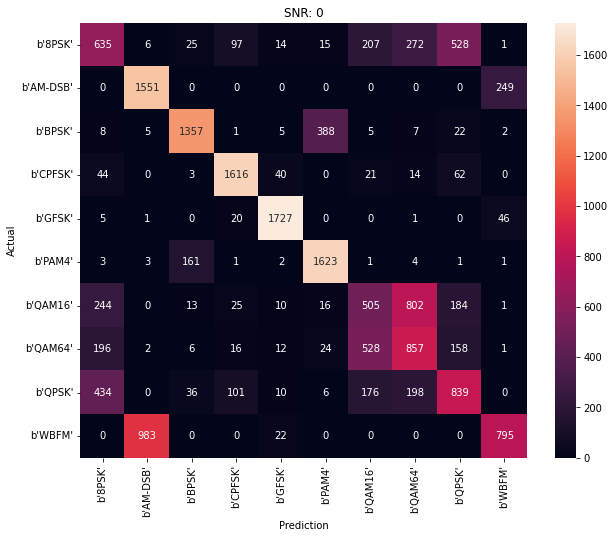

Accuracy at SNR = 2 is 0.6653888888888889%


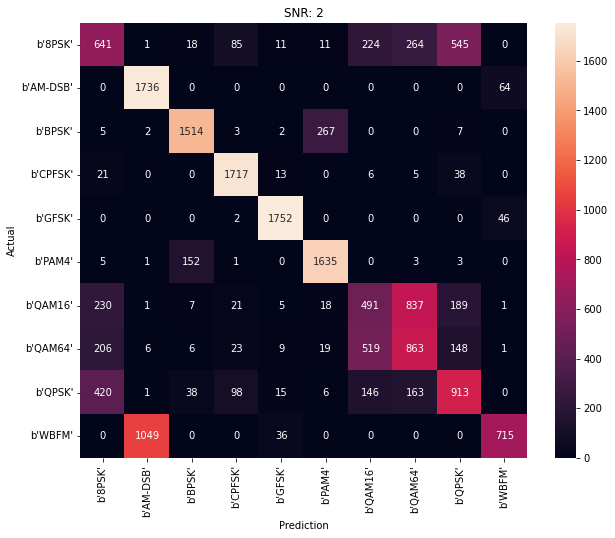

Accuracy at SNR = 4 is 0.6785555555555556%


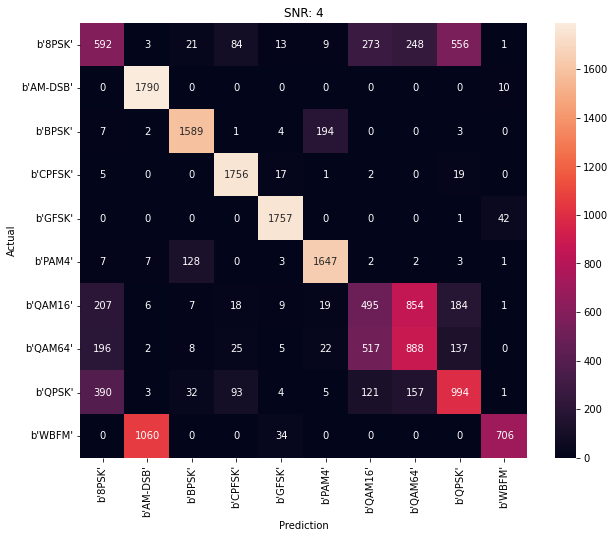

Accuracy at SNR = 6 is 0.6855555555555556%


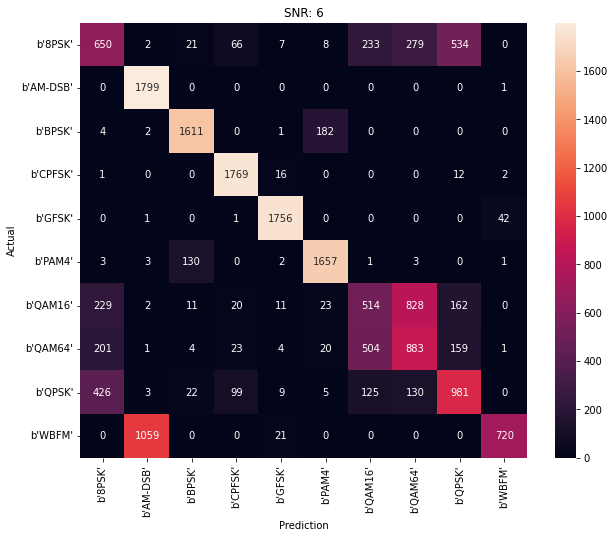

Accuracy at SNR = 8 is 0.6855%


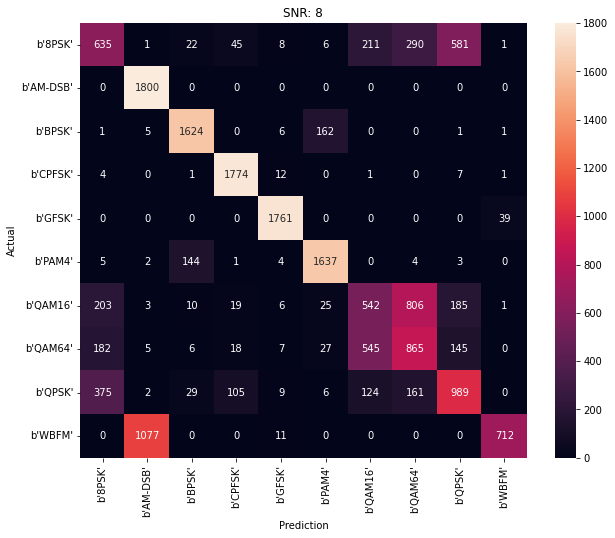

Accuracy at SNR = 10 is 0.6896111111111111%


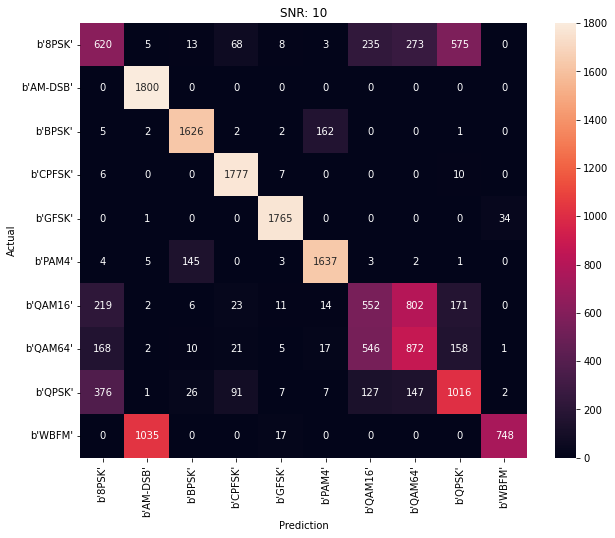

Accuracy at SNR = 12 is 0.6848888888888889%


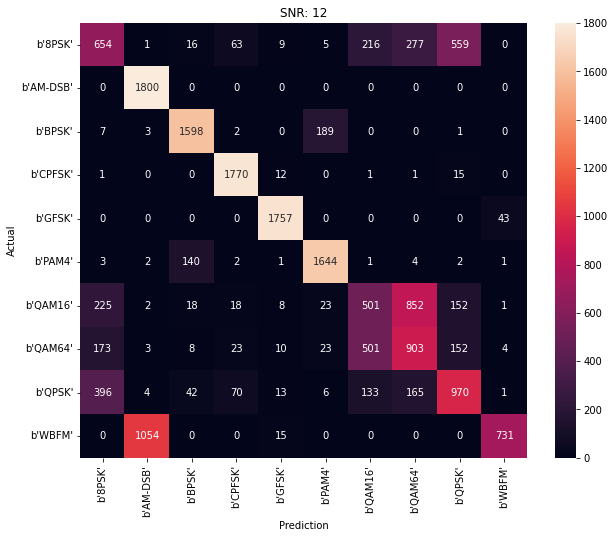

Accuracy at SNR = 14 is 0.6827222222222222%


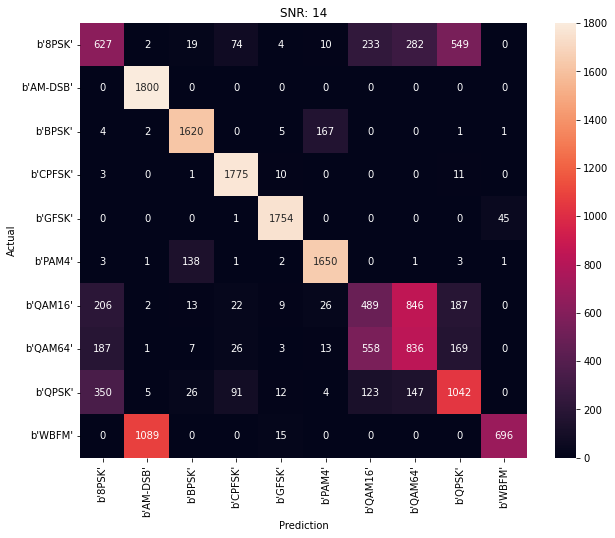

Accuracy at SNR = 16 is 0.6963888888888888%


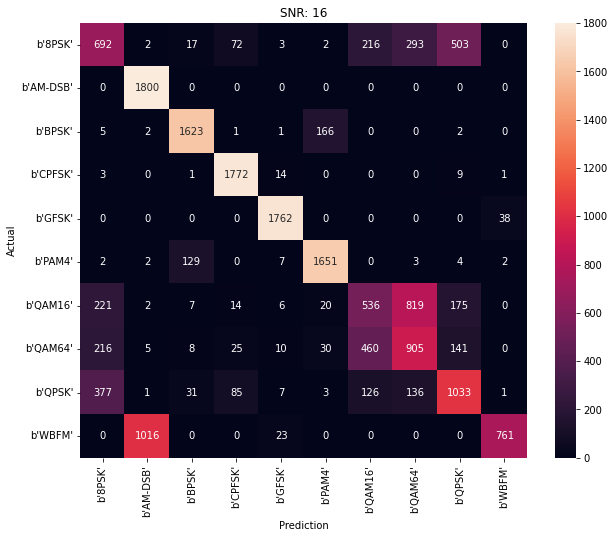

Accuracy at SNR = 18 is 0.6857777777777778%


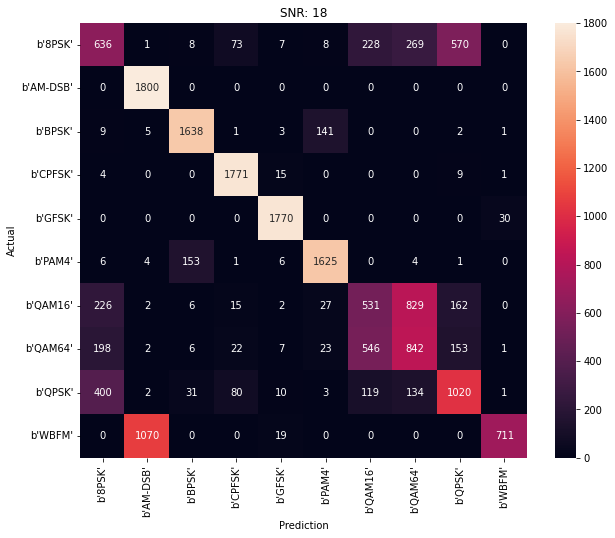

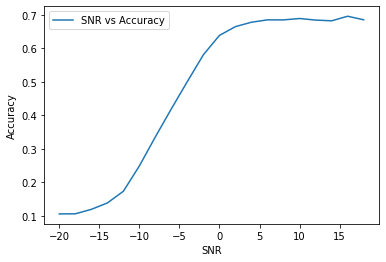

In [44]:
plot_model_history(history, 'LSTM Model With FIIT Feature Sapce')
model_scoring(lstm_model, history, fiit_testing_data, testing_pair_labels)

# Combined Feature Space

In [35]:
Combined_training_data = np.concatenate((training_data ,fdit_training_data, fiit_training_data), axis=2)
Combined_validation_data = np.concatenate((validation_data ,fdit_validation_data, fiit_validation_data), axis=2)
Combined_testing_data = np.concatenate((testing_data ,fdit_testing_data, fiit_testing_data), axis=2)

In [36]:
print('combined training data shape:', fiit_training_data.shape)
print('combined validation data shape:', fiit_validation_data.shape)
print('combined testing data shape:', fiit_testing_data.shape)

combined training data shape: (798000, 2, 128)
combined validation data shape: (42000, 2, 128)
combined testing data shape: (360000, 2, 128)


In [37]:
del training_data
del fdit_training_data
del fiit_training_data

del validation_data
del fdit_validation_data
del fiit_validation_data

del testing_data
del fdit_testing_data
del fiit_testing_data

## CNN Model

In [38]:
Combined_training_data, Combined_validation_data, Combined_testing_data = reshape_data_for_cnn(Combined_training_data, Combined_validation_data, Combined_testing_data)

In [39]:
print('training data shape:', Combined_training_data.shape)
print('validation data shape:', Combined_validation_data.shape)
print('testing data shape:', Combined_testing_data.shape)

training data shape: (798000, 2, 384, 1)
validation data shape: (42000, 2, 384, 1)
testing data shape: (360000, 2, 384, 1)


In [40]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [41]:
cnn_model = Sequential()
cnn_model.add(Conv2D(256, 3, activation='relu', padding='same'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Conv2D(64, 3, strides=2, activation='relu', padding='same'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Flatten())
cnn_model.add(Dense(128, activation='relu' ))
cnn_model.add(Dense(10,  activation='softmax'))
cnn_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))

In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/cnn_combined_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = cnn_model.fit(Combined_training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(Combined_validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

Epoch 1/200
1046/1559 [===================>..........] - ETA: 1:03 - loss: 1.6027 - accuracy: 0.3464

In [ ]:
plot_model_history(history, 'CNN Model With Combined Feature Sapce')
model_scoring(cnn_model, history, Combined_testing_data, testing_pair_labels)

## Reshaping data for RNN and LSTM models

In [ ]:
Combined_training_data, Combined_validation_data, Combined_testing_data = reshape_data_for_rnn_lstm(Combined_training_data, Combined_validation_data, Combined_testing_data)

In [ ]:
print('training data shape:', Combined_training_data.shape)
print('validation data shape:', Combined_validation_data.shape)
print('testing data shape:', Combined_testing_data.shape)

## RNN Model

In [ ]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [ ]:
rnn_model = Sequential()
rnn_model.add(SimpleRNN(128, activation='relu'))
#rnn_model.add(Dropout(0.5))
rnn_model.add(Dense(10, activation='softmax'))
rnn_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))


In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/rnn_combined_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = rnn_model.fit(Combined_training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(Combined_validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

In [ ]:
plot_model_history(history, 'RNN Model With Combined Feature Sapce')
model_scoring(rnn_model, history, Combined_testing_data, testing_pair_labels)

## LSTM Model

In [ ]:
learning_rate = 0.001
batch_size = 512
epochs = 200

In [ ]:
lstm_model = Sequential()
lstm_model.add(LSTM(256))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(10, activation='softmax'))
lstm_model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), metrics='accuracy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))

In [ ]:
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True,)
checkpointer = ModelCheckpoint(filepath='saved_models/lstm_combined_classification.hdf5', verbose=1, save_best_only=True)

with tf.device('/device:GPU:0'):
  history = lstm_model.fit(Combined_training_data, training_onehot, batch_size=batch_size, epochs=epochs, validation_data=(Combined_validation_data, validation_onehot), callbacks=[es, checkpointer], verbose=1)

In [ ]:
plot_model_history(history, 'LSTM Model With Combined Feature Sapce')
model_scoring(lstm_model, history, Combined_testing_data, testing_pair_labels)